In [1]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.preprocessing import MinMaxScaler


import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

In [2]:
#reading each xlsx and changing columns to match to then concat
df2014 = pd.read_excel('data/ttc-streetcar-delay-data-2014.xlsx')
df2015 = pd.read_excel('data/ttc-streetcar-delay-data-2015.xlsx')
df2016 = pd.read_excel('data/ttc-streetcar-delay-data-2016.xlsx')
df2017 = pd.read_excel('data/ttc-streetcar-delay-data-2017.xlsx')
df2018 = pd.read_excel('data/ttc-streetcar-delay-data-2018.xlsx')
df2019 = pd.read_excel('data/ttc-streetcar-delay-data-2019.xlsx')
df2020 = pd.read_excel('data/ttc-streetcar-delay-data-2020_final.xlsx').rename(columns={'Delay':'Min Delay',
                                                                                  'Gap':'Min Gap'})
df2021 = pd.read_excel('data/ttc-streetcar-delay-data-jan-2021-to-august-2021.xlsx').rename(columns={'Bound':'Direction',
                                                                                               'Date':'Report Date',
                                                                                               'Line':'Route'})

df2014['Time'] = pd.to_datetime(df2014['Time'], format='%H:%M:%S').dt.time
df2015['Time'] = pd.to_datetime(df2015['Time'], format='%H:%M:%S').dt.time
df2016['Time'] = pd.to_datetime(df2016['Time'], format='%H:%M:%S').dt.time
df2017['Time'] = pd.to_datetime(df2017['Time'], format='%H:%M:%S').dt.time
df2018['Time'] = pd.to_datetime(df2018['Time'], format='%H:%M:%S').dt.time
df2019['Time'] = pd.to_datetime(df2019['Time'], format='%H:%M:%S').dt.time
df2020['Time'] = pd.to_datetime(df2020['Time'], format='%H:%M:%S').dt.time
df2021['Time'] = pd.to_datetime(df2021['Time'], format='%H:%M:%S').dt.time

frames = [df2014, df2015, df2016, df2017, df2018, df2019, df2020, df2021]


In [3]:
df = pd.concat(frames)
df = df.rename(columns={'Report Date':'Report_Date','Min Delay':'Min_Delay','Min Gap':'Min_Gap',
                       'Round Time':'Round_Time'})

In [44]:
df

,Report_Date,Route,Time,Day,Location,Incident,Min_Delay,Min_Gap,Direction,Vehicle,Round_Time
0,2014-01-02,505,06:31:00,Thursday,Dundas and Roncesvalles,Late Leaving Garage,4.0,8.0,E/B,4018.0,06:30:00
1,2014-01-02,504,12:43:00,Thursday,King and Shaw,Utilized Off Route,20.0,22.0,E/B,4128.0,12:30:00
2,2014-01-02,501,14:01:00,Thursday,Kingston road and Bingham,Held By,13.0,19.0,W/B,4016.0,14:00:00
3,2014-01-02,504,14:22:00,Thursday,King St. and Roncesvalles Ave.,Investigation,7.0,11.0,W/B,4175.0,14:30:00
4,2014-01-02,504,16:42:00,Thursday,King and Bathurst,Utilized Off Route,3.0,6.0,E/B,4080.0,16:30:00
...,...,...,...,...,...,...,...,...,...,...,...
1013,2021-01-31,501,22:43:00,Sunday,QUEEN AND BROADVIEW,Emergency Services,11.0,21.0,W,4579.0,22:30:00
1014,2021-01-31,504,00:15:00,Sunday,KING AND SPADINA,Mechanical,3.0,8.0,W,4461.0,00:30:00
1015,2021-01-31,510,00:41:00,Sunday,SPADINA STATION,Emergency Services,20.0,30.0,NaN,4603.0,00:30:00
1016,2021-01-31,501,00:46:00,Sunday,QUEEN AND CHURCH,Held By,13.0,23.0,W,4432.0,01:00:00


In [8]:
df_incident = pd.DataFrame(df.groupby('Incident')['Min_Delay'].sum())

## Seaborn Colour Palettes

Add `_r` to any palette to reverse the colours

### Accent

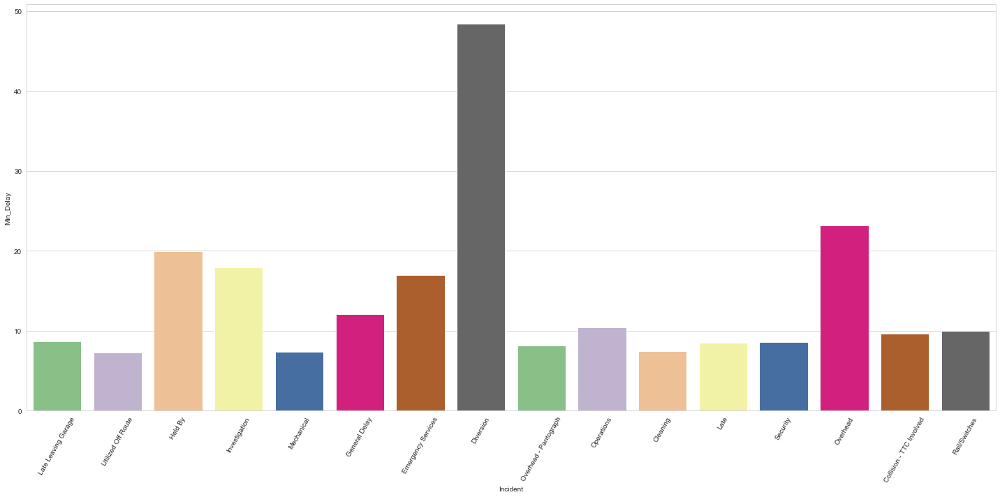

In [14]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='Accent', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

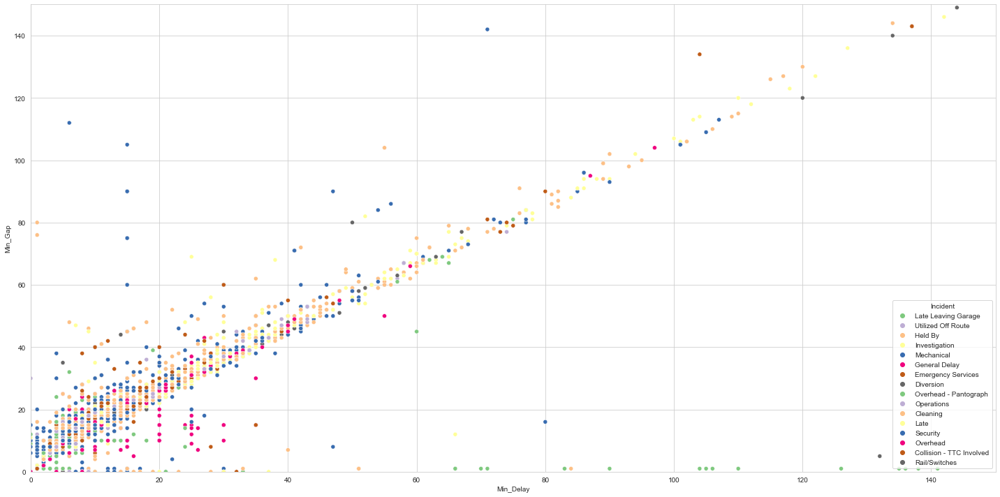

In [73]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='Accent')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### Blues

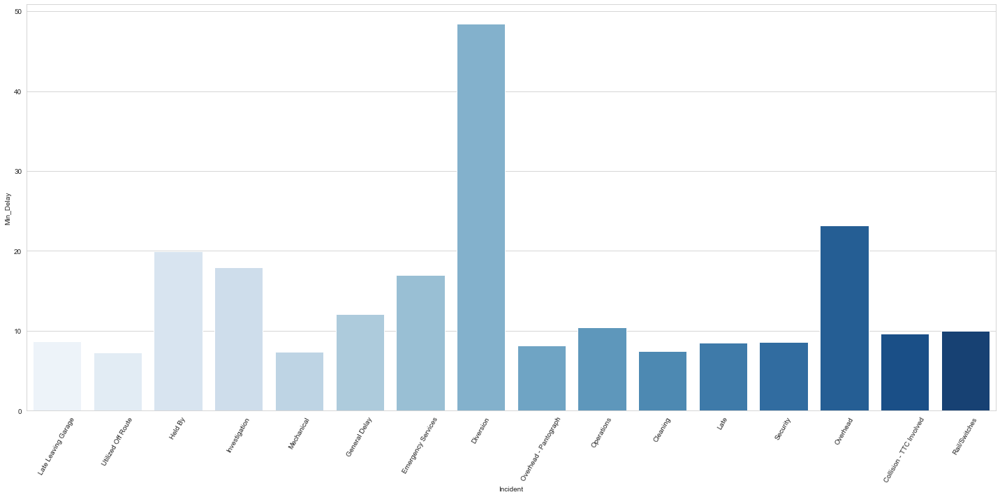

In [16]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='Blues', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

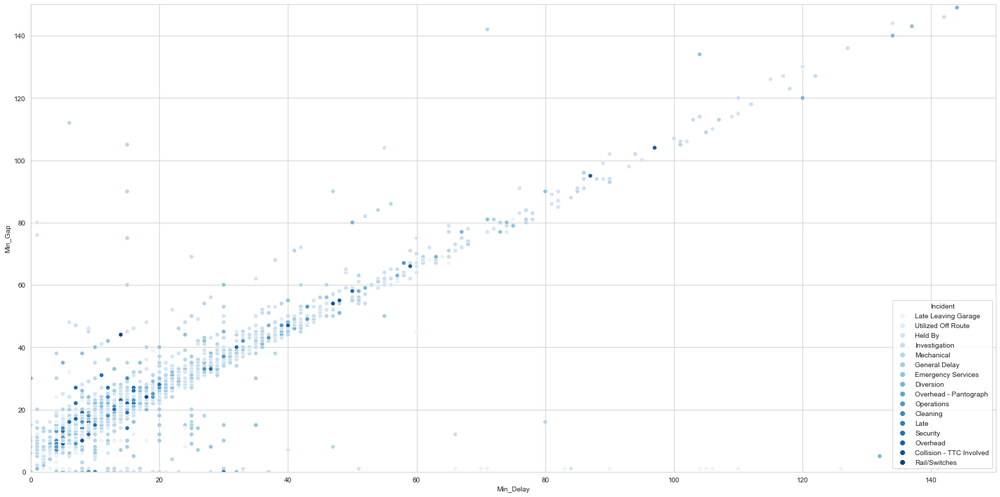

In [74]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='Blues')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### BrBG

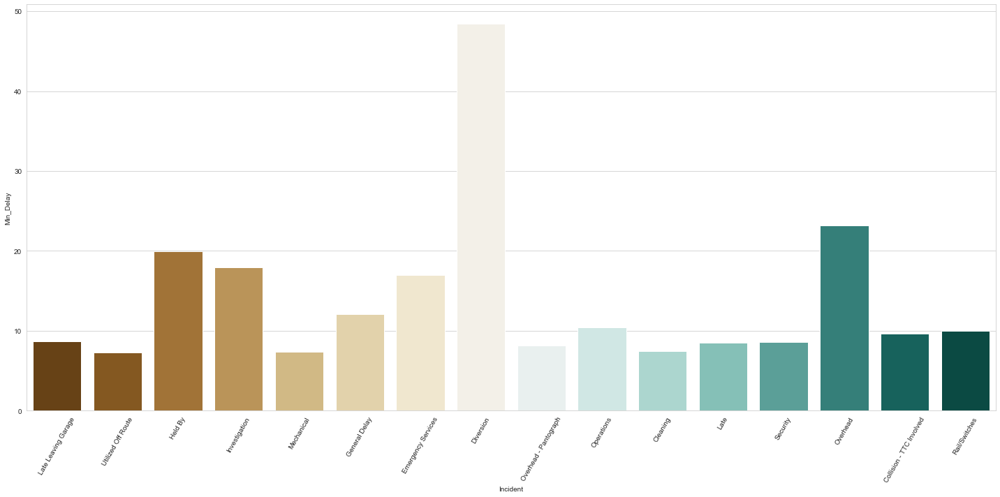

In [19]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='BrBG', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

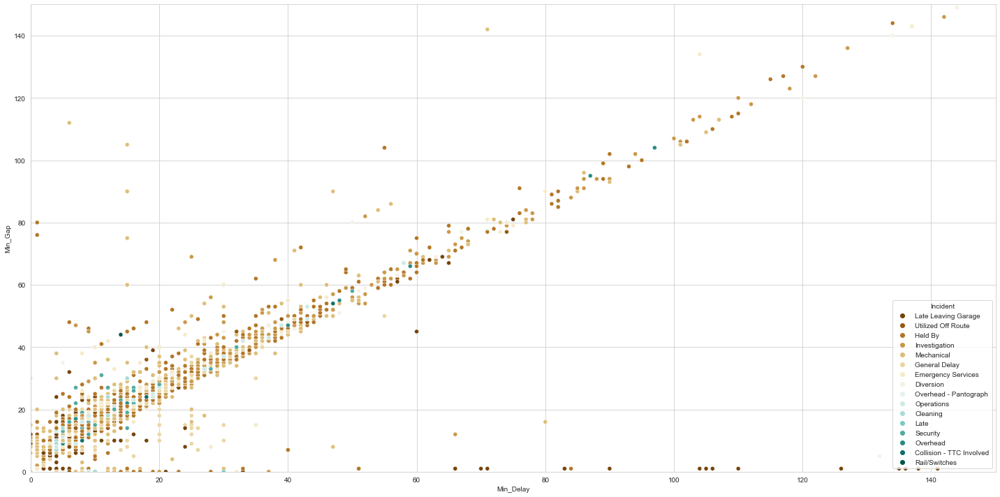

In [75]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='BrBG')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### BuGn

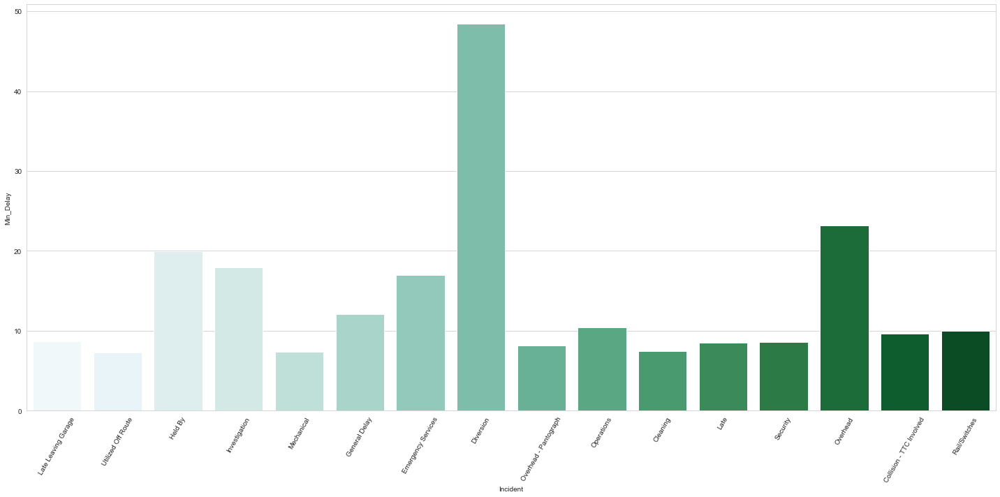

In [22]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='BuGn', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

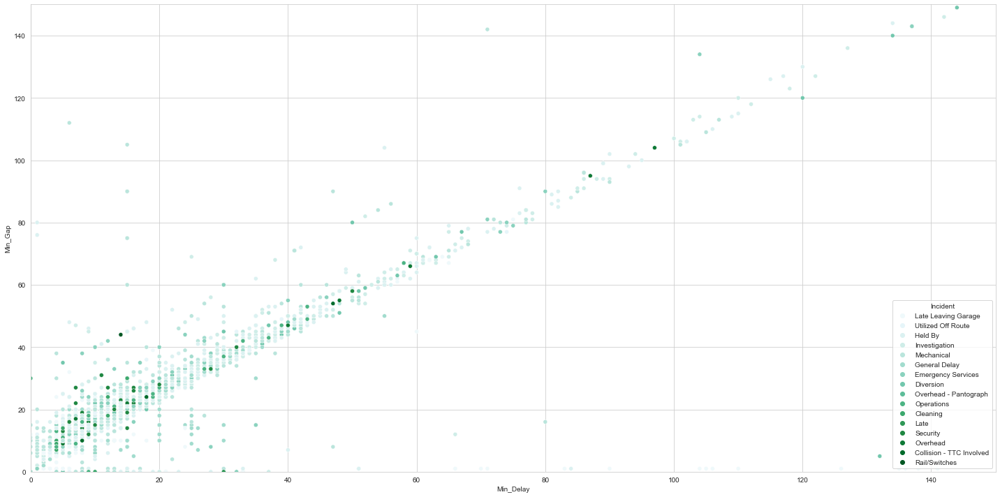

In [76]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='BuGn')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### BuPu

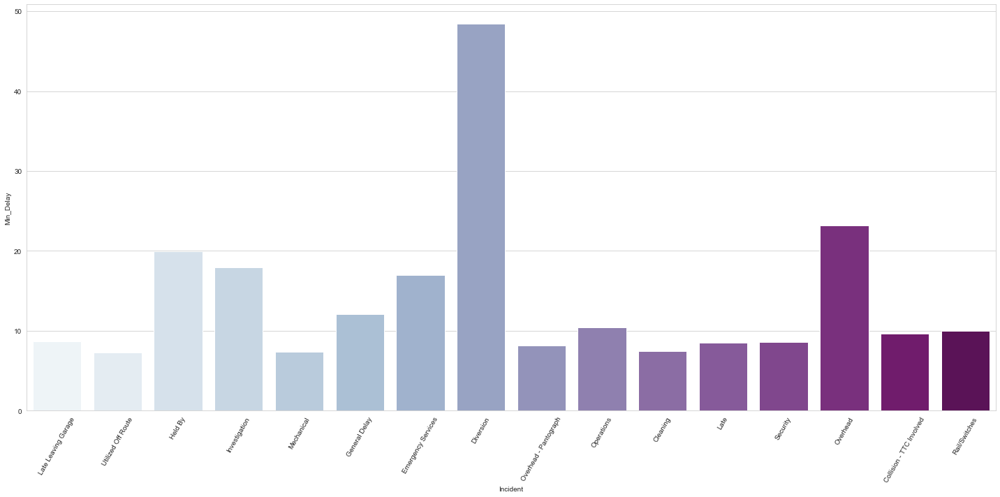

In [24]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='BuPu', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

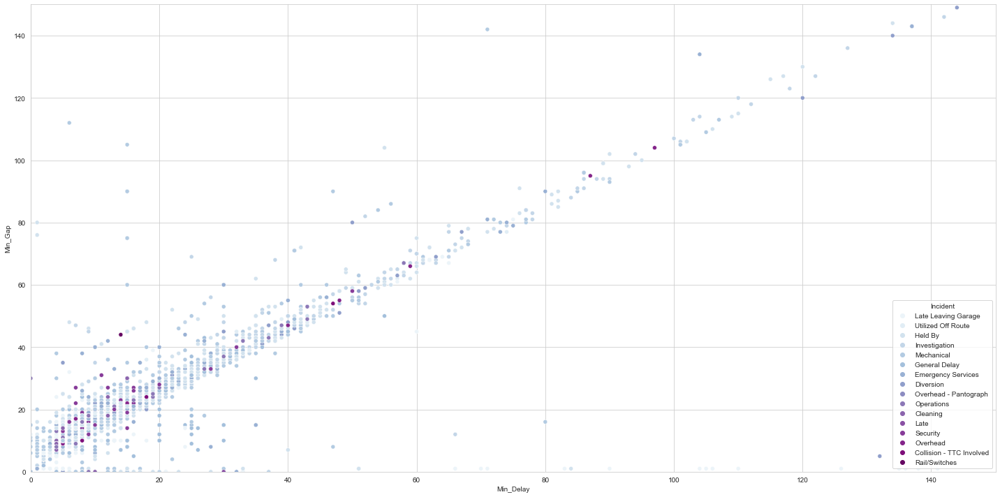

In [77]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='BuPu')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### CMRmap

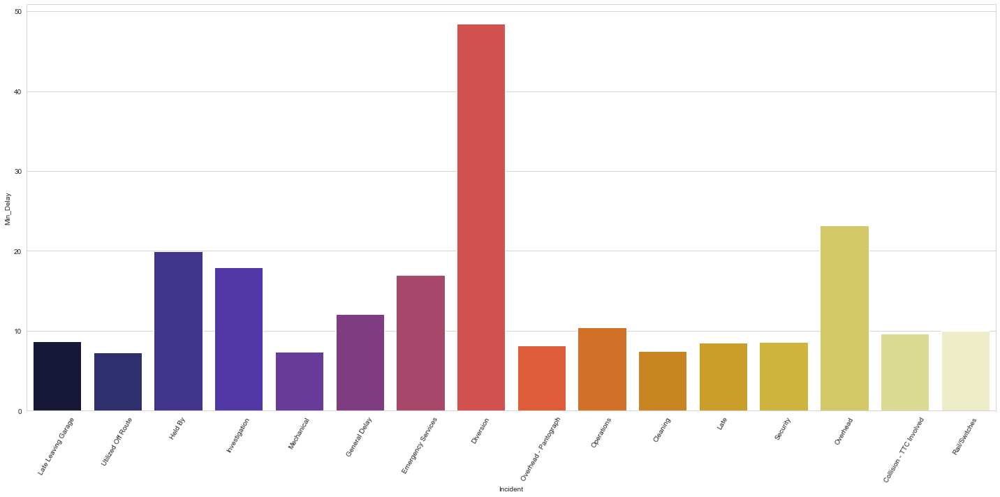

In [26]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='CMRmap', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

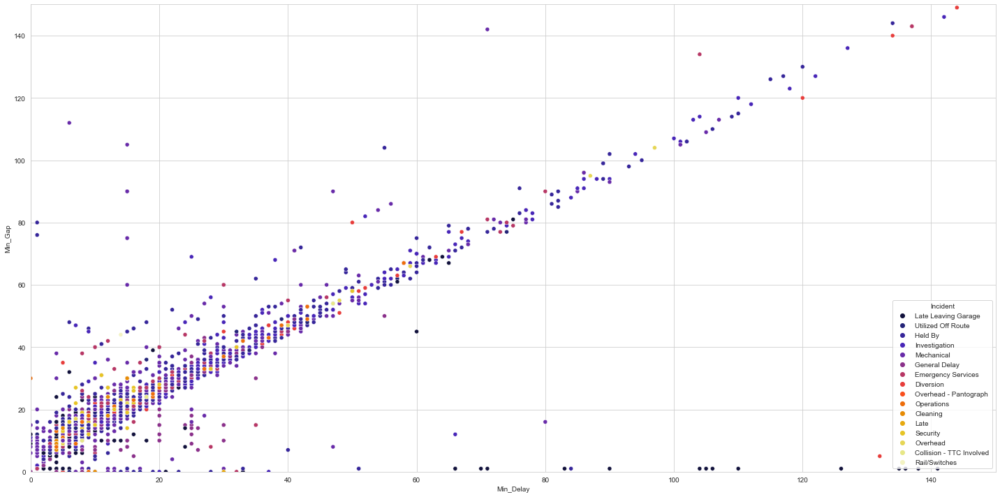

In [78]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='CMRmap')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### Dark2

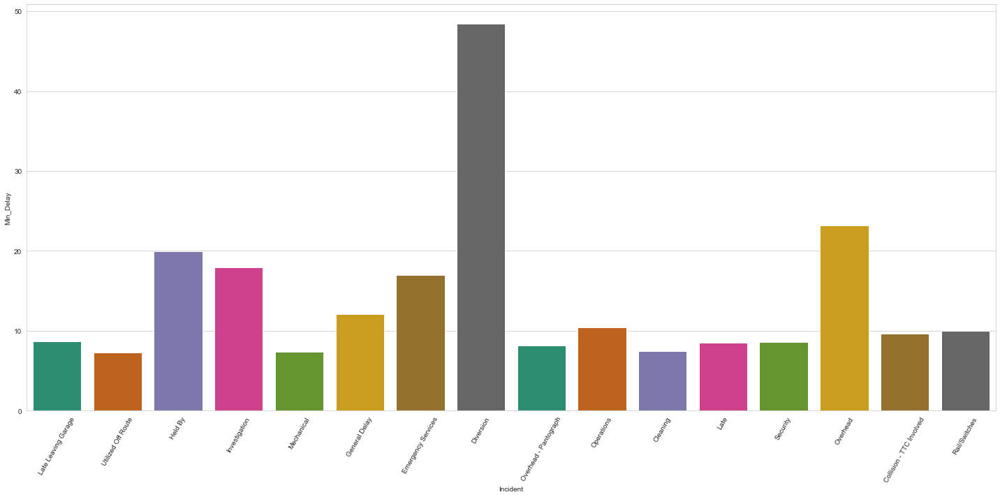

In [28]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='Dark2', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

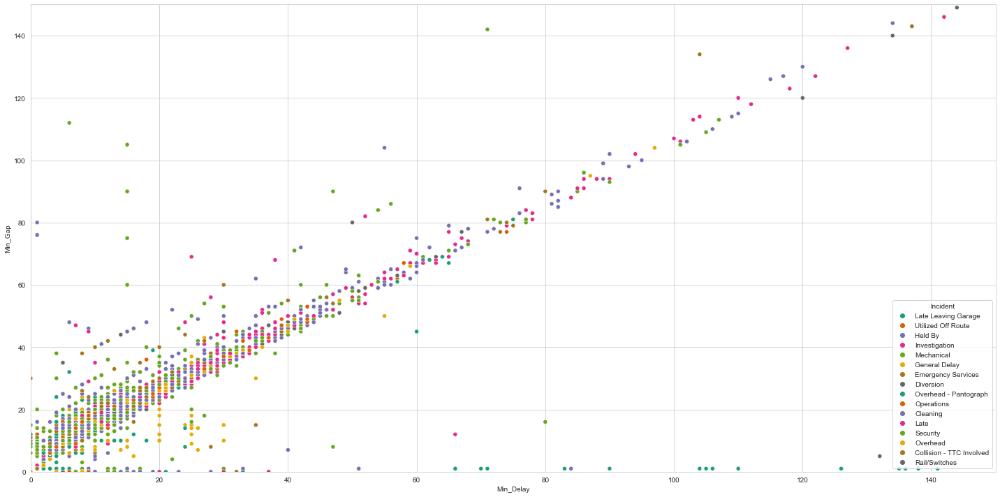

In [79]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='Dark2')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### GnBu

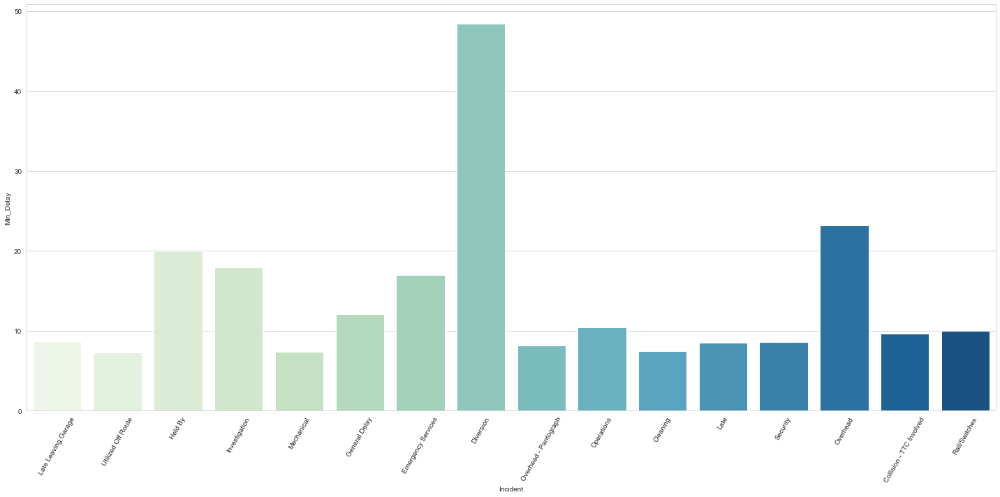

In [30]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='GnBu', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

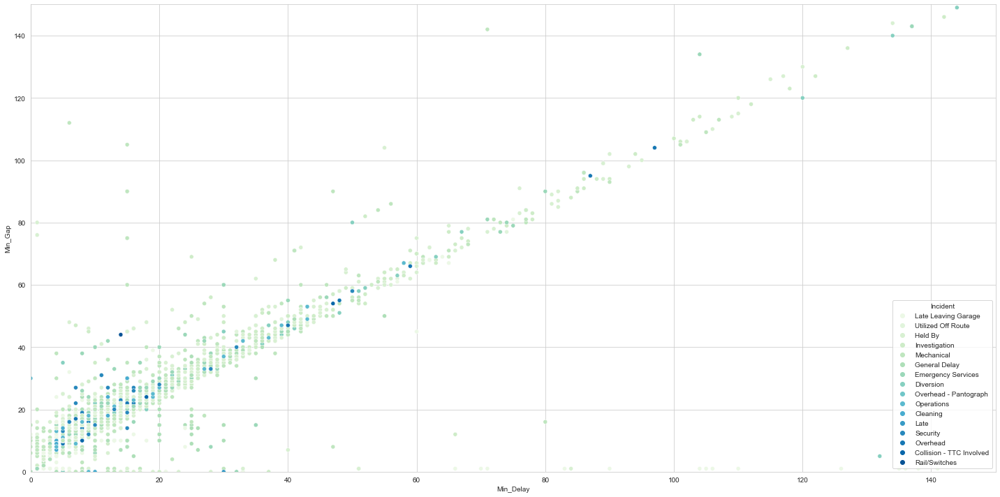

In [80]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='GnBu')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### Greens

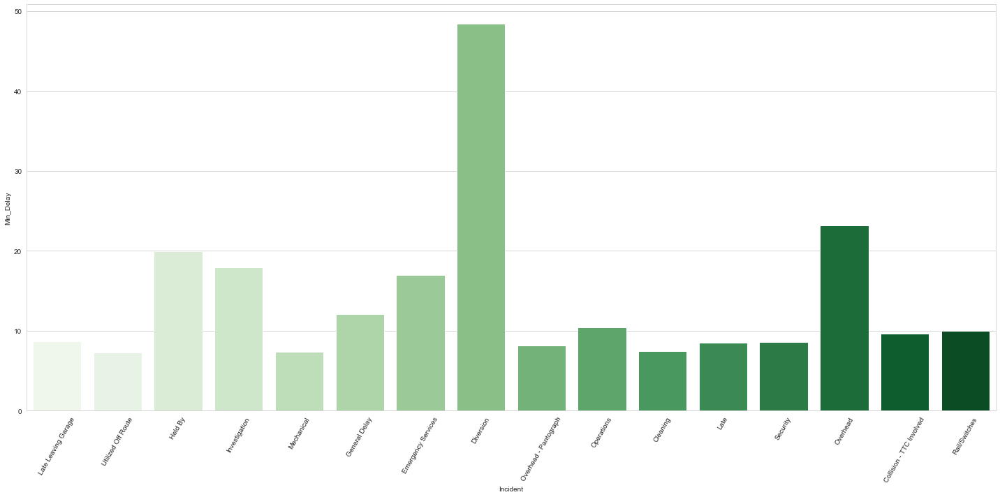

In [33]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='Greens', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

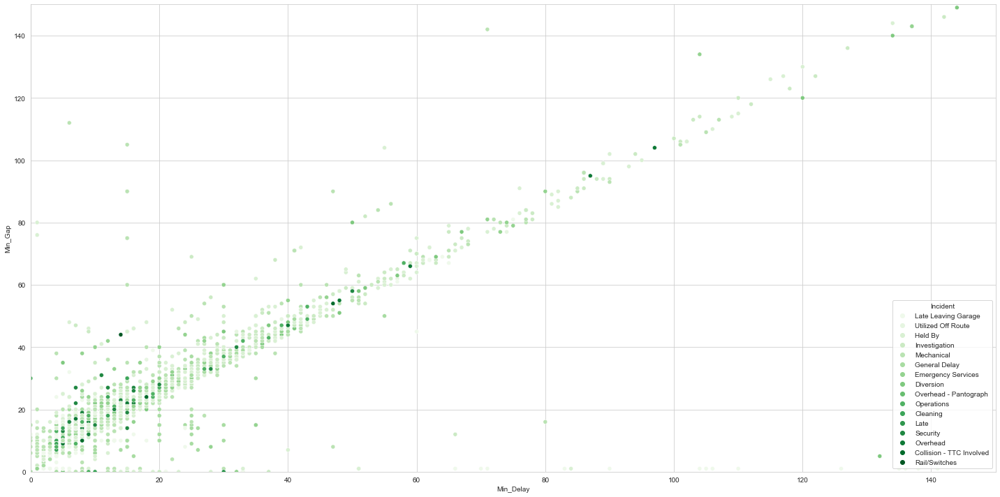

In [81]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='Greens')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### Greys

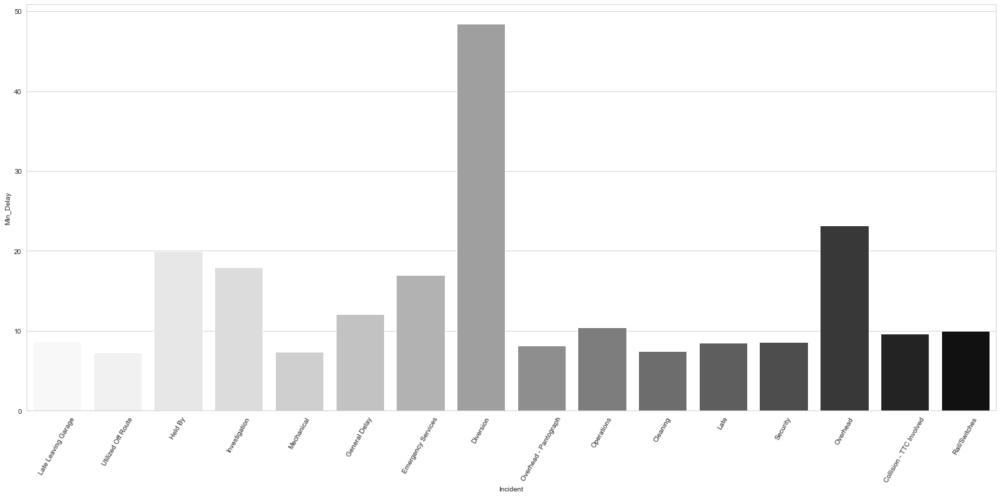

In [35]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='Greys', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

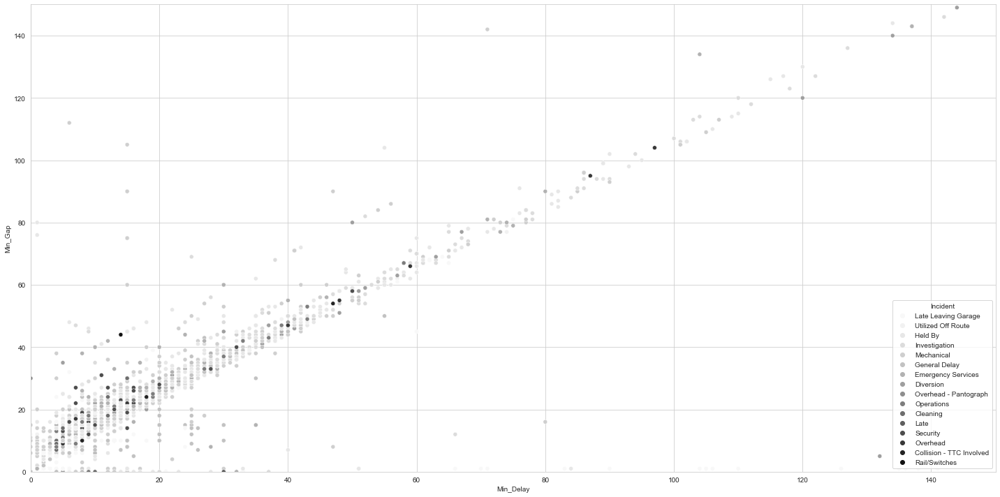

In [82]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='Greys')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### OrRd

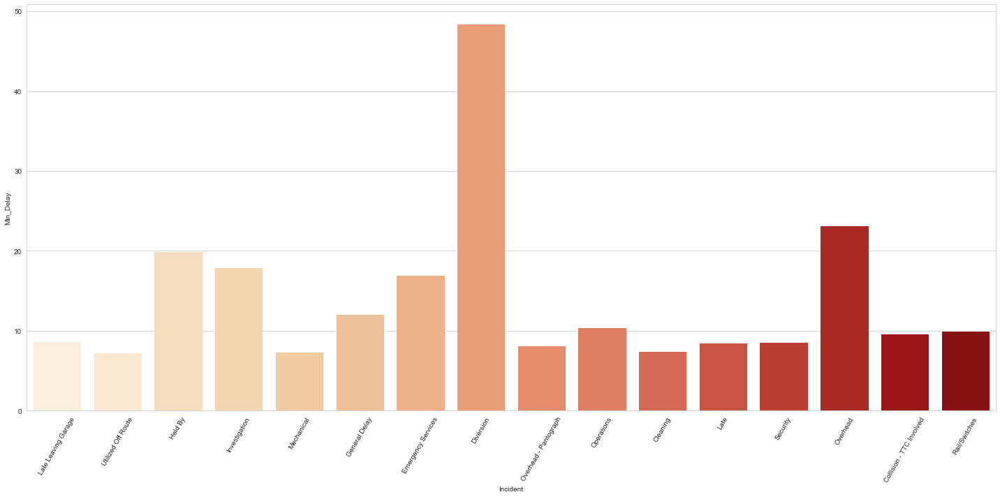

In [37]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='OrRd', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

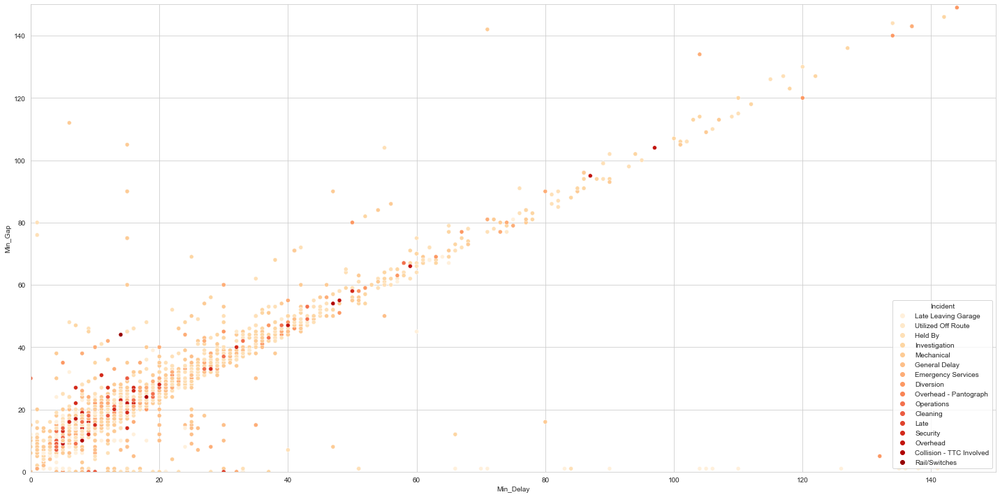

In [83]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='OrRd')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### Oranges

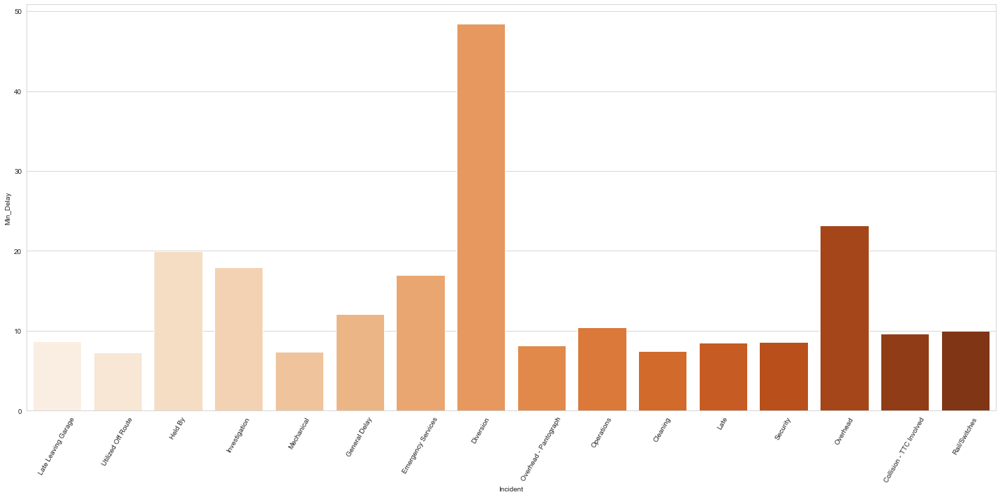

In [39]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='Oranges', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

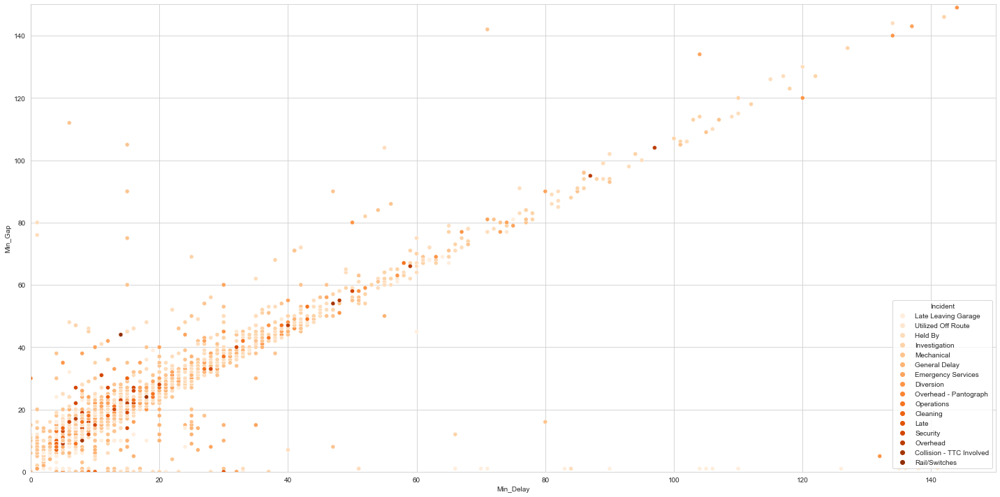

In [84]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='Oranges')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### PRGn

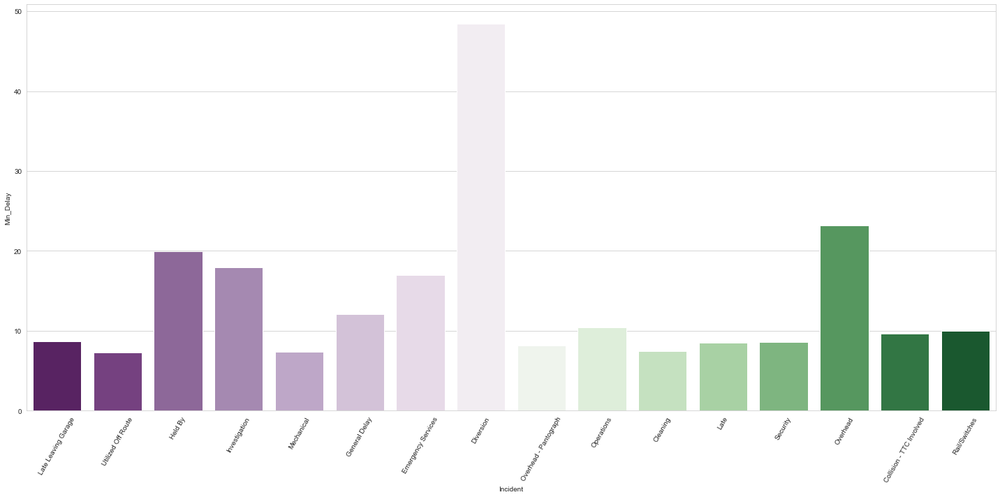

In [41]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='PRGn', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

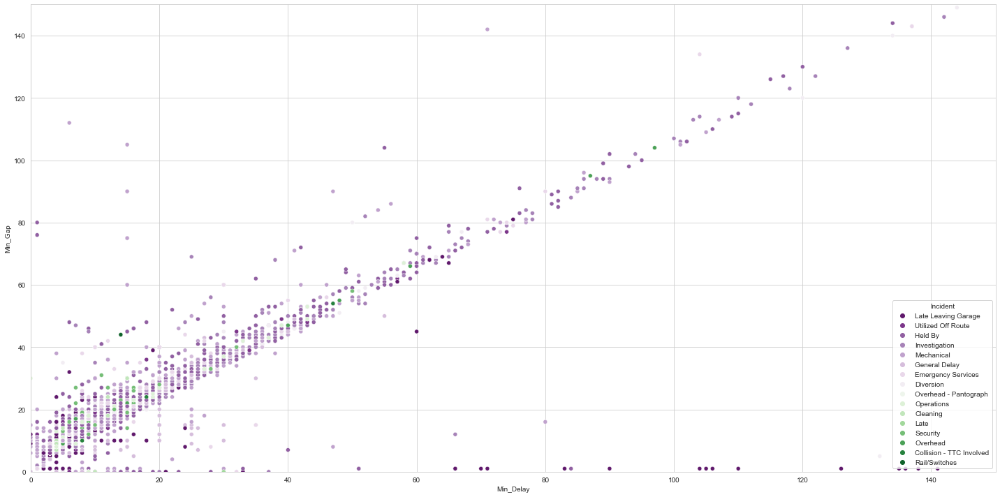

In [85]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='PRGn')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### Paired

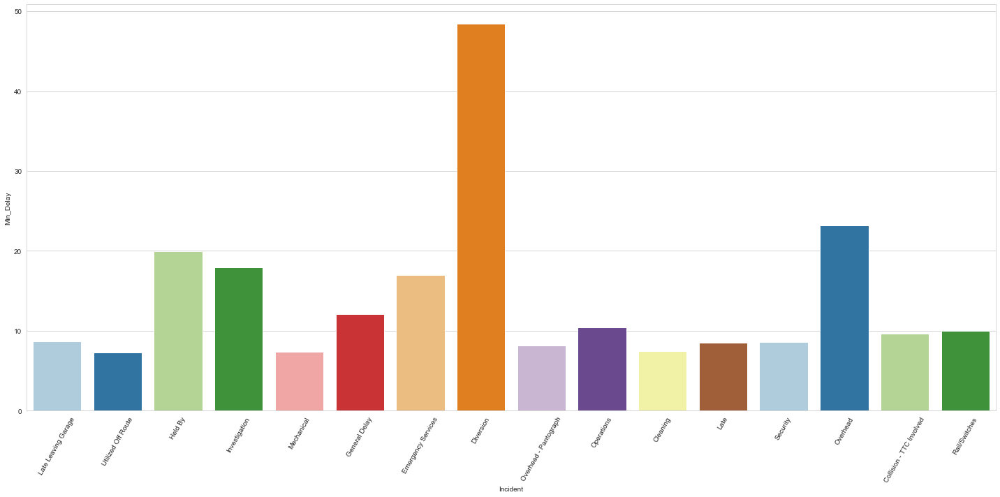

In [43]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='Paired', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

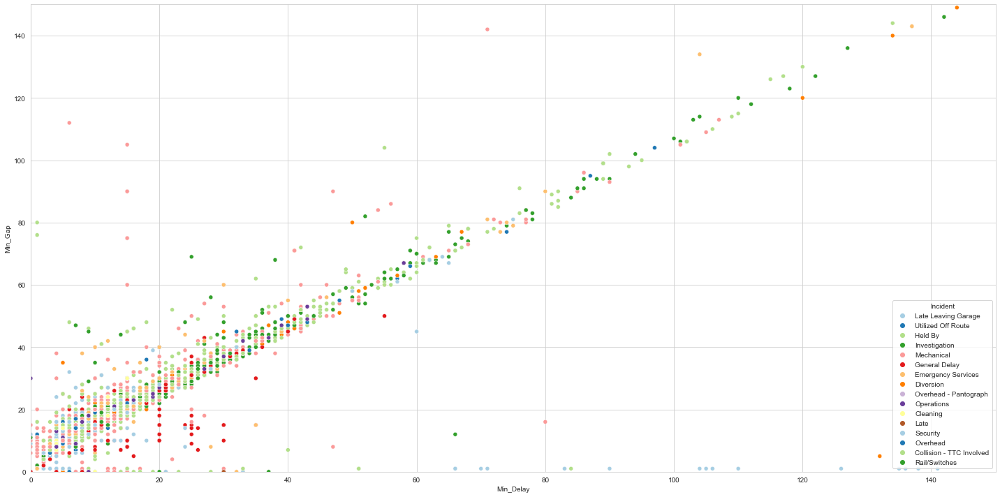

In [86]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='Paired')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### Pastel1

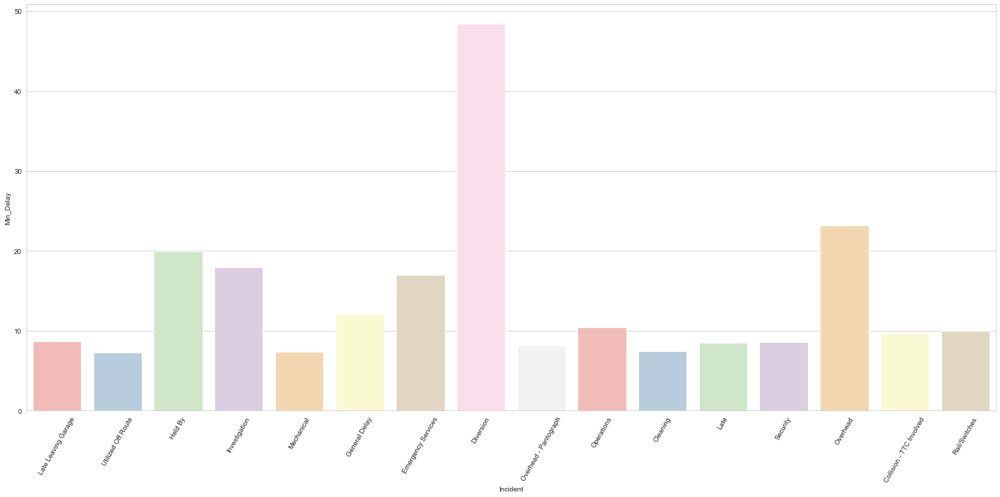

In [89]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='Pastel1', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

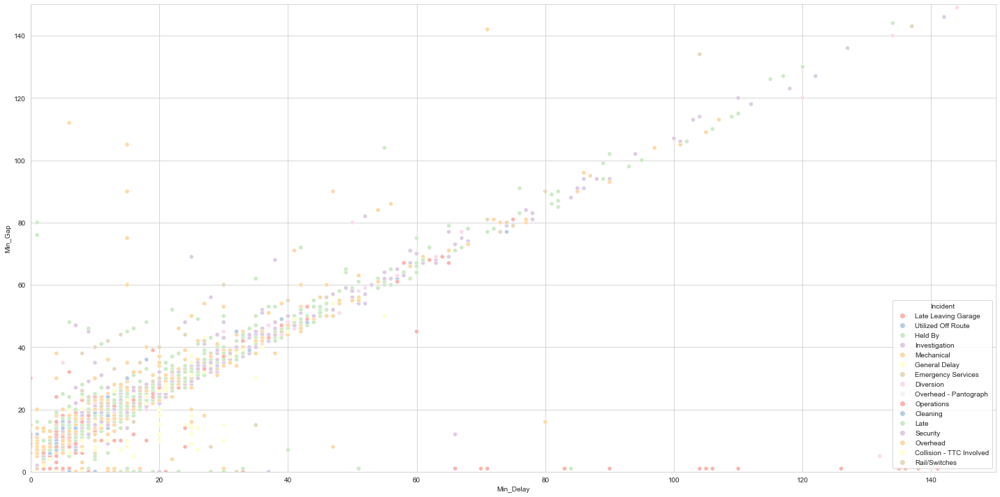

In [90]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='Pastel1')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### Pastel2

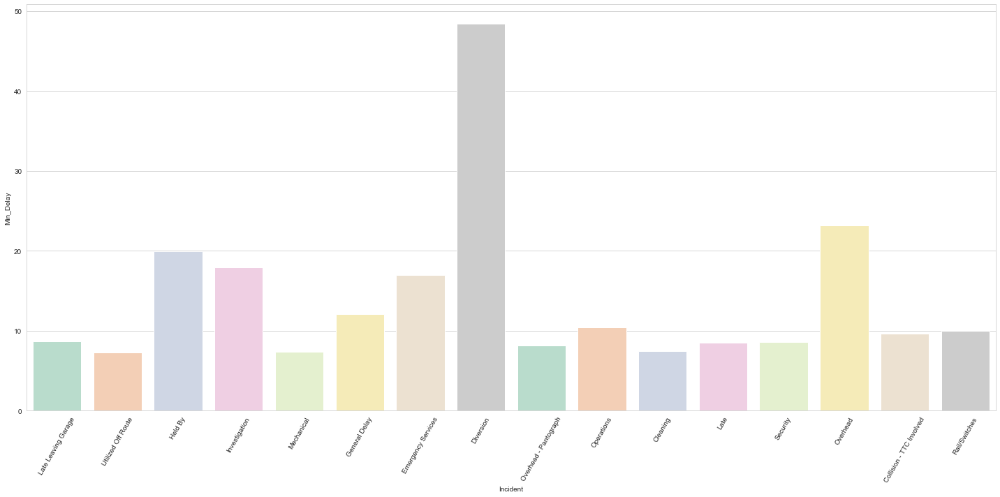

In [92]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='Pastel2', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

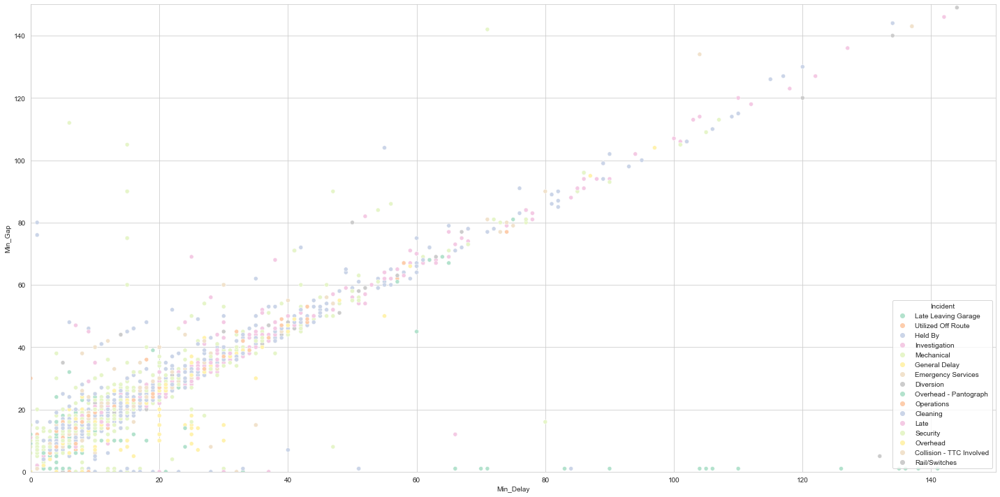

In [93]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='Pastel2')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### PiYG

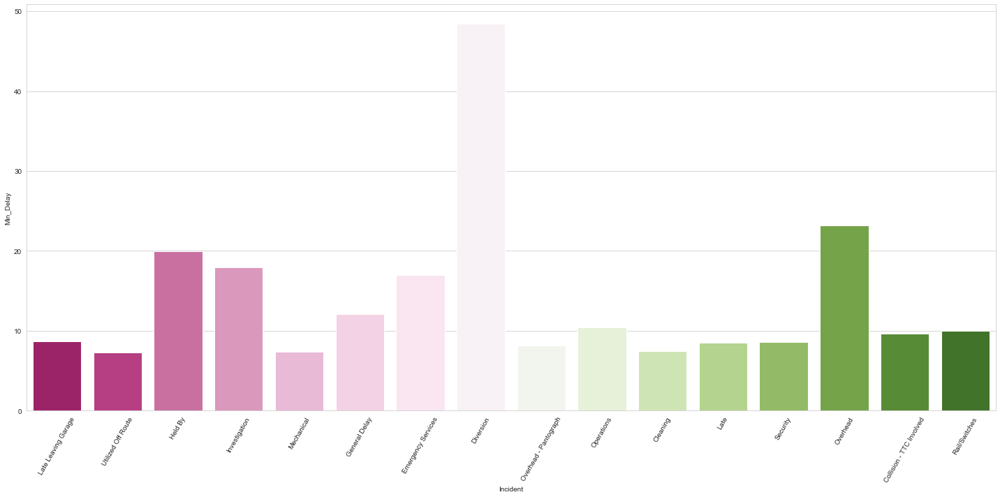

In [94]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='PiYG', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

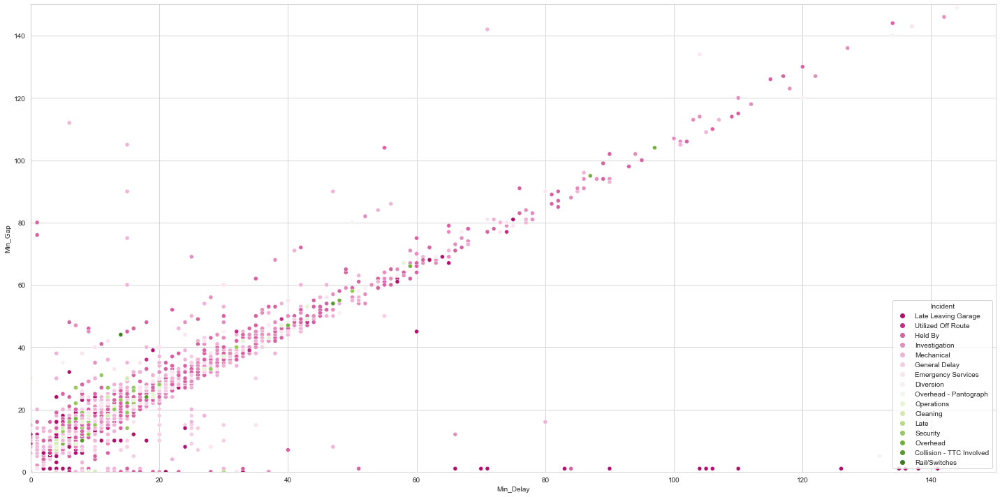

In [95]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='PiYG')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### PuBu

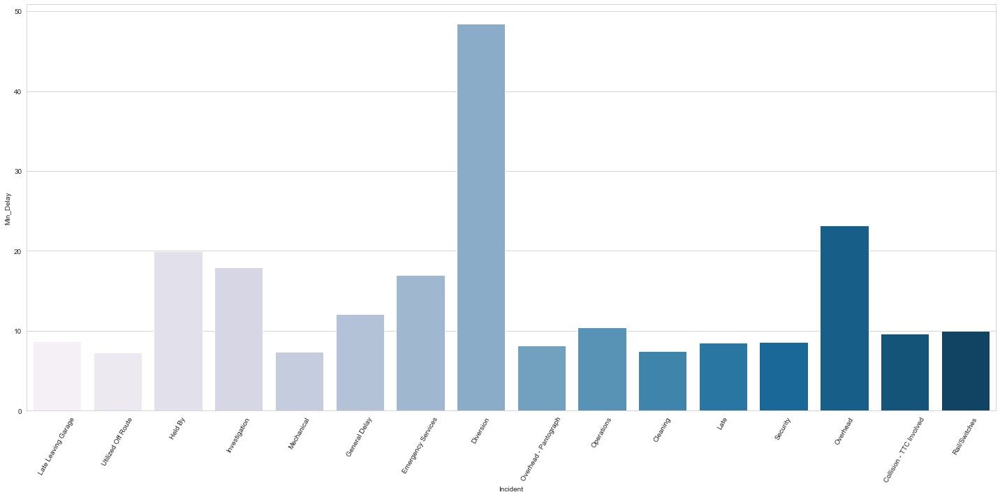

In [96]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='PuBu', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

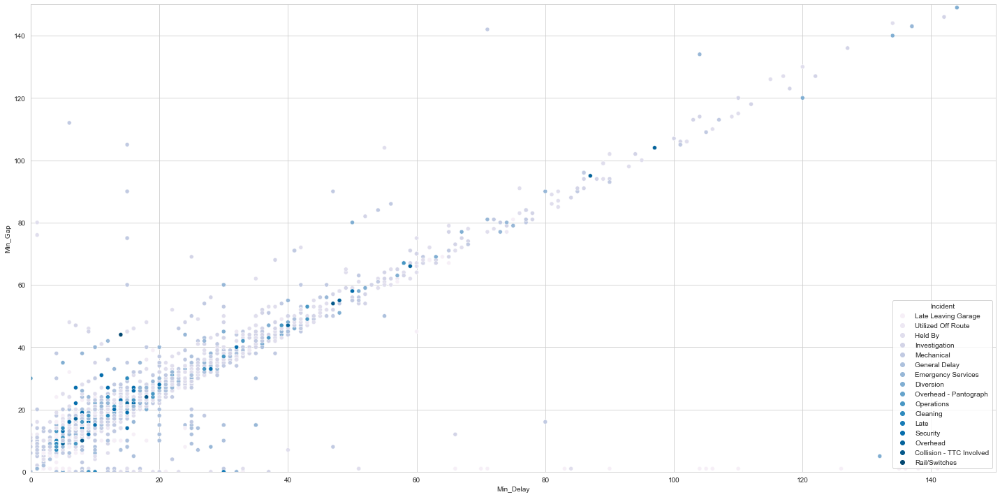

In [97]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='PuBu')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### PuBuGn

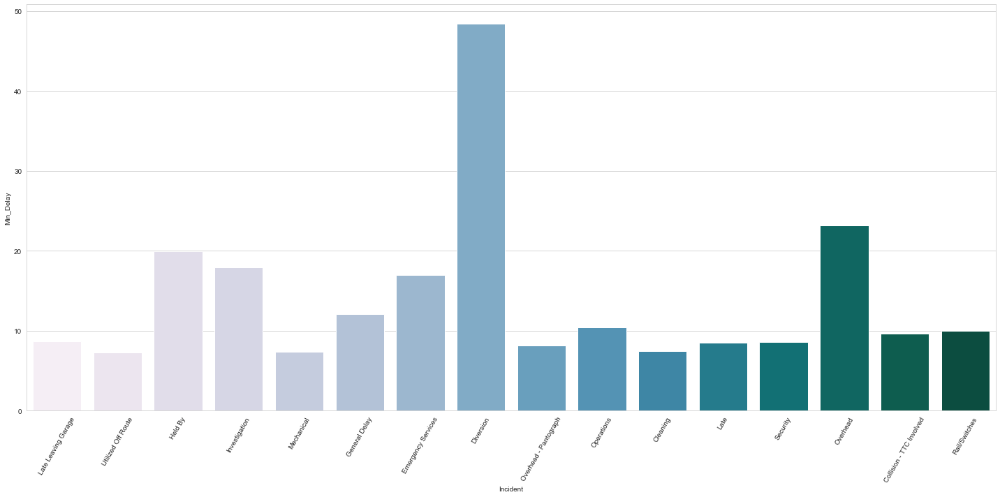

In [98]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='PuBuGn', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

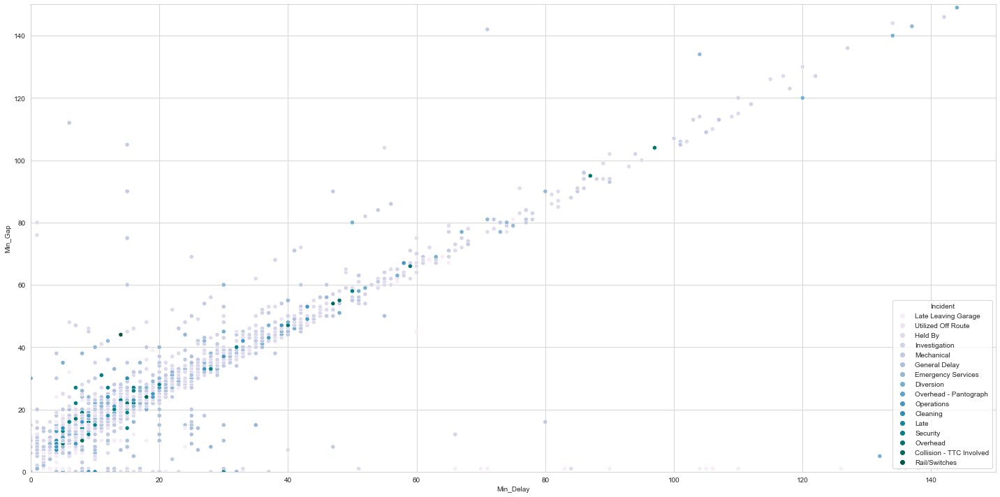

In [99]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='PuBuGn')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### PuOr

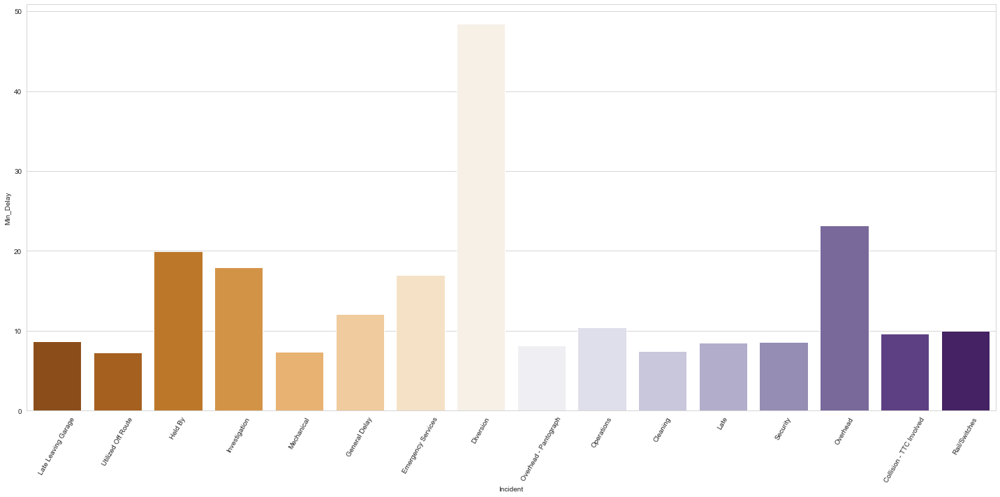

In [100]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='PuOr', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

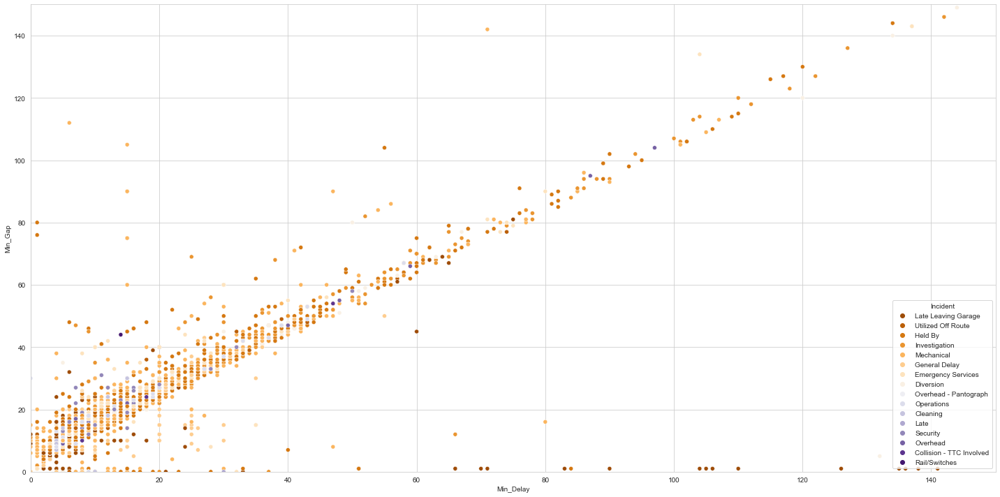

In [101]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='PuOr')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### PuRd

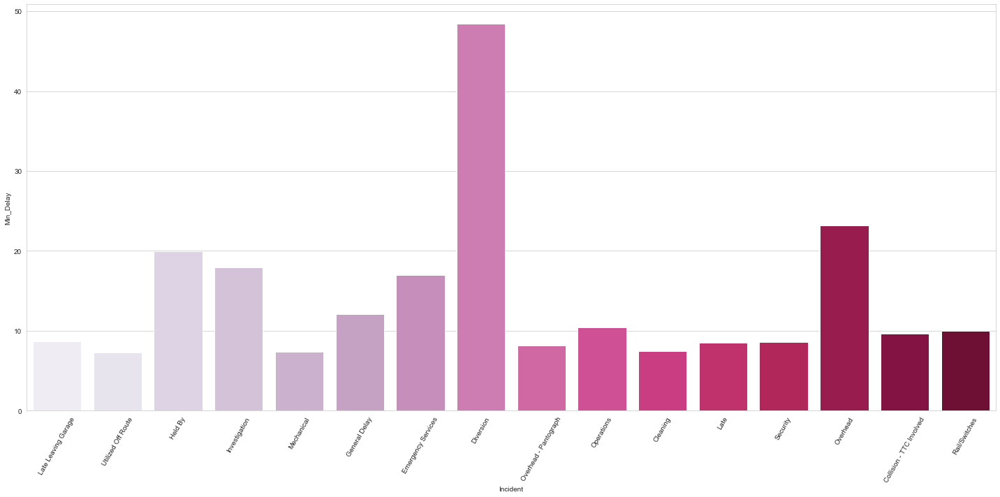

In [103]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='PuRd', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

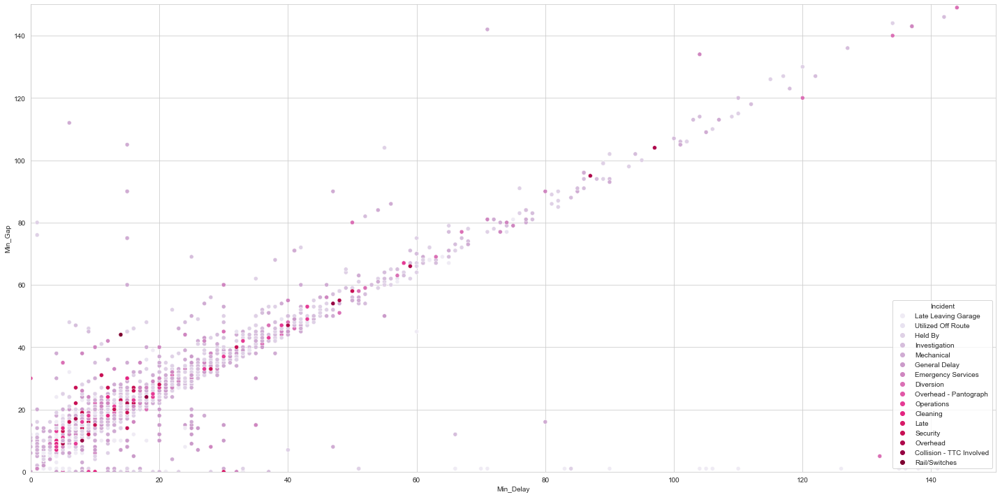

In [102]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='PuRd')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### Purples

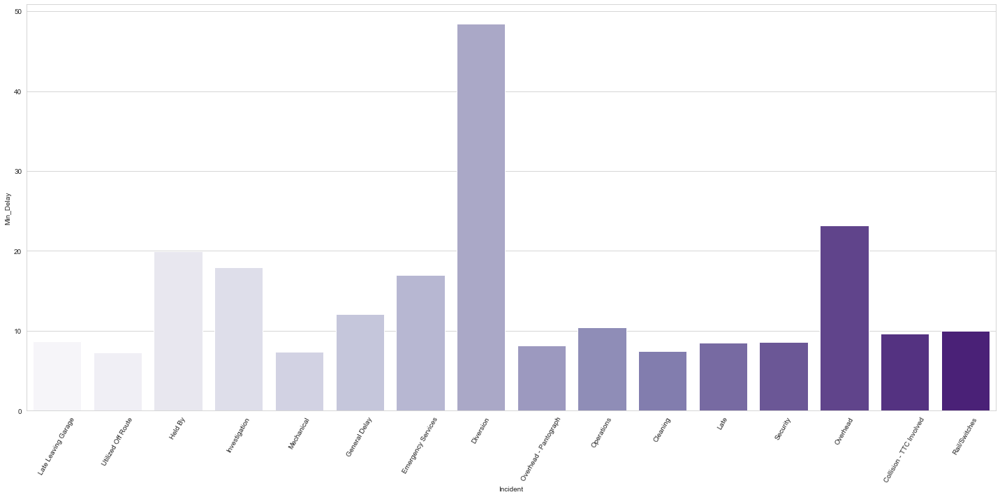

In [104]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='Purples', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

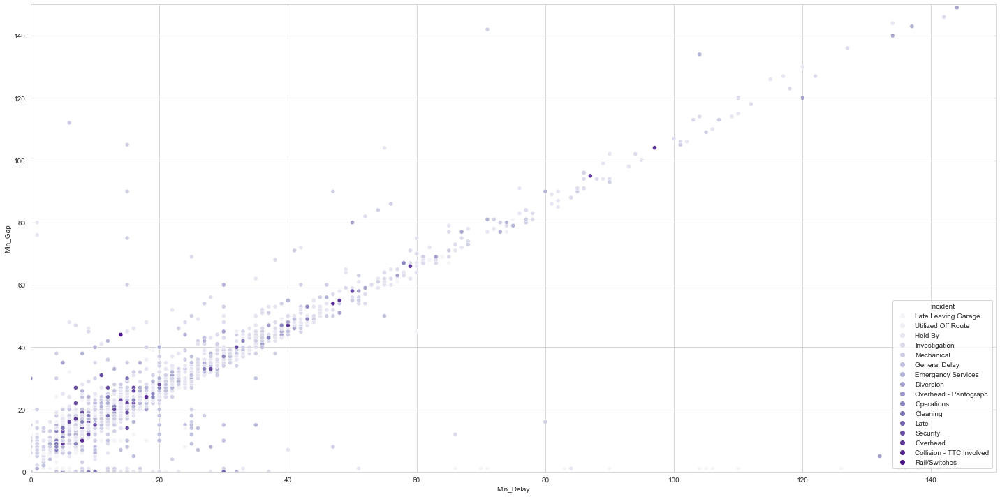

In [105]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='Purples')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### RdBu

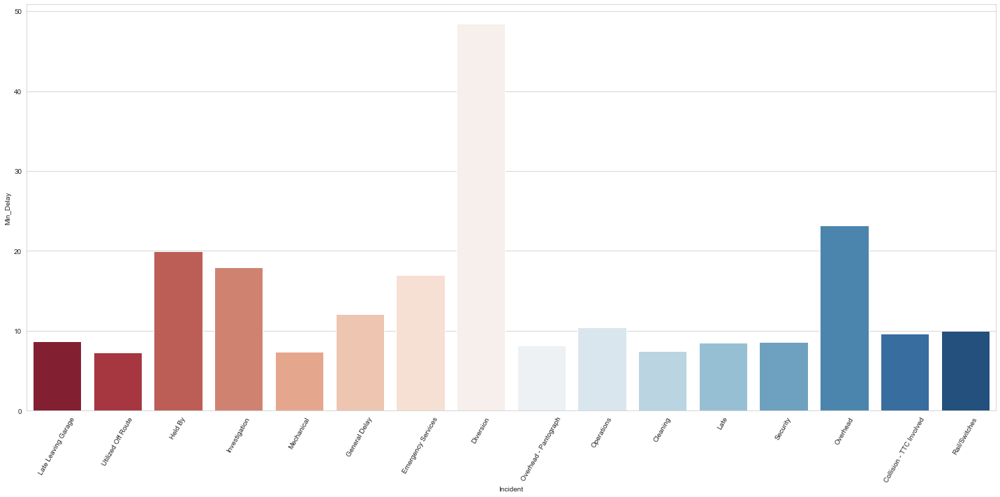

In [108]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='RdBu', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

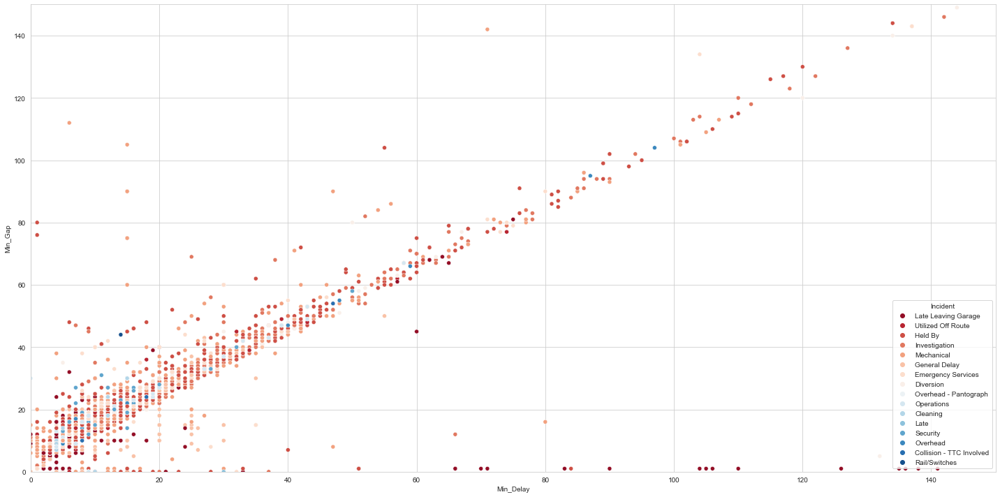

In [107]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='RdBu')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### RdGy

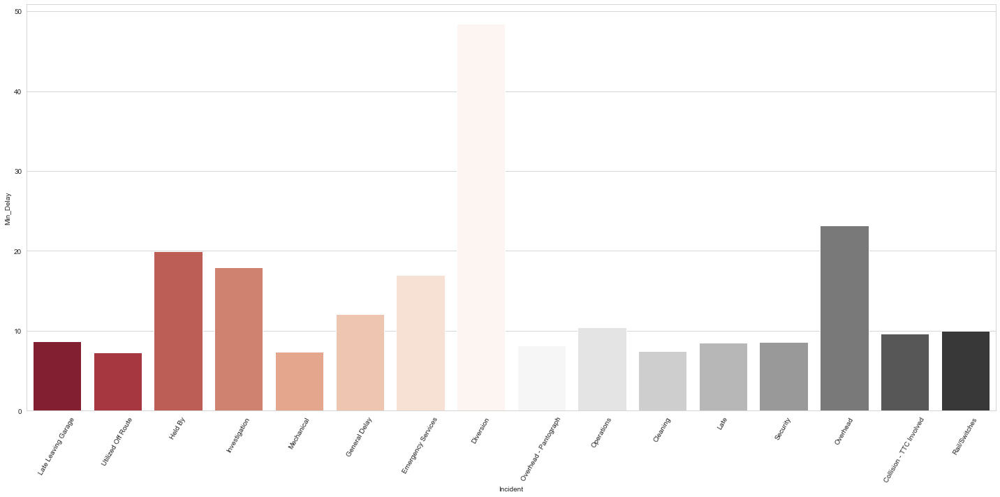

In [109]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='RdGy', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

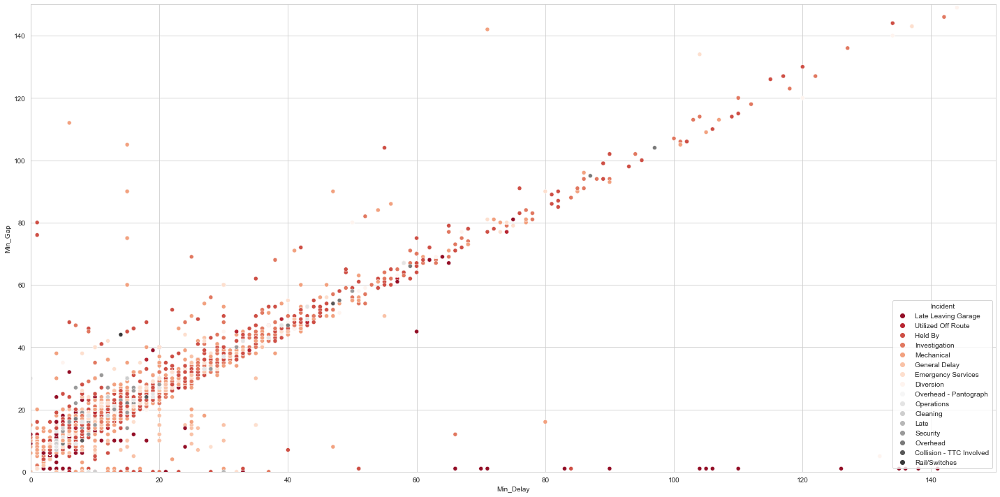

In [110]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='RdGy')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### RdPu

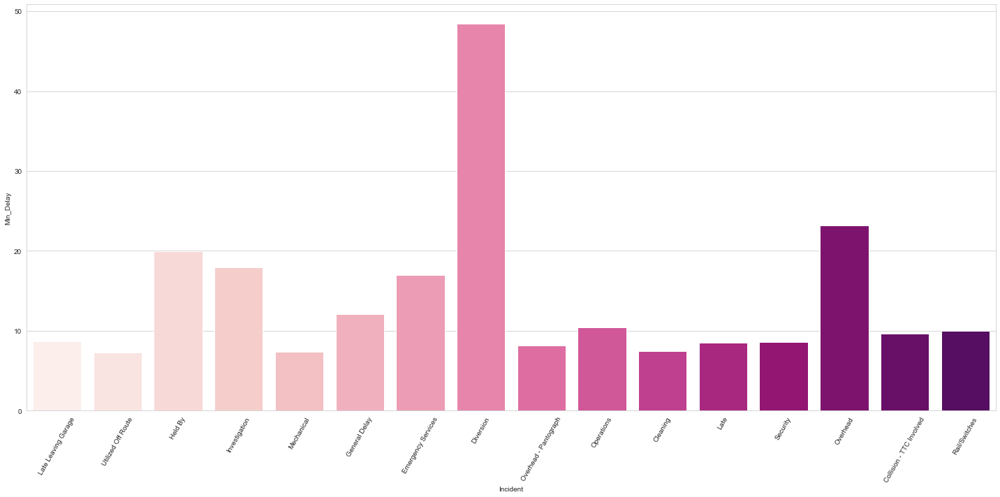

In [112]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='RdPu', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

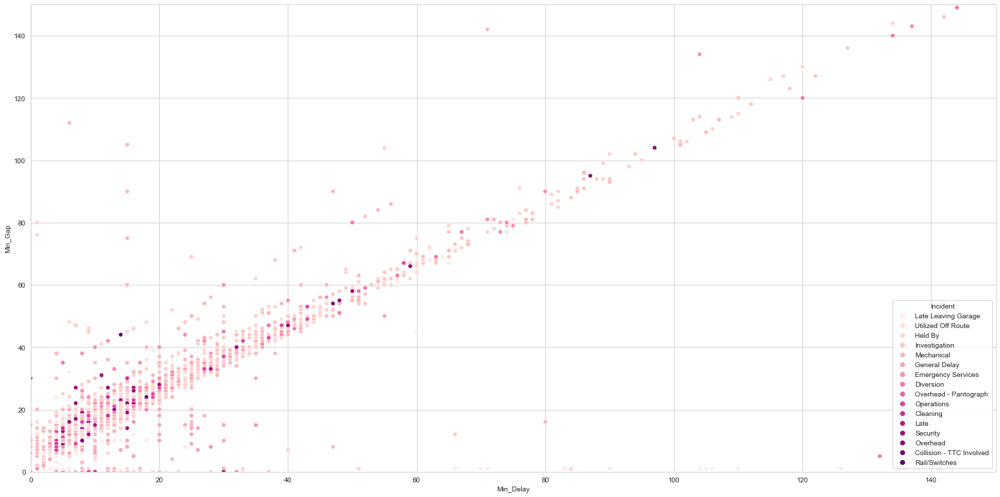

In [111]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='RdPu')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### RdYlBu

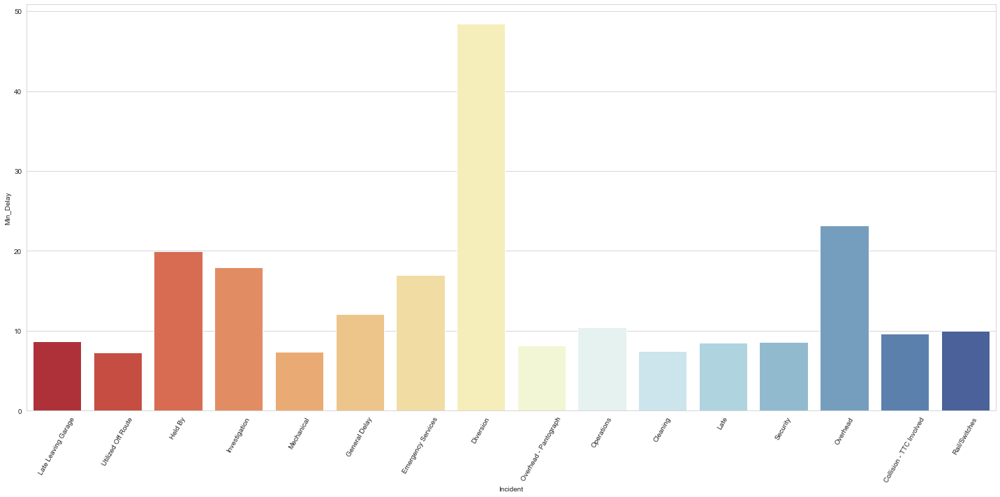

In [113]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='RdYlBu', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

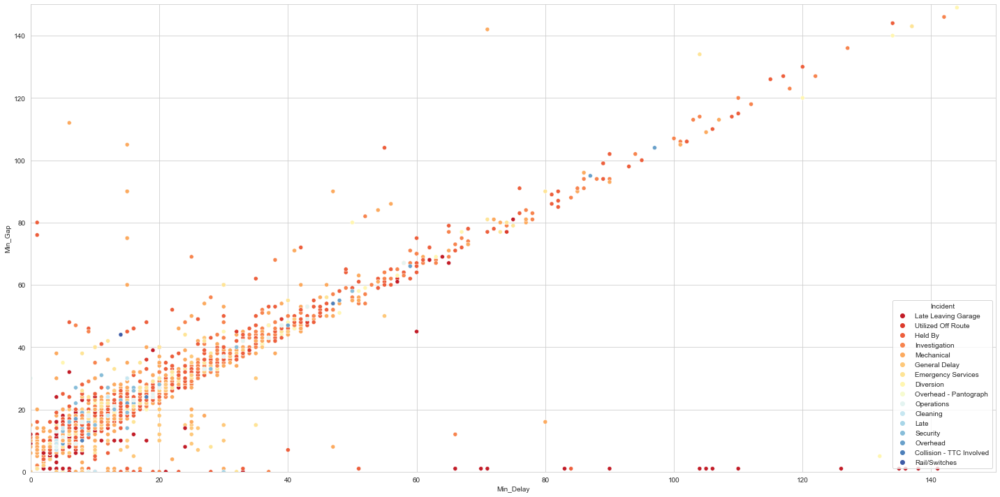

In [114]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='RdYlBu')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### RdYlGn

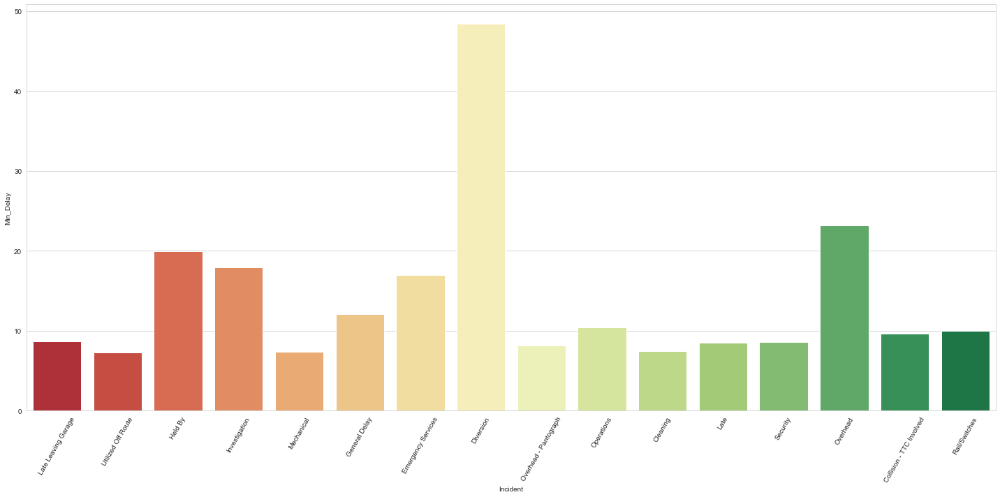

In [116]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='RdYlGn', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

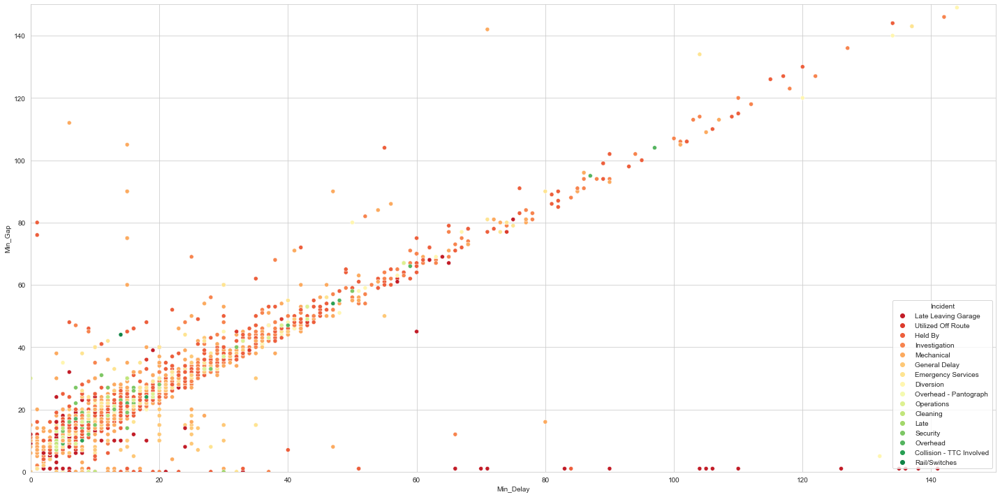

In [117]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='RdYlGn')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### Reds

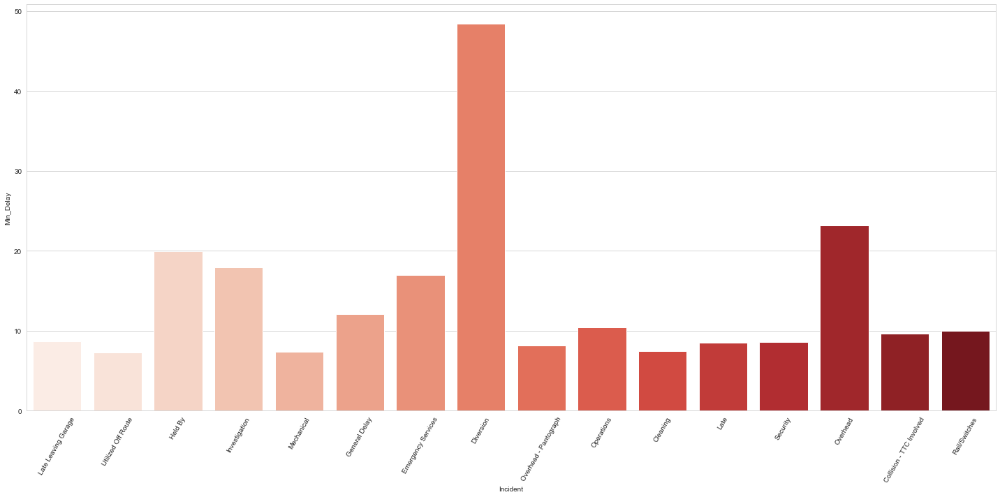

In [118]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='Reds', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

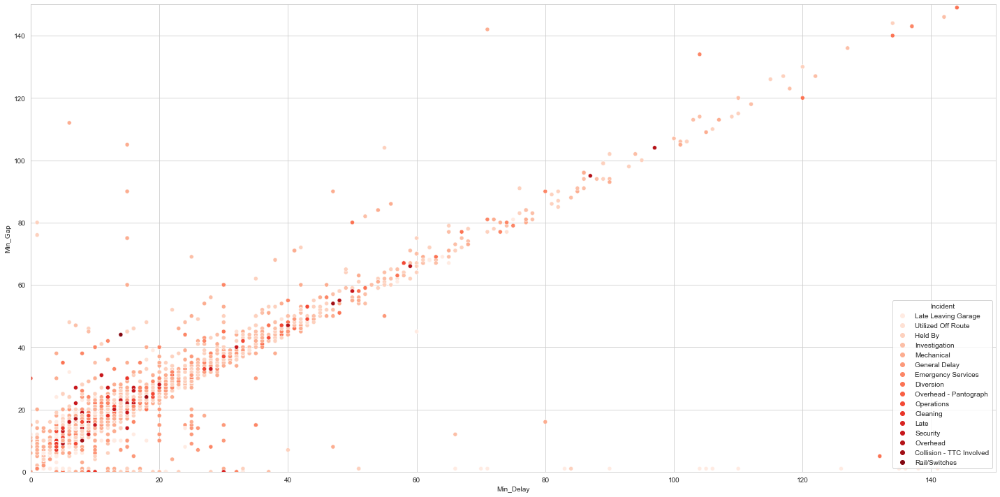

In [119]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='Reds')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### Set1

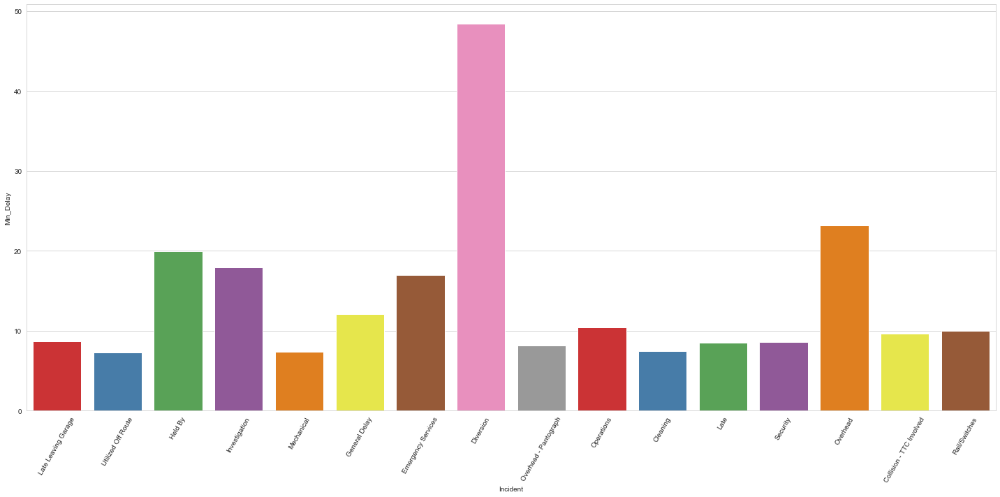

In [120]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='Set1', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

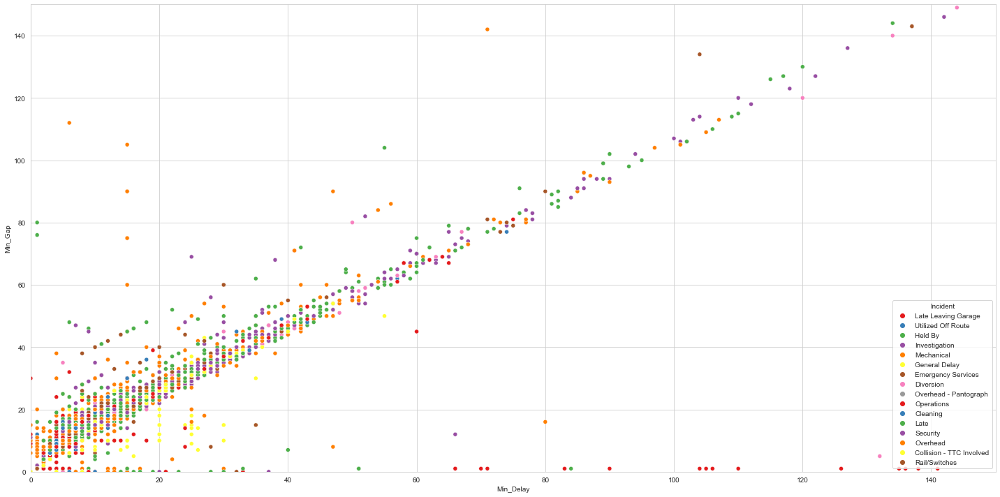

In [121]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='Set1')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### Set2

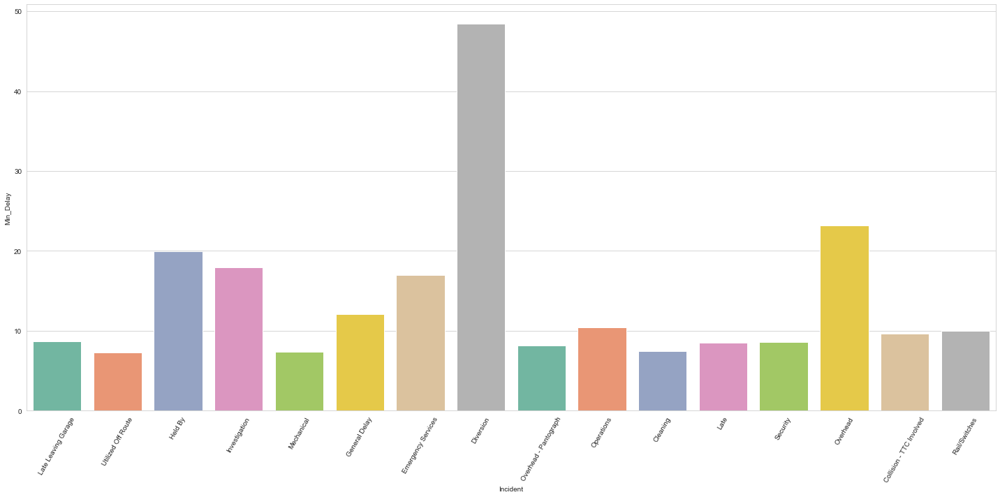

In [122]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='Set2', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

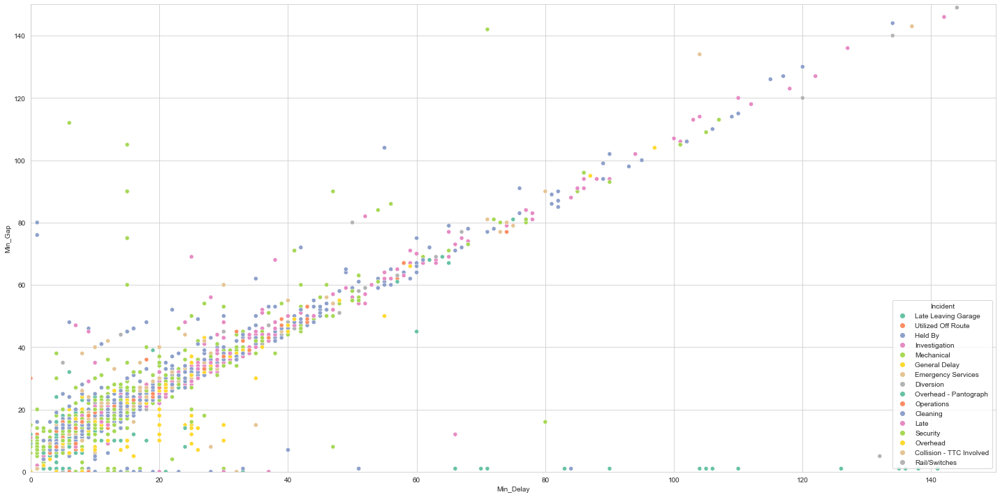

In [123]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='Set2')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### Set3

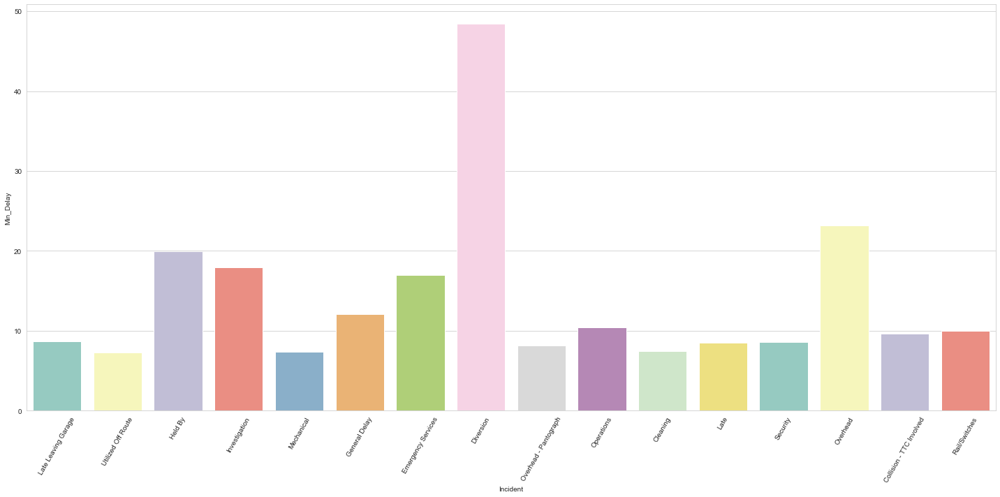

In [125]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='Set3', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

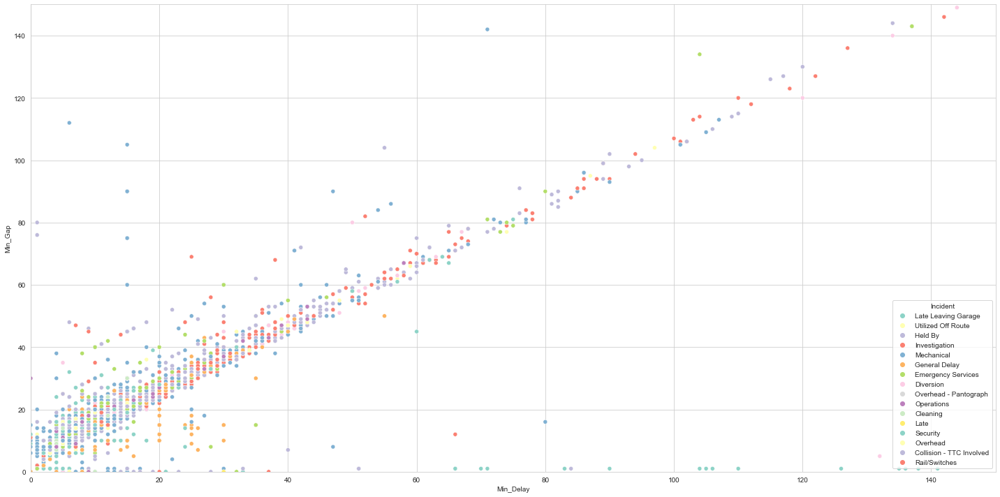

In [124]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='Set3')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### Spectral

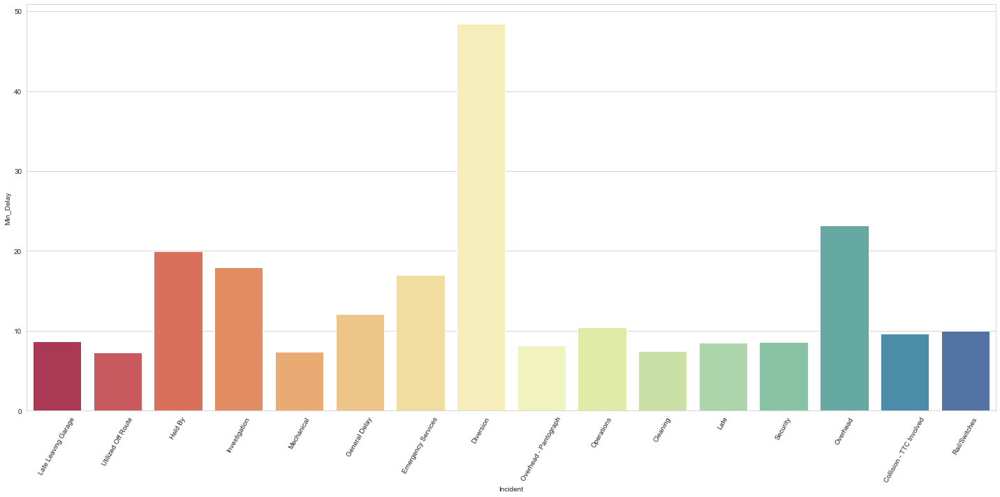

In [126]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='Spectral', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

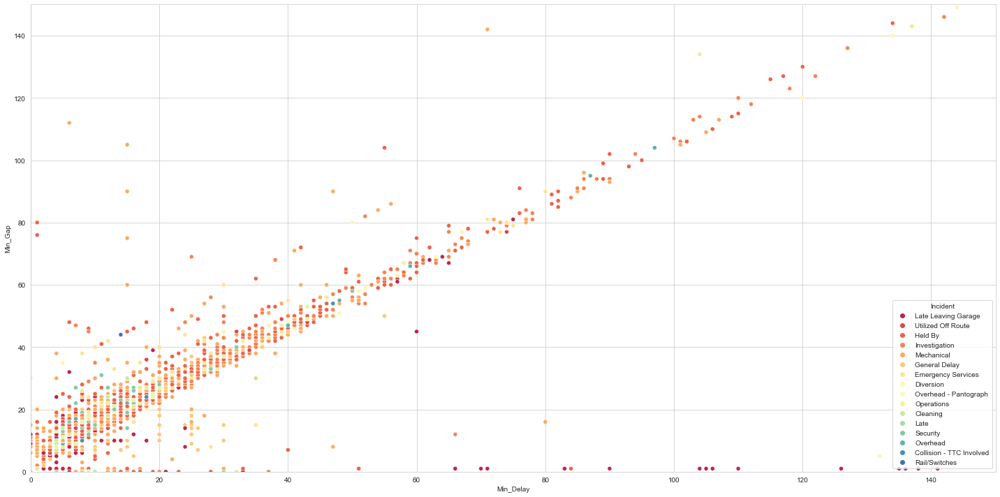

In [127]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='Spectral')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### Wistia

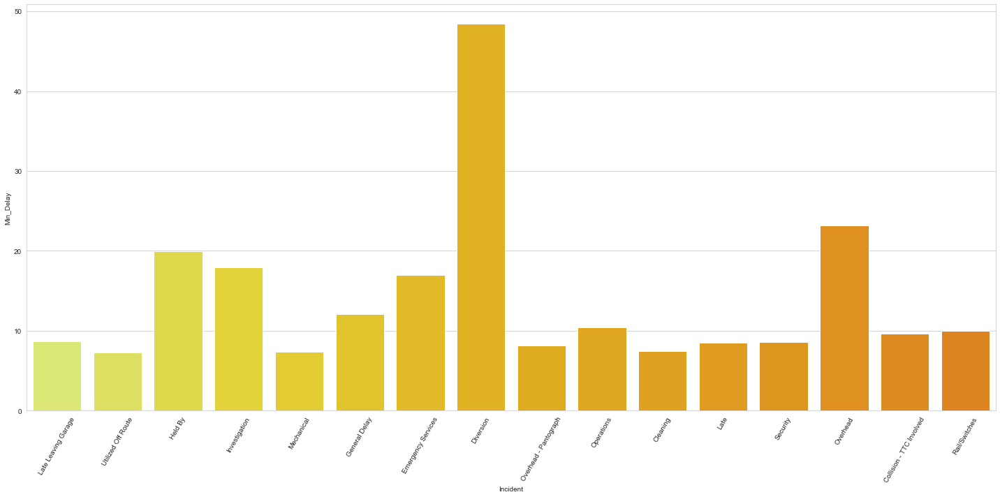

In [128]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='Wistia', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

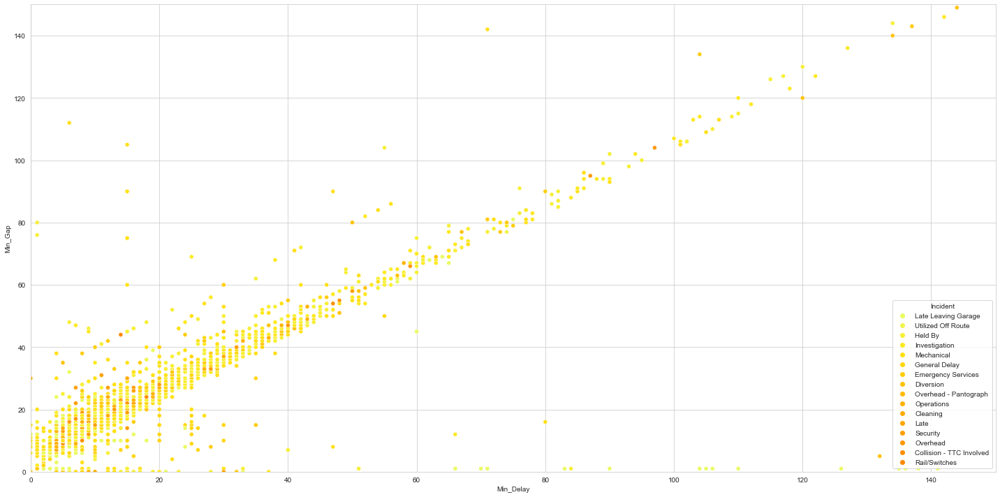

In [129]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='Wistia')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### YlGn

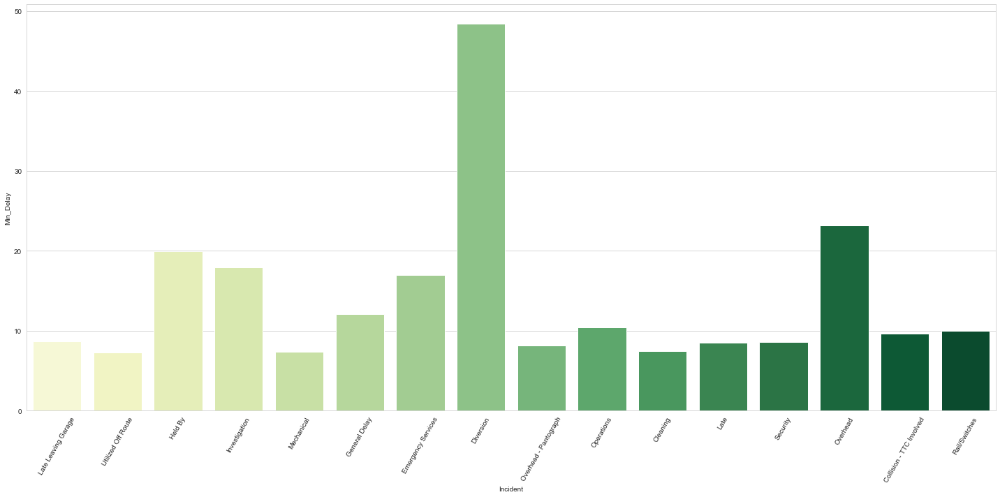

In [131]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='YlGn', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

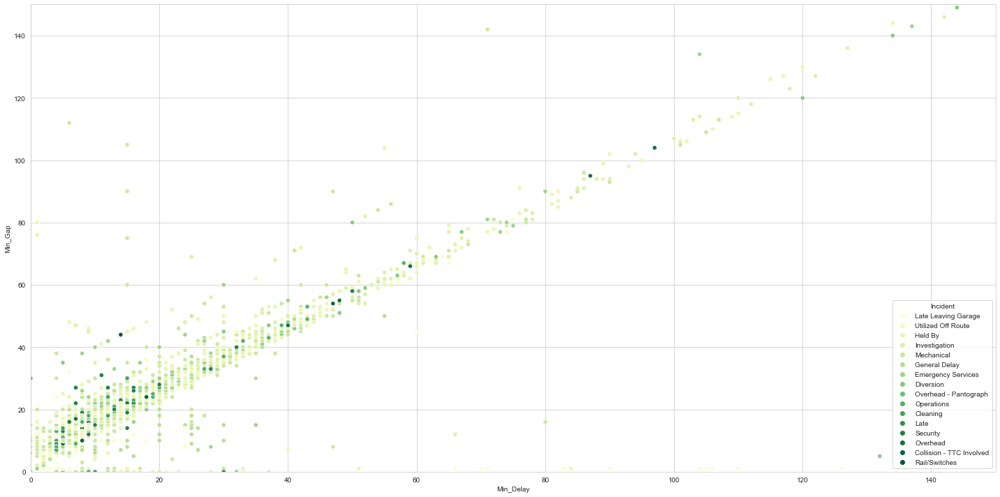

In [133]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='YlGn')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### YlGnBu

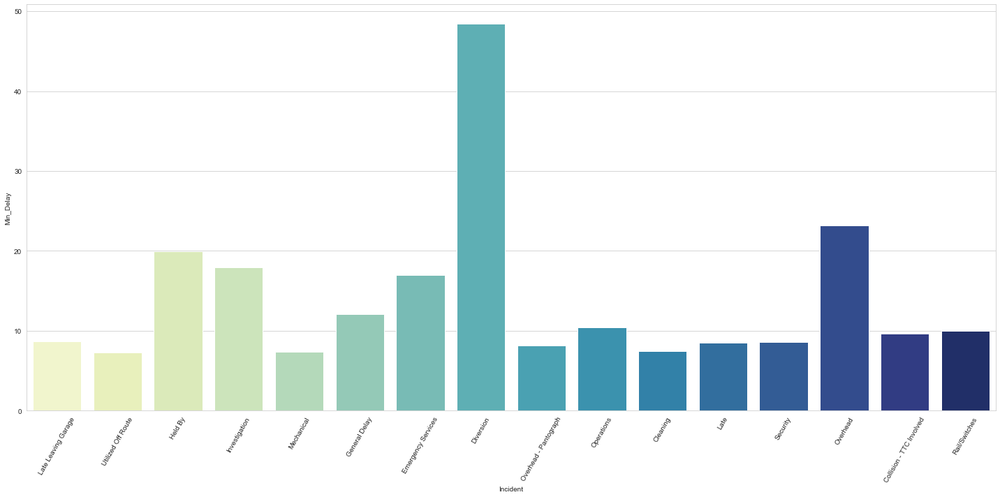

In [135]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='YlGnBu', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

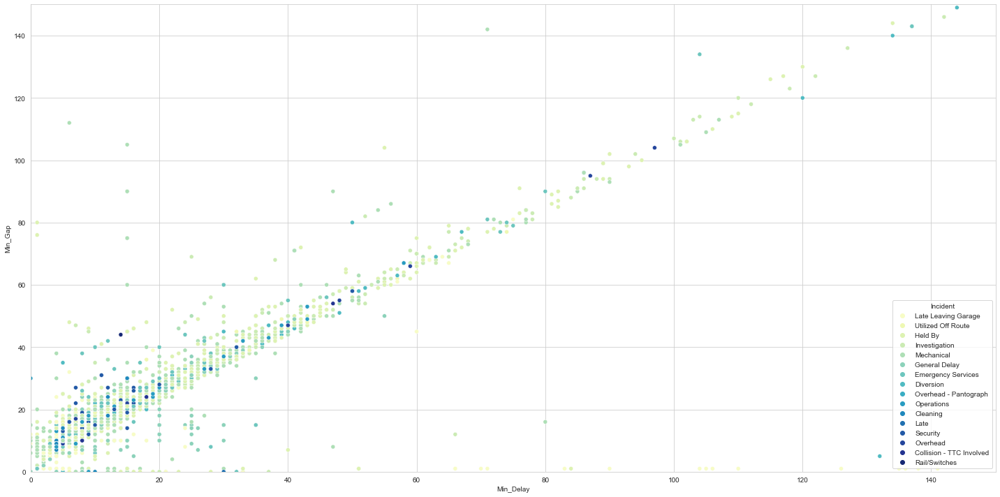

In [136]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='YlGnBu')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### YlOrBr

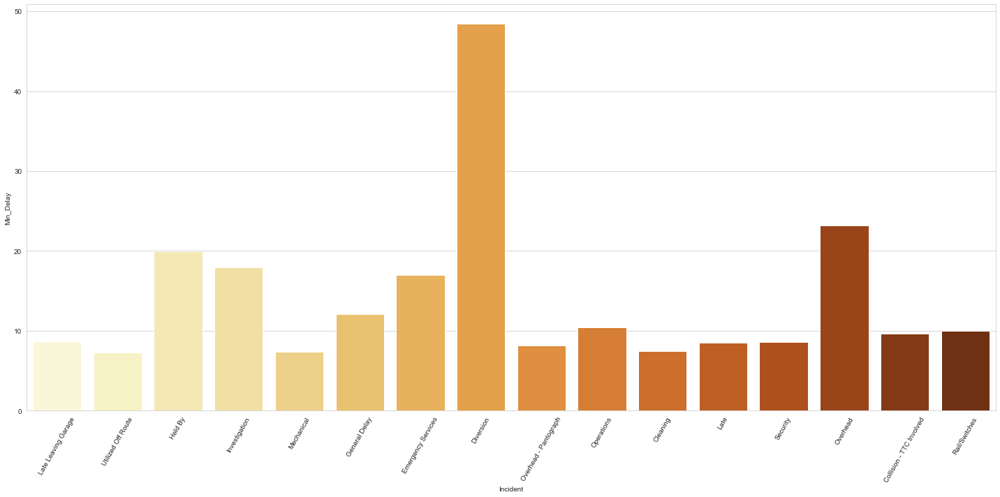

In [137]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='YlOrBr', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

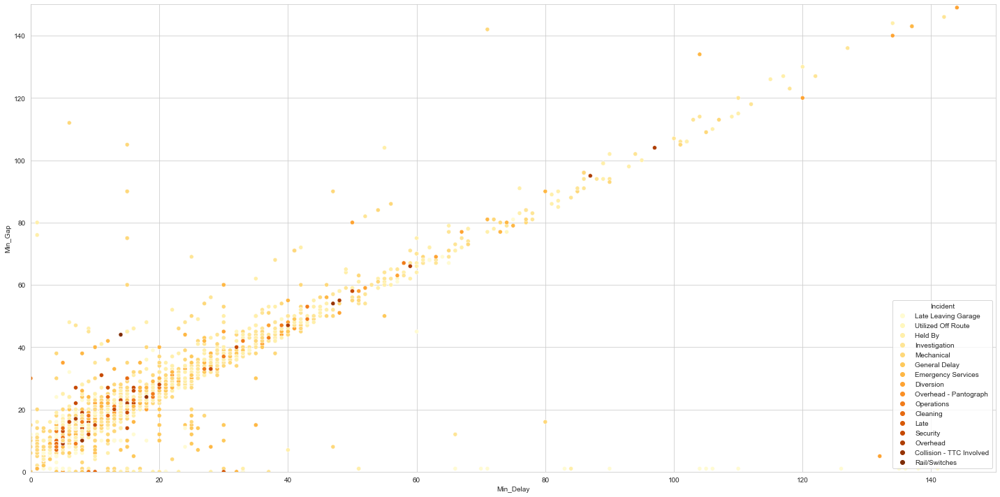

In [138]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='YlOrBr')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### YlOrRd

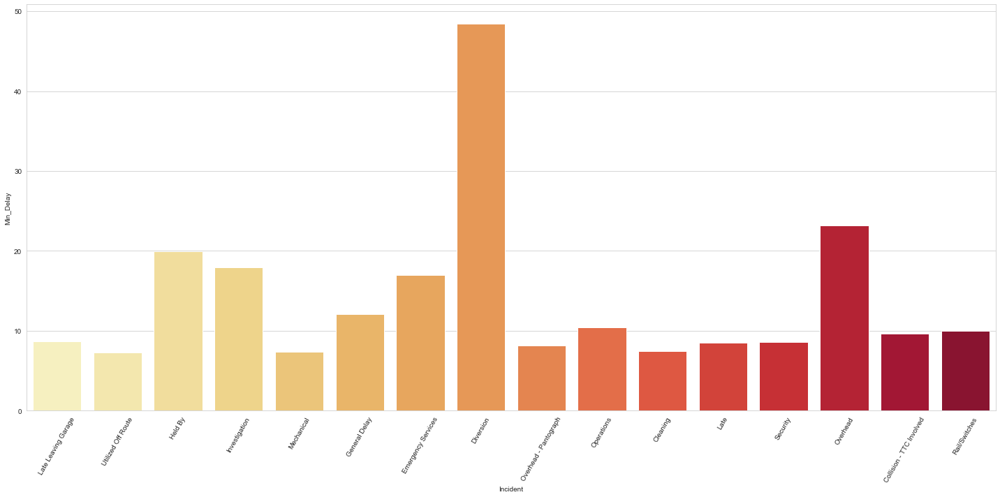

In [139]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='YlOrRd', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

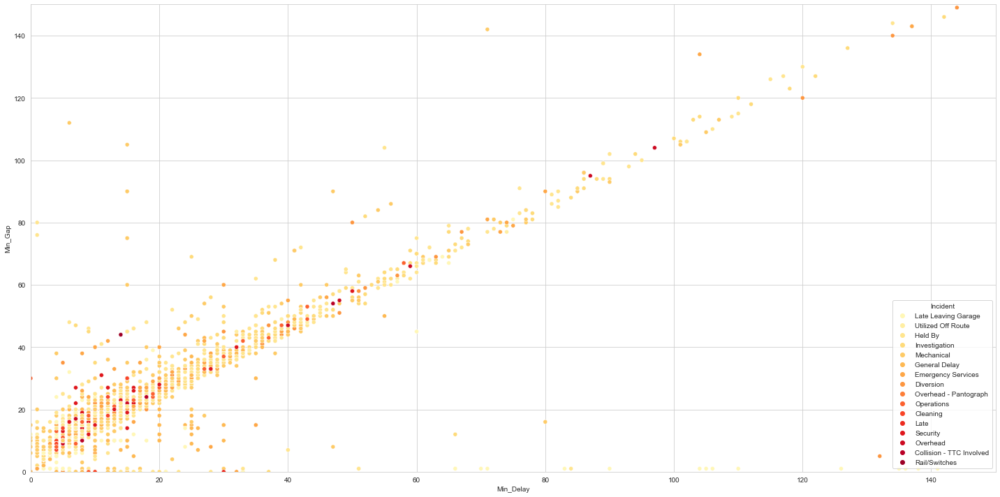

In [140]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='YlOrRd')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### afmhot

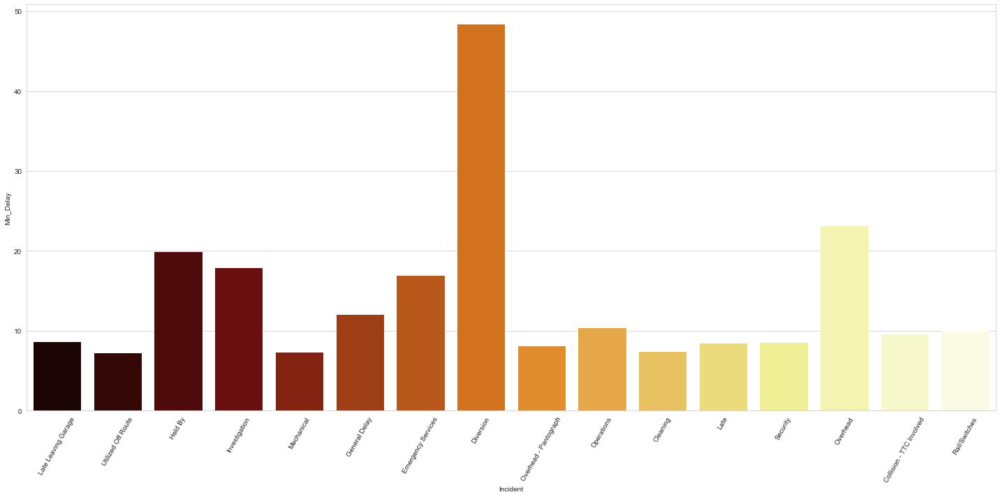

In [141]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='afmhot', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

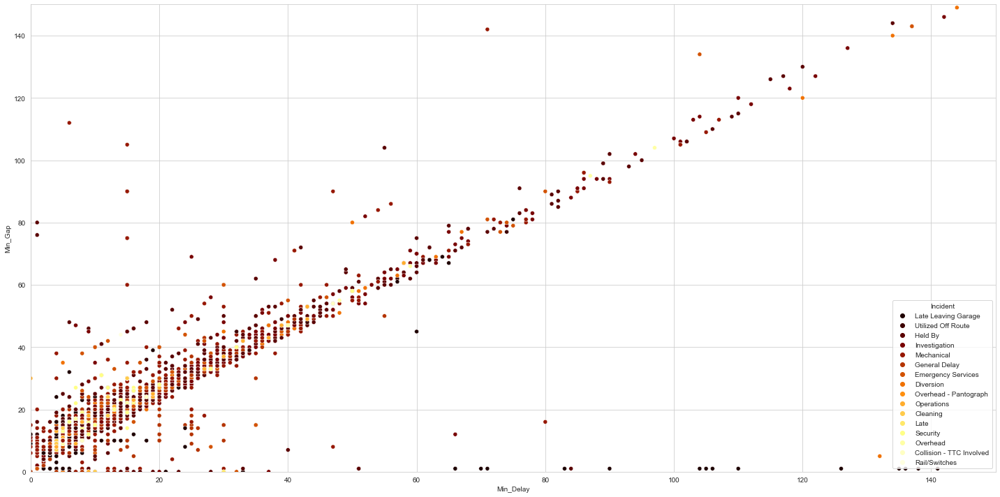

In [142]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='afmhot')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### autumn

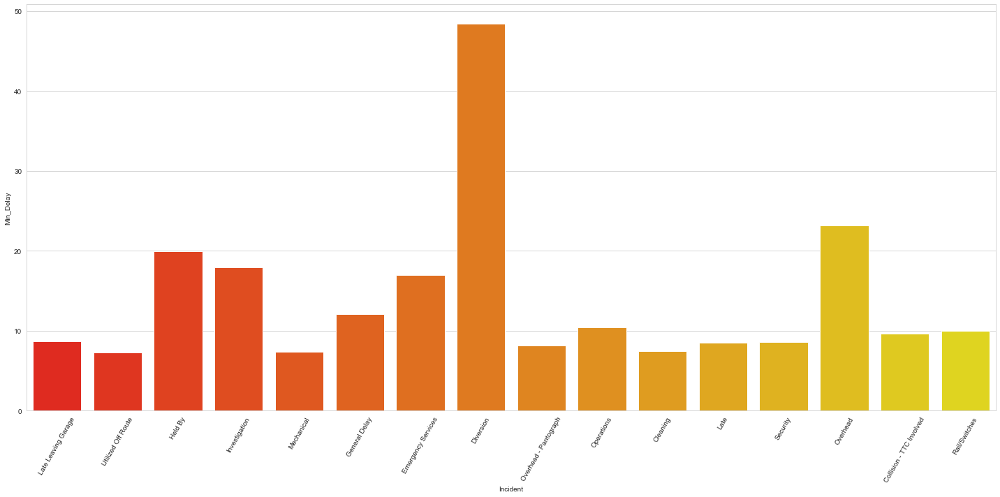

In [144]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='autumn', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

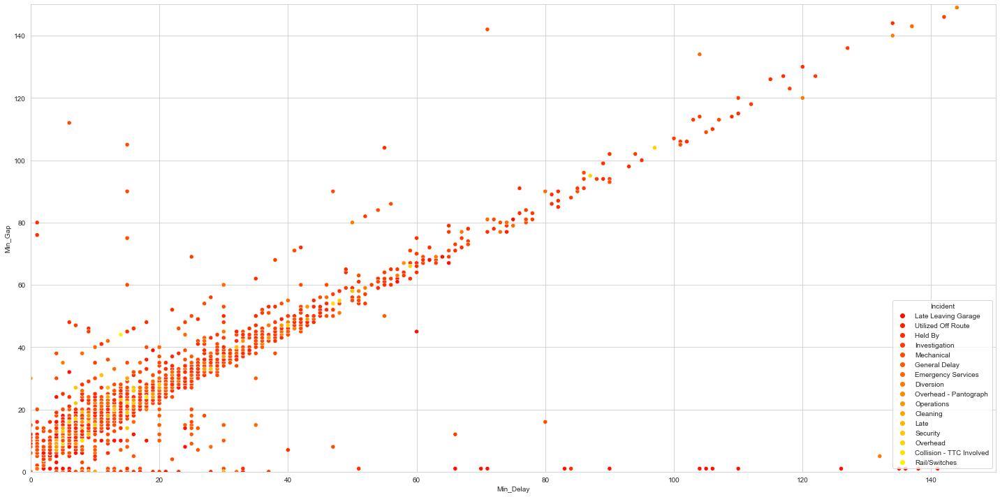

In [143]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='autumn')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### binary

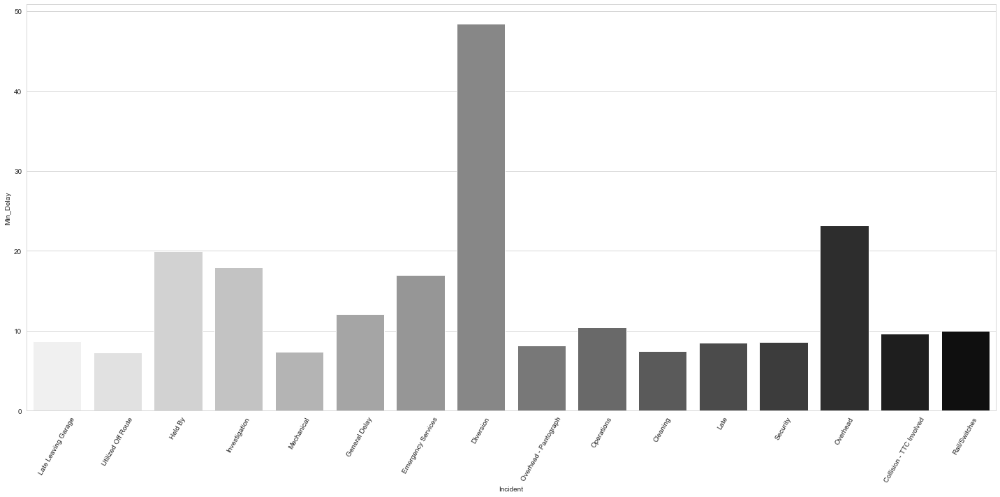

In [145]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='binary', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

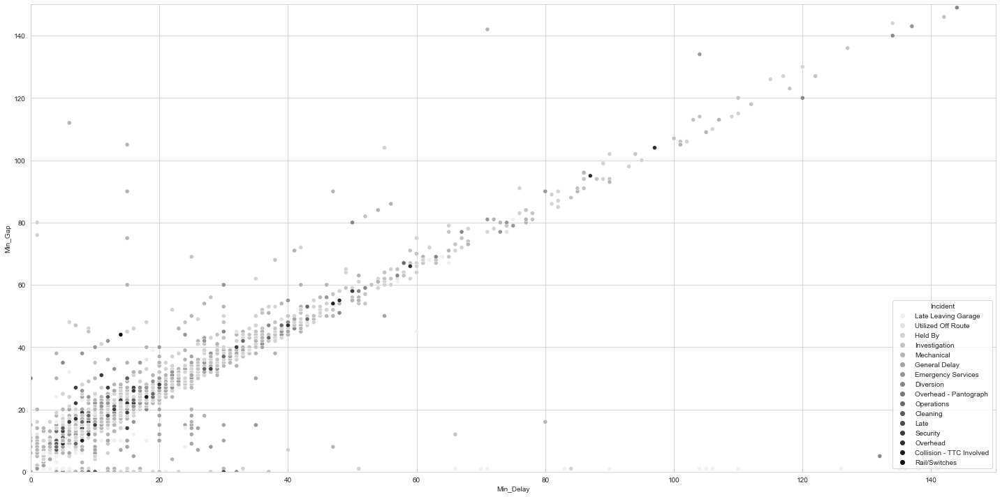

In [146]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='binary')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### bone

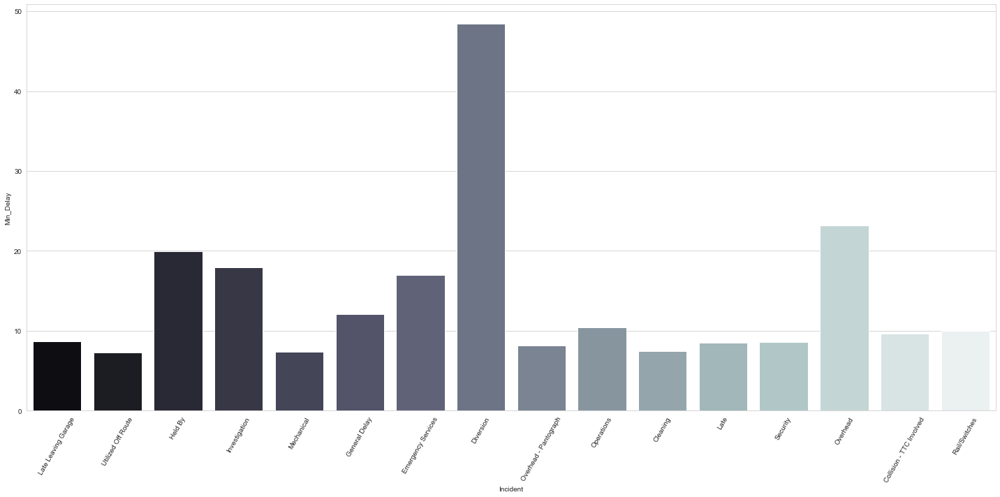

In [148]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='bone', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

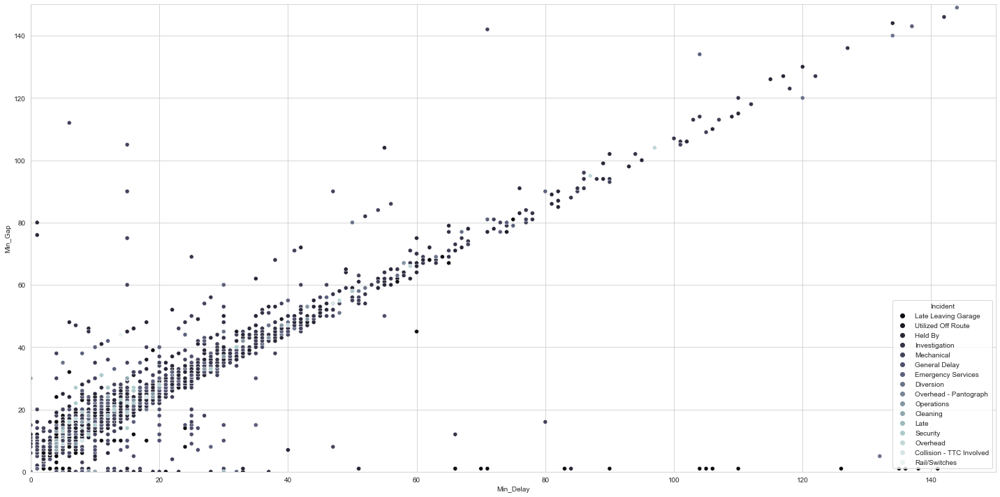

In [147]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='bone')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### brg

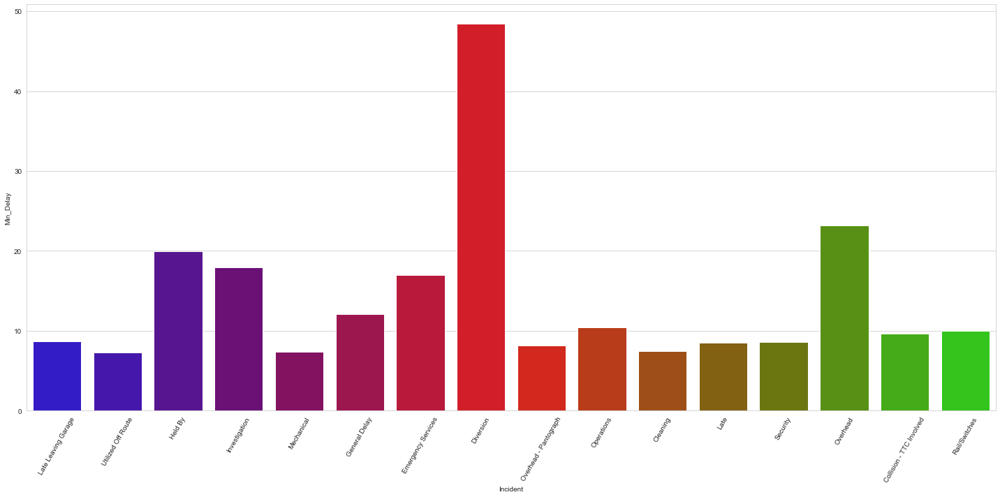

In [149]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='brg', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

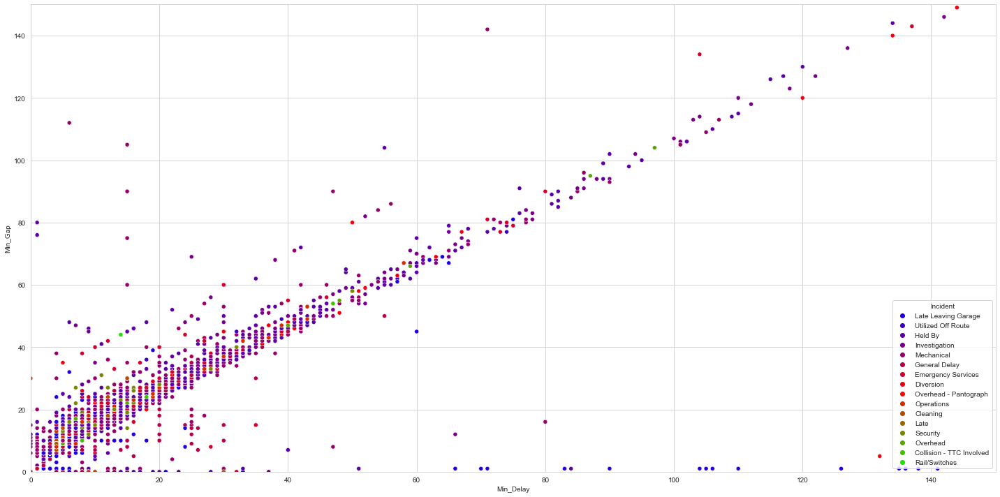

In [150]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='brg')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### bwr

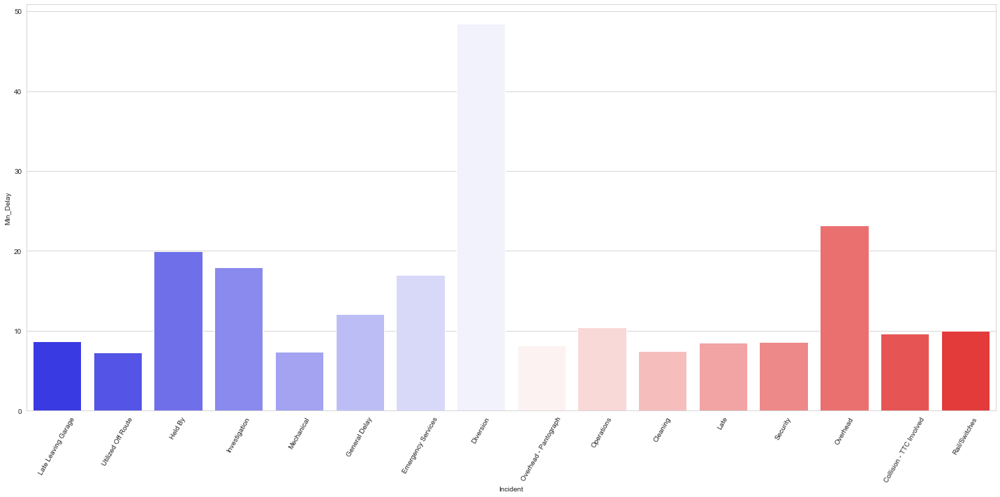

In [152]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='bwr', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

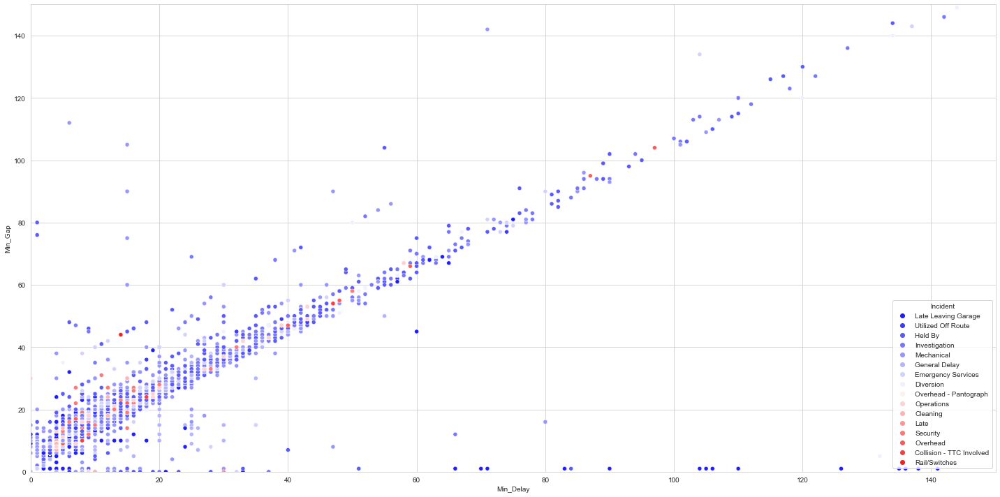

In [151]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='bwr')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### cividis

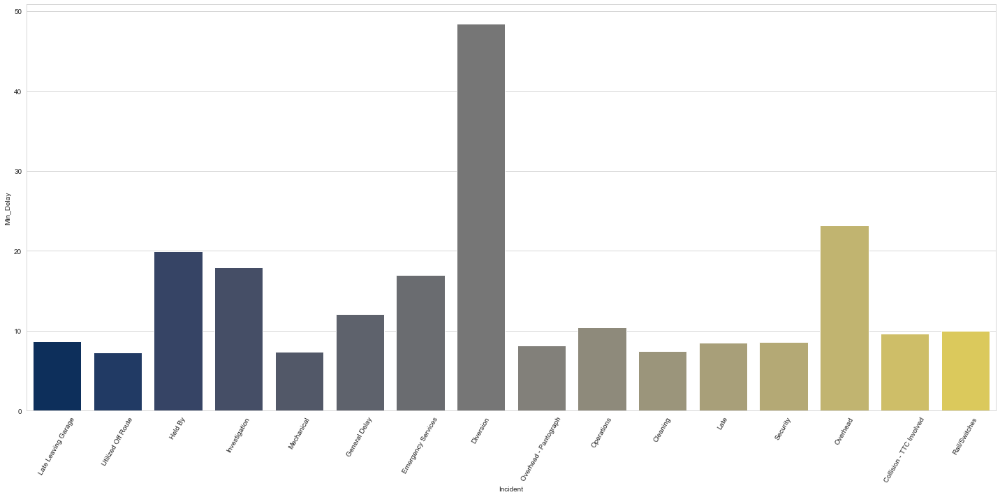

In [153]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='cividis', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

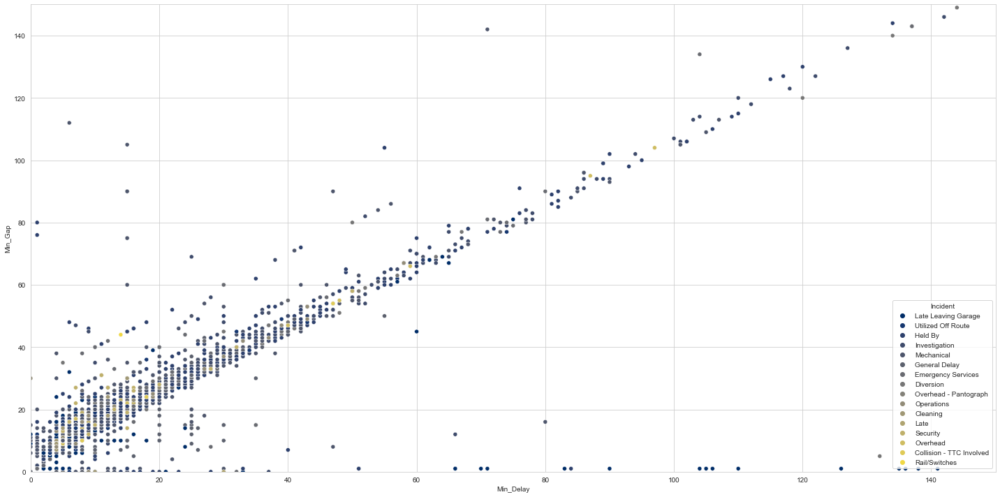

In [154]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='cividis')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### cool

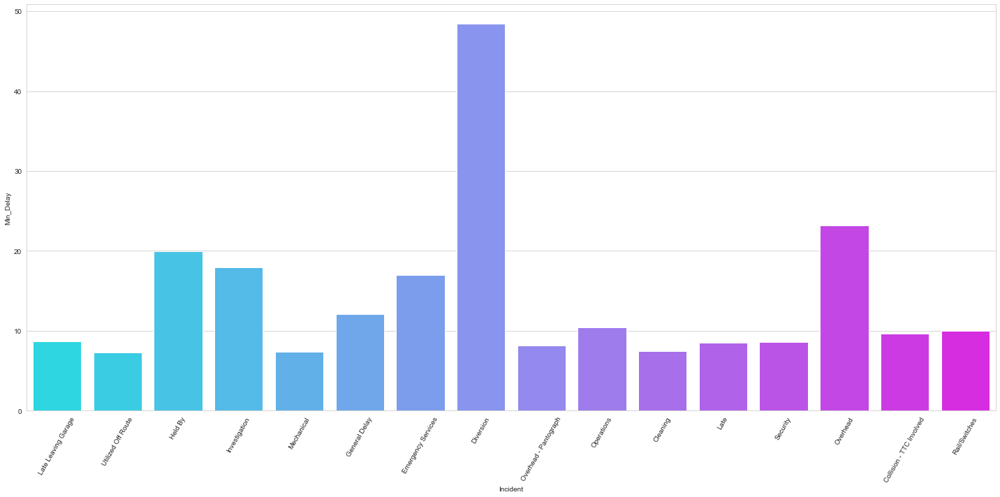

In [156]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='cool', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

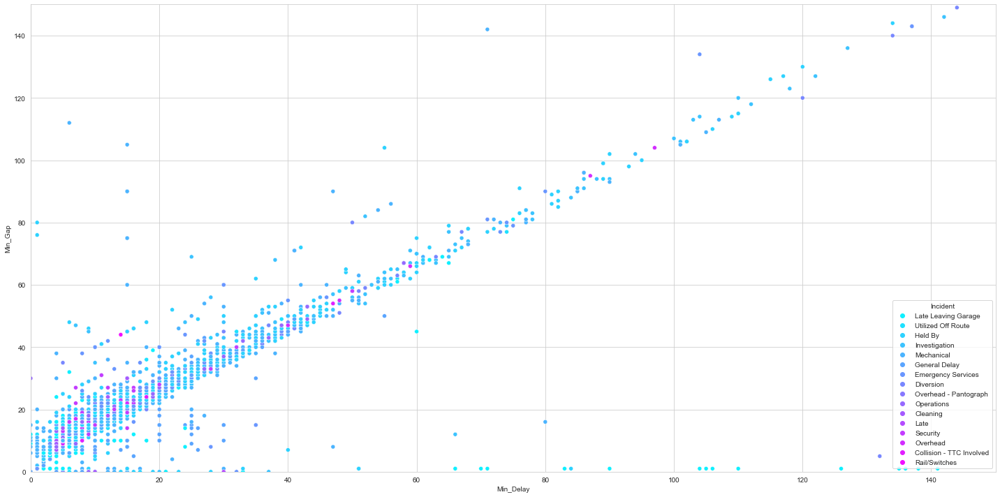

In [155]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='cool')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### coolwarm

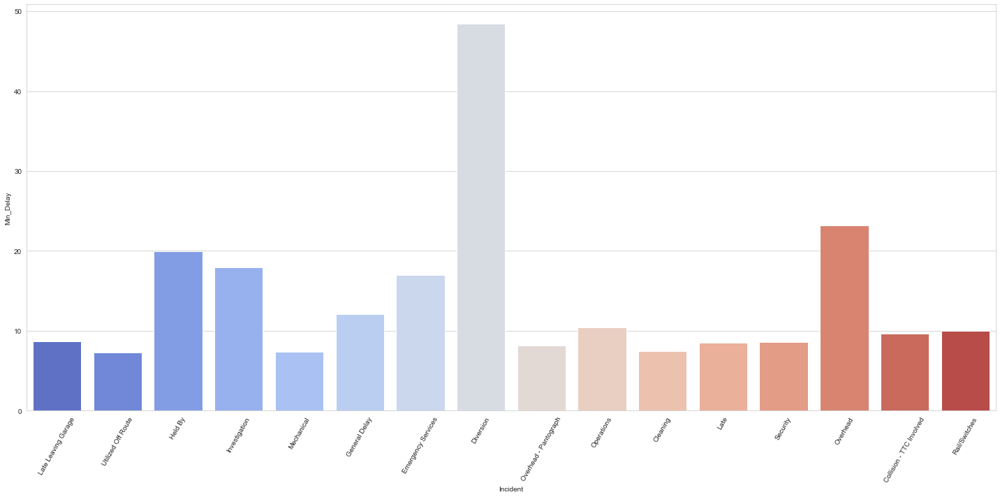

In [157]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='coolwarm', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

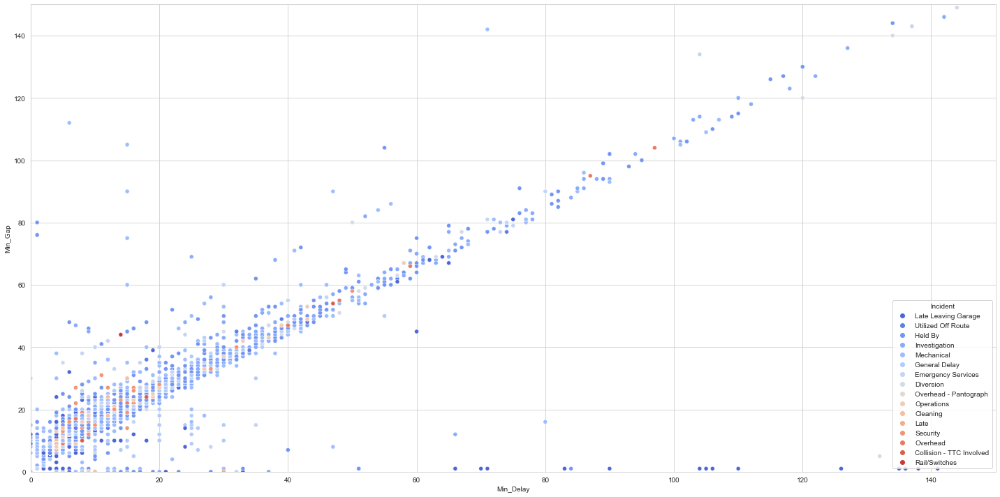

In [158]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='coolwarm')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### copper

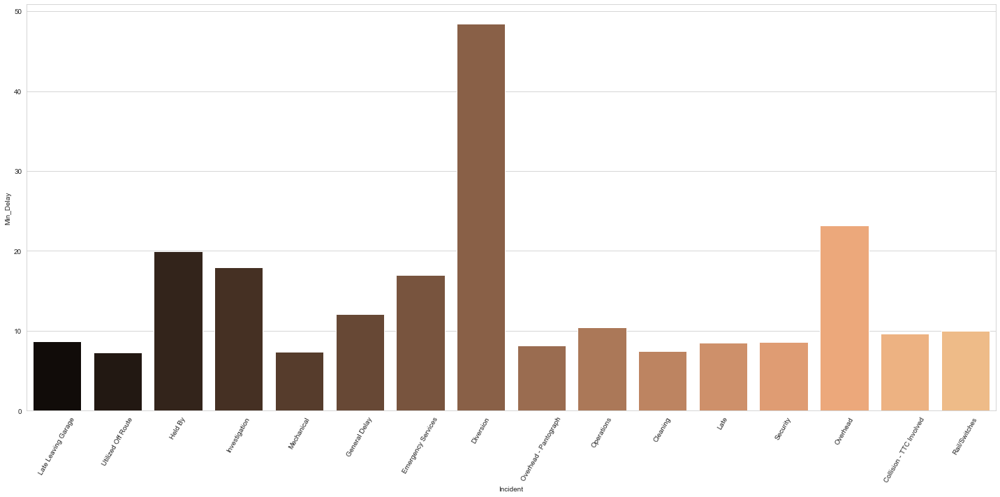

In [160]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='copper', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

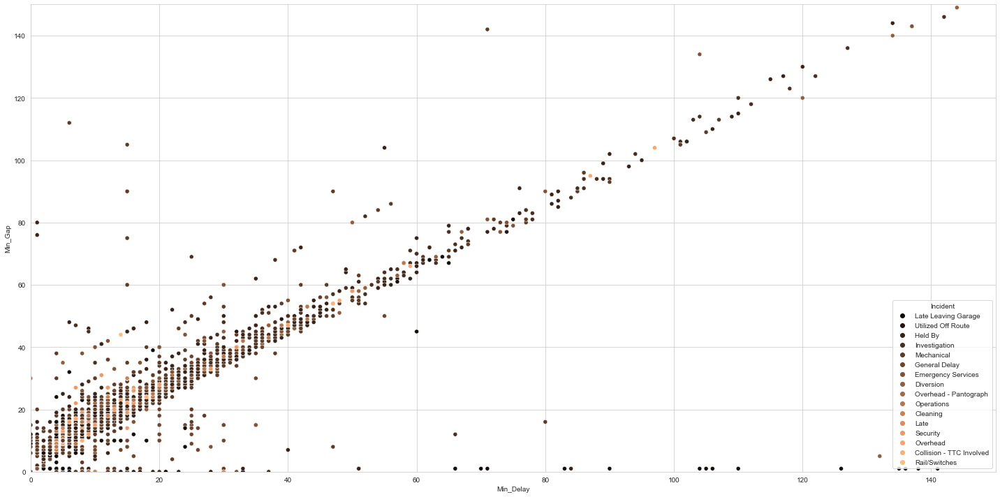

In [159]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='copper')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### crest

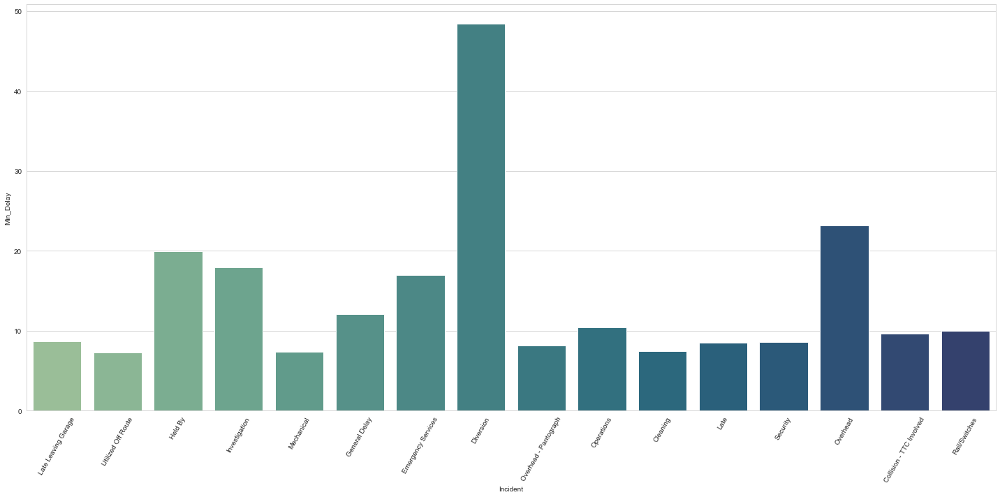

In [161]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='crest', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

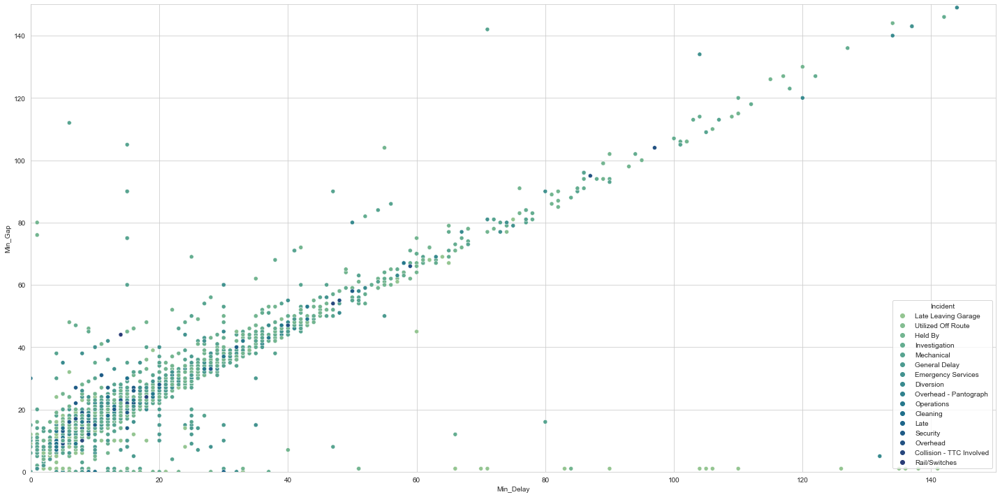

In [162]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='crest')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### cubehelix

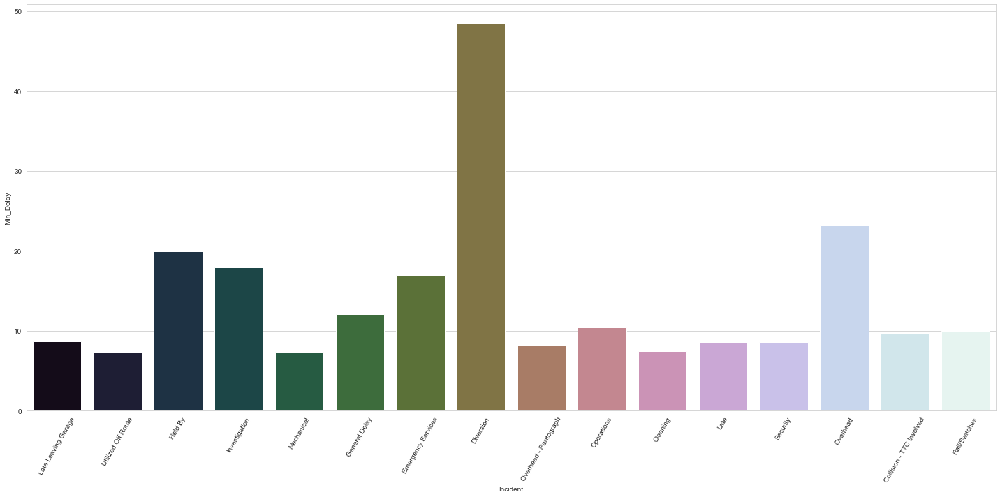

In [164]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='cubehelix', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

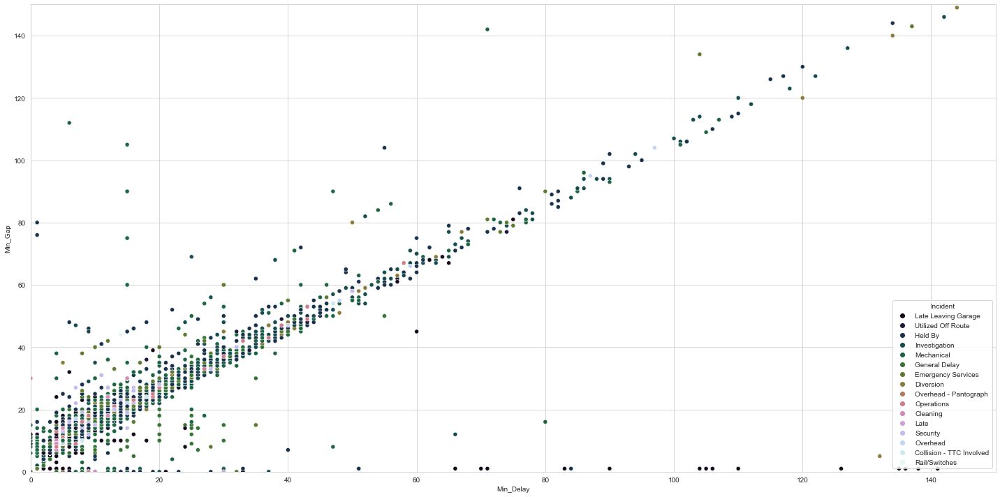

In [163]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='cubehelix')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### flag

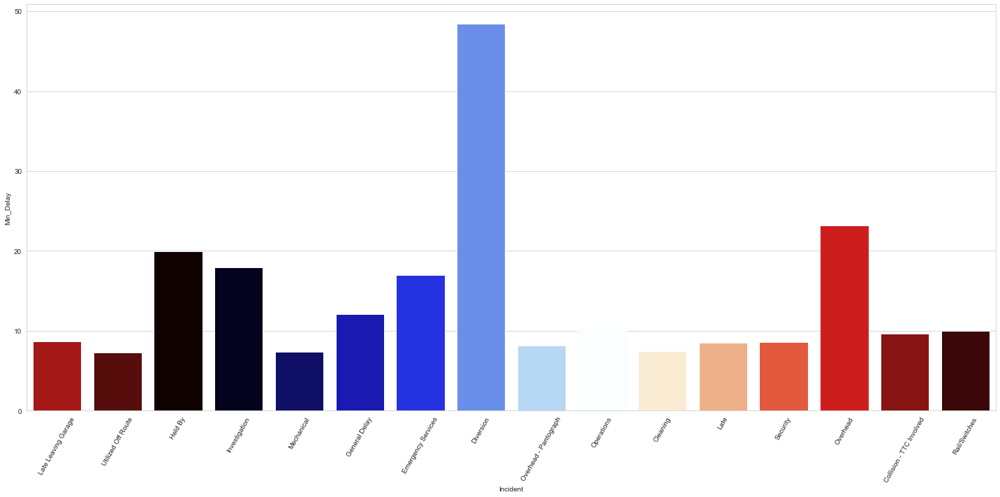

In [165]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='flag', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

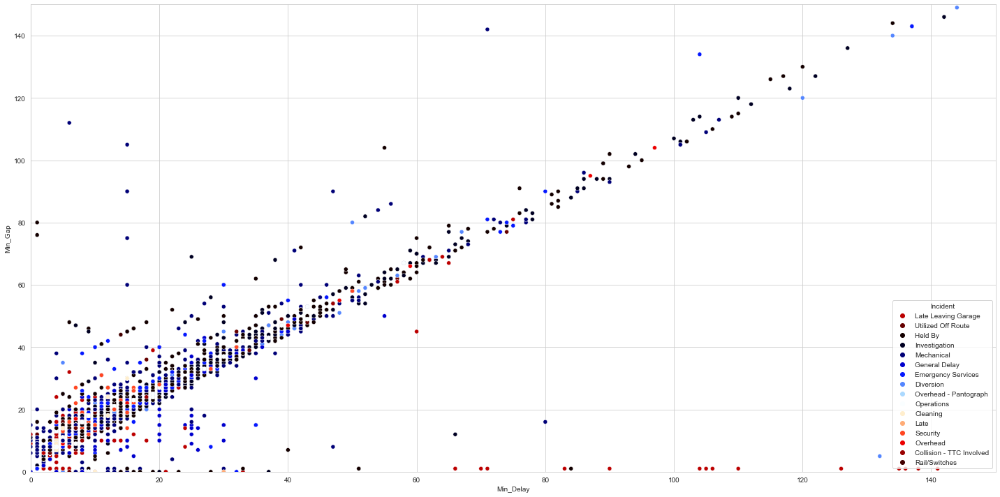

In [166]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='flag')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### flare

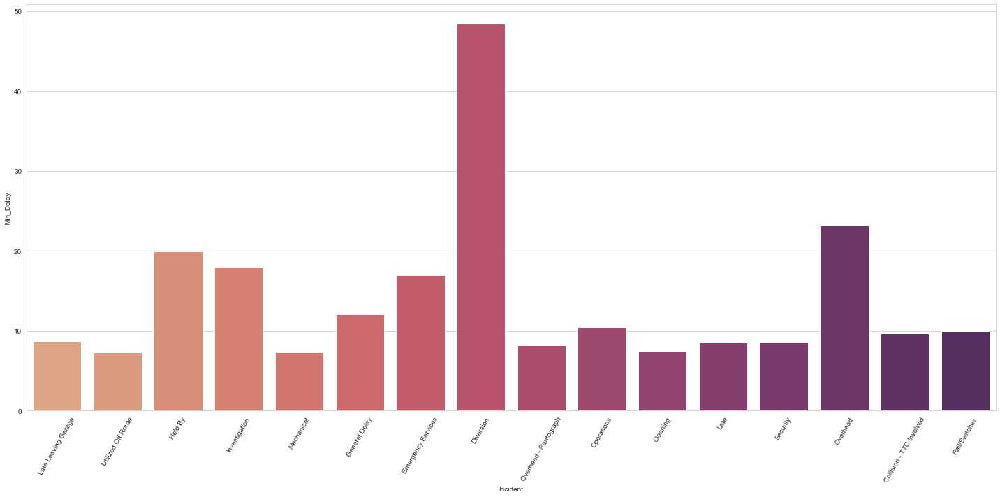

In [168]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='flare', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

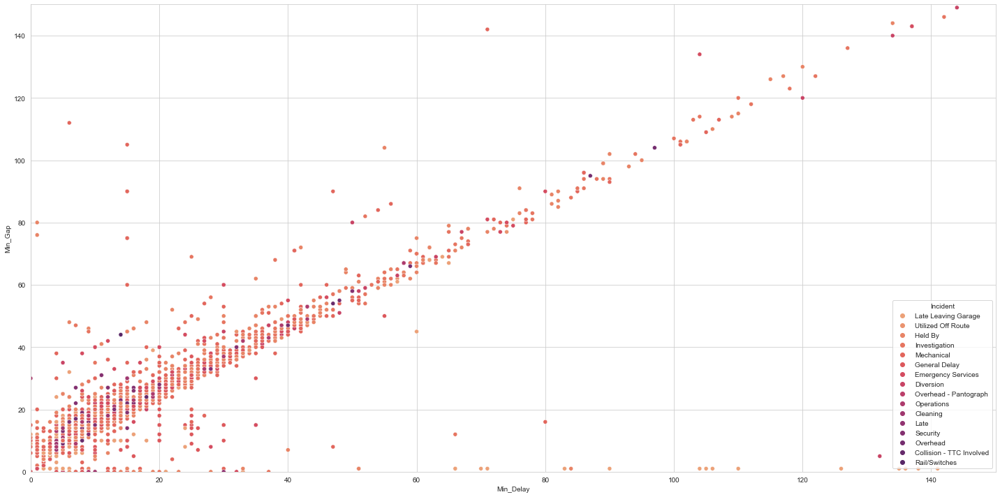

In [167]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='flare')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### gist_earth

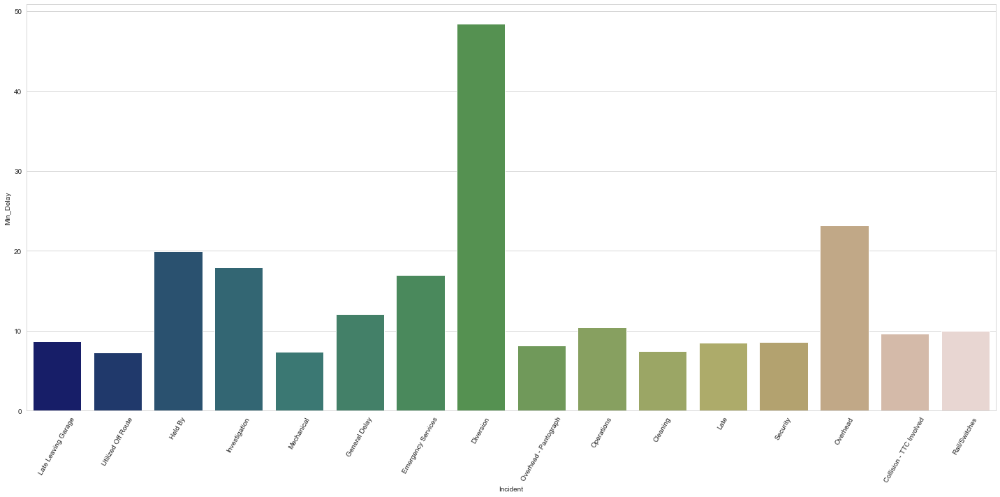

In [169]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='gist_earth', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

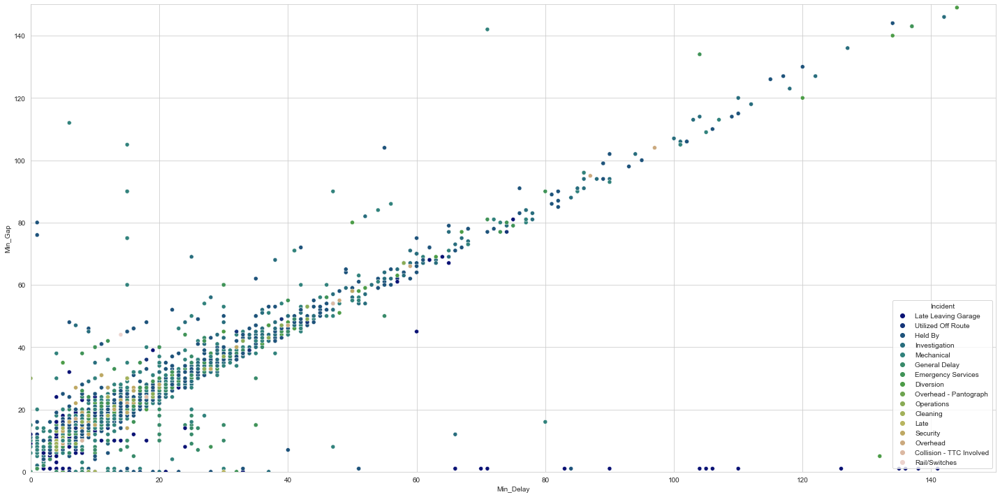

In [170]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='gist_earth')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### gist_gray

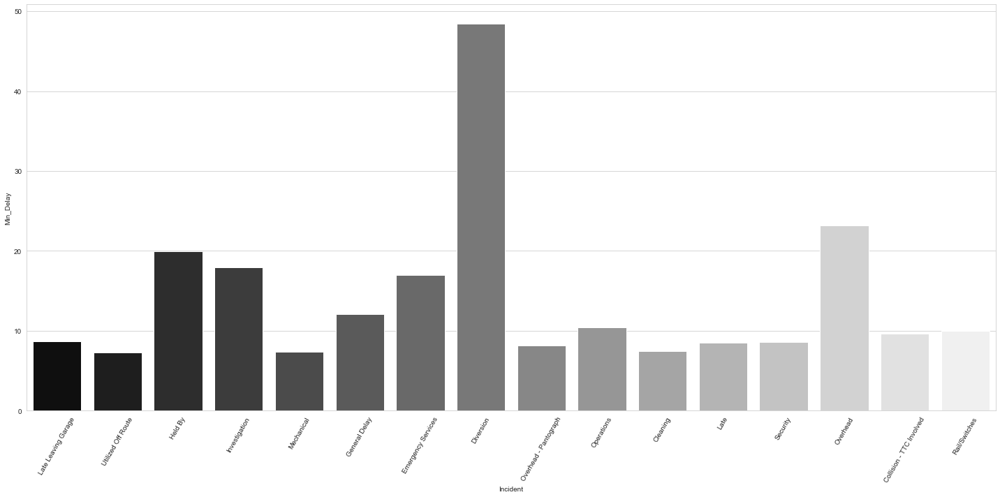

In [173]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='gist_gray', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

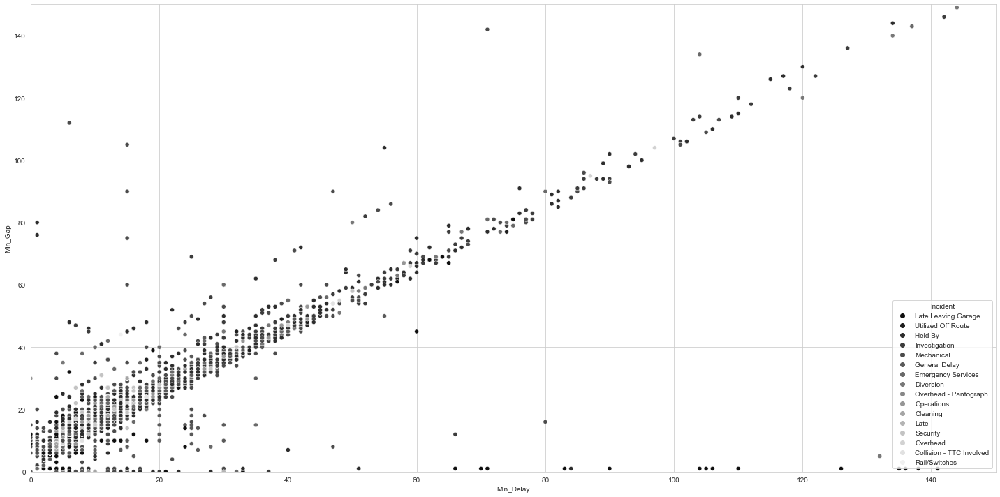

In [172]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='gist_gray')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### gist_heat

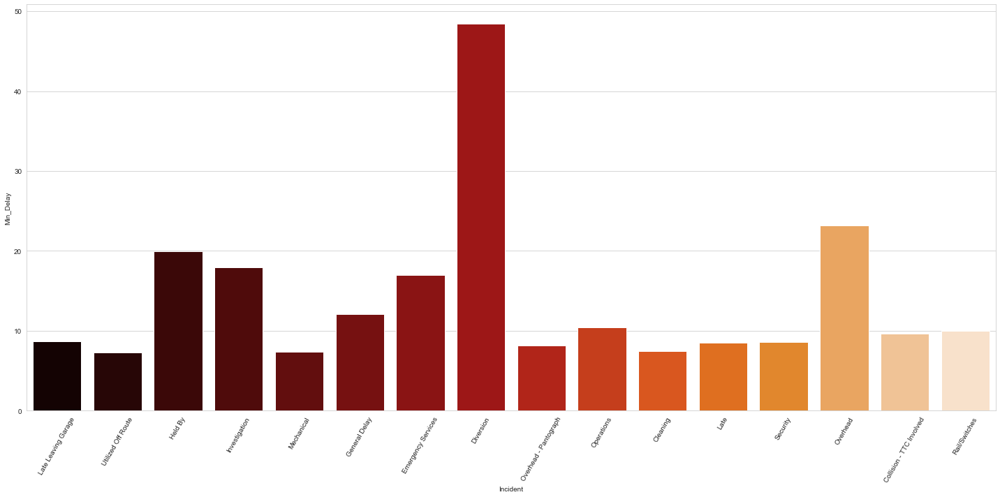

In [174]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='gist_heat', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

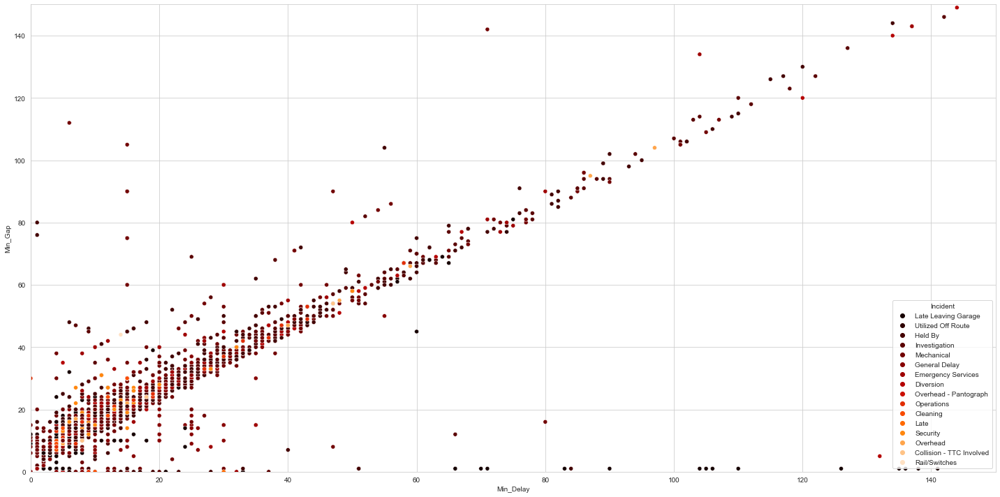

In [175]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='gist_heat')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### gist_ncar

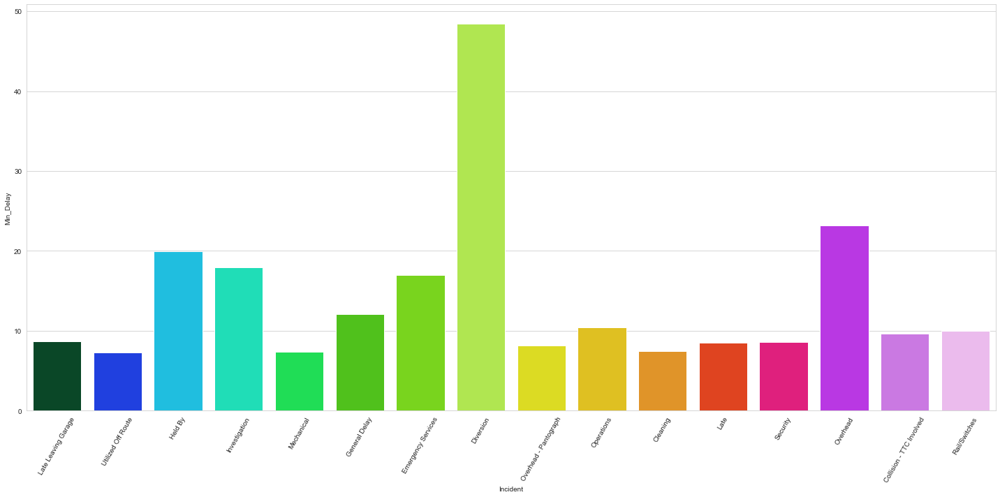

In [177]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='gist_ncar', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

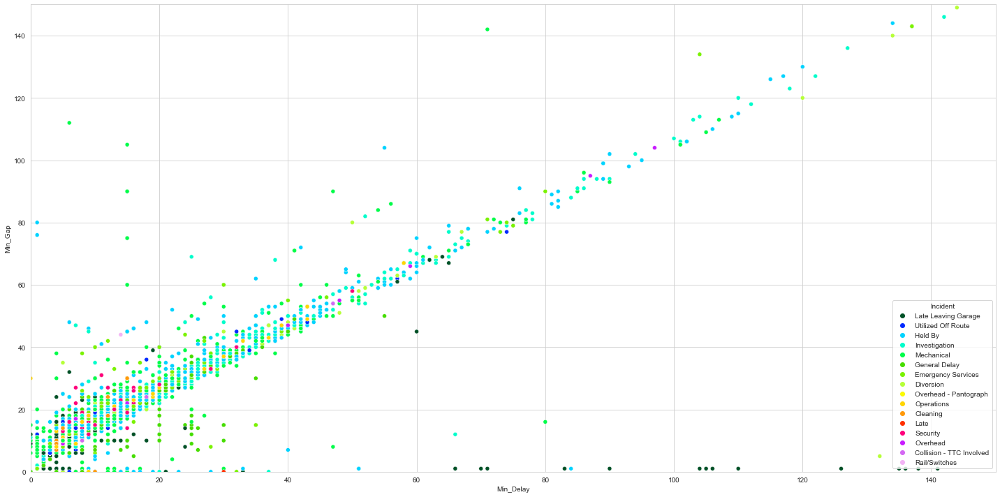

In [176]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='gist_ncar')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### gist_rainbow

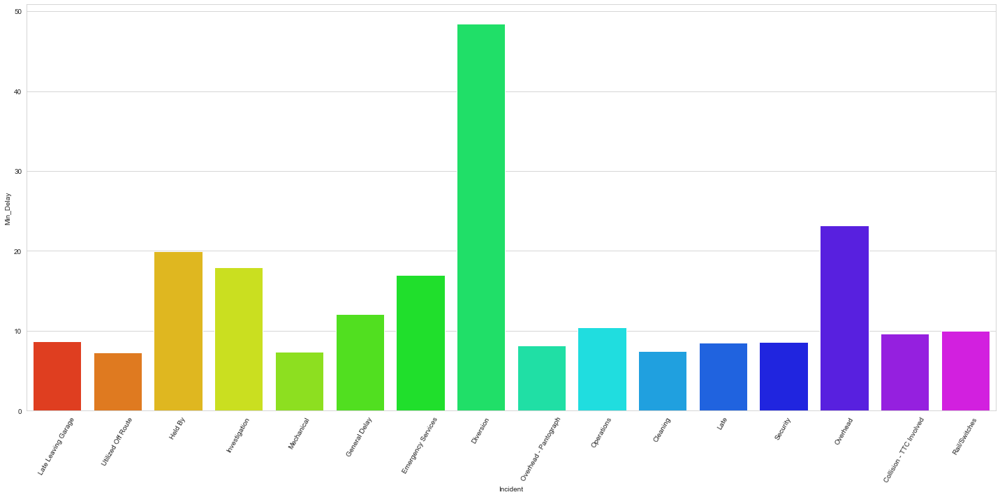

In [178]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='gist_rainbow', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

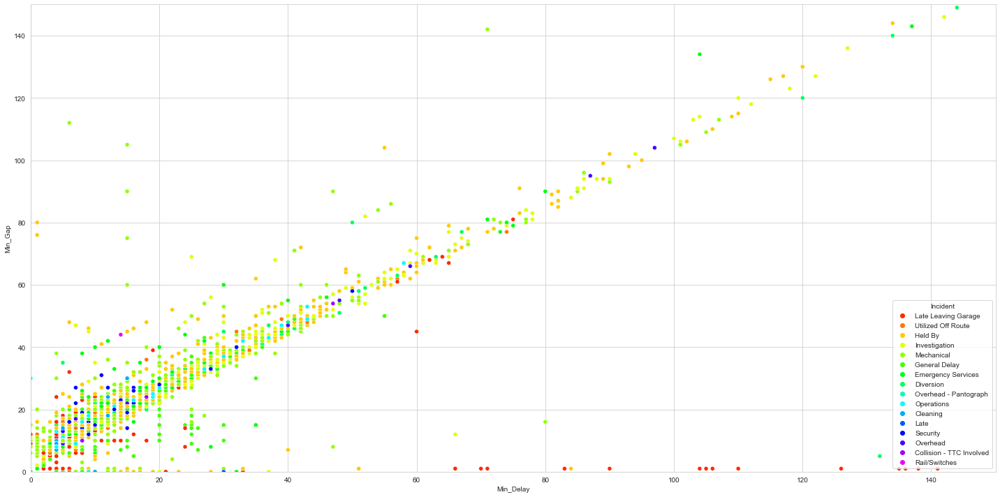

In [179]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='gist_rainbow')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### gist_stern

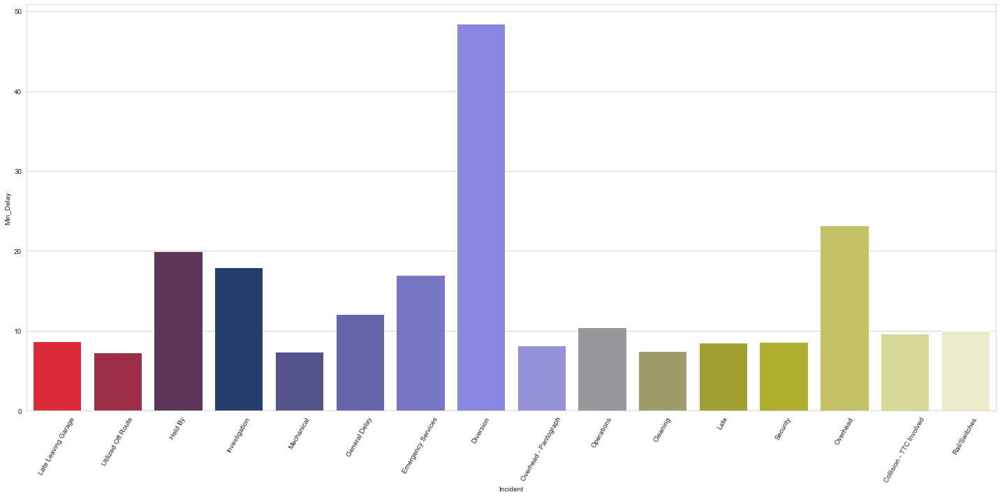

In [181]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='gist_stern', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

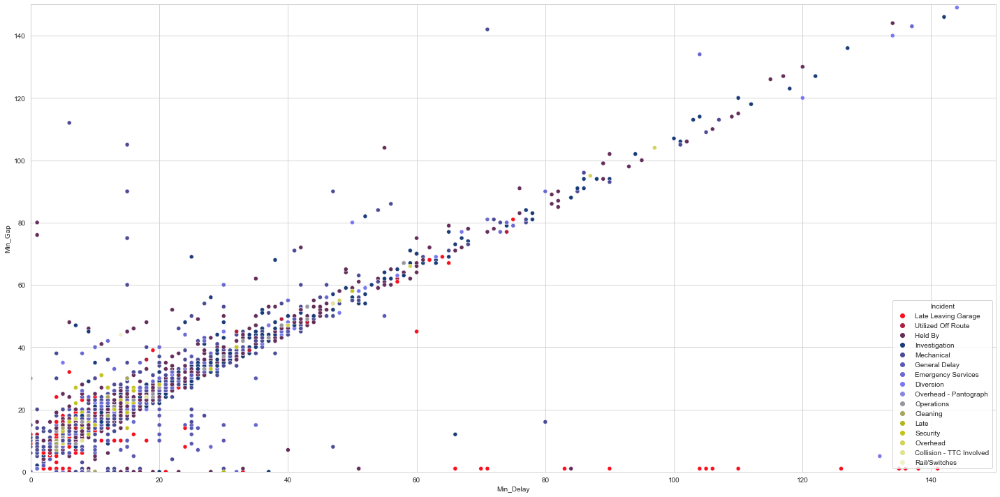

In [180]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='gist_stern')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### gist_yarg

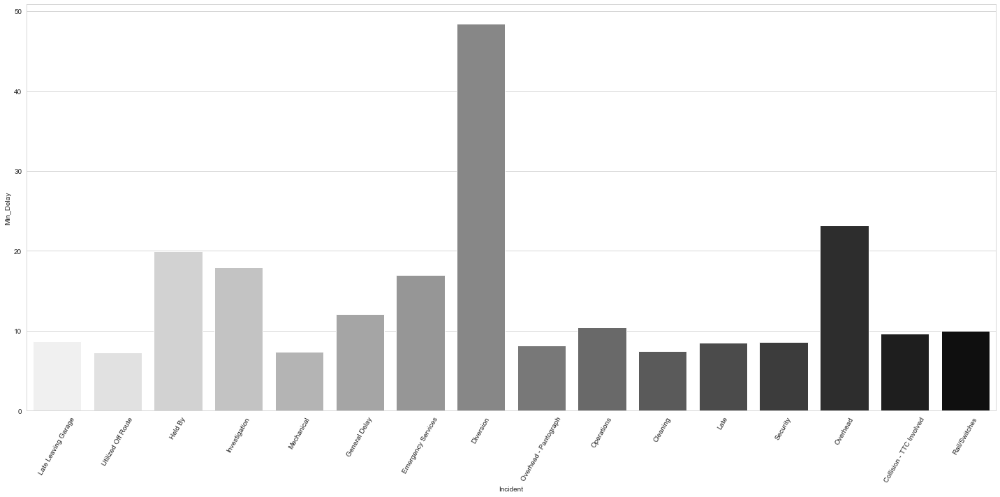

In [182]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='gist_yarg', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

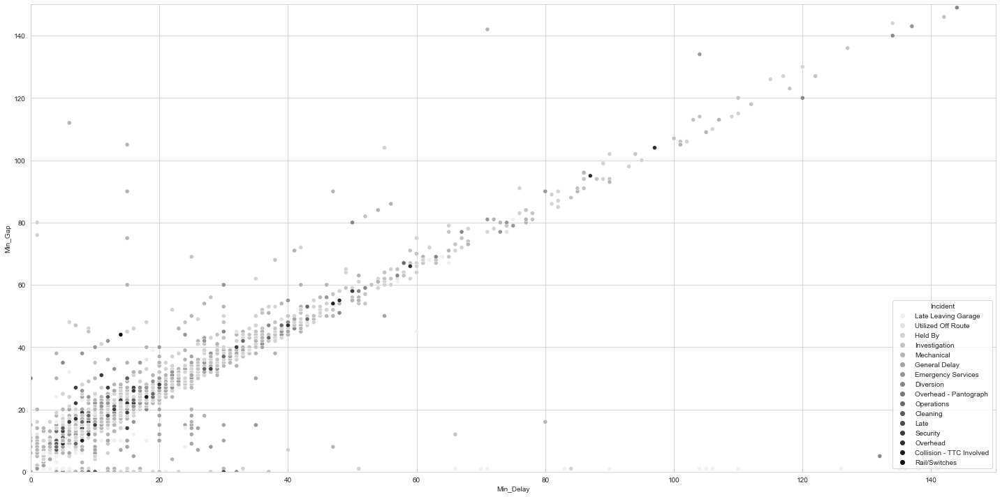

In [183]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='gist_yarg')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### gnuplot

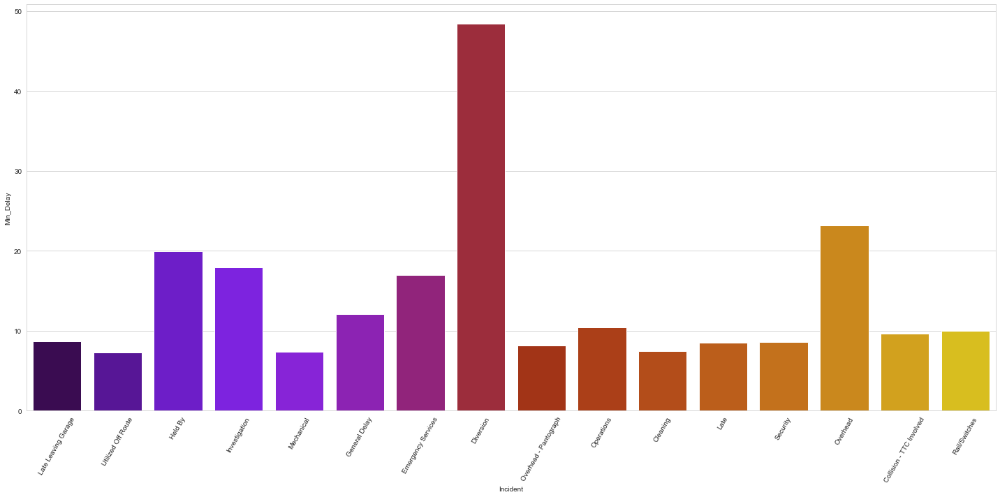

In [184]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='gnuplot', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

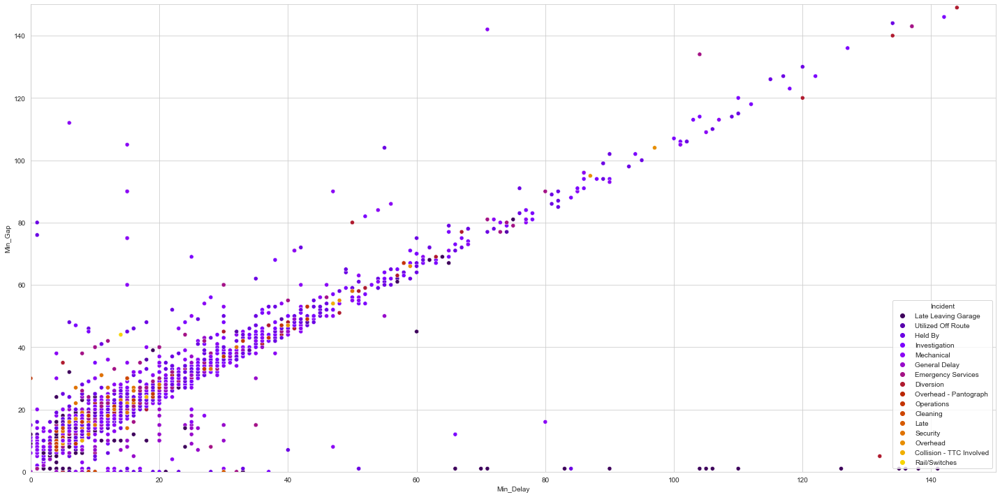

In [185]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='gnuplot')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### gnuplot2

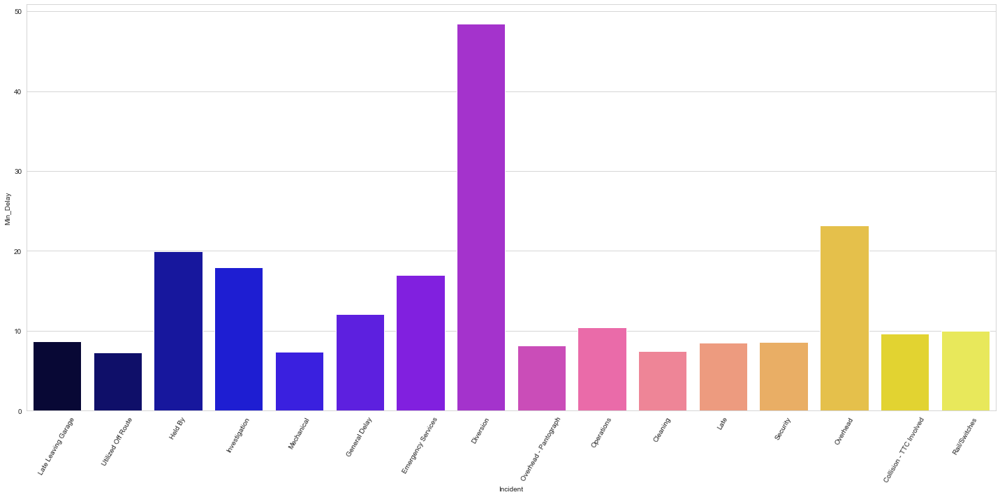

In [187]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='gnuplot2', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

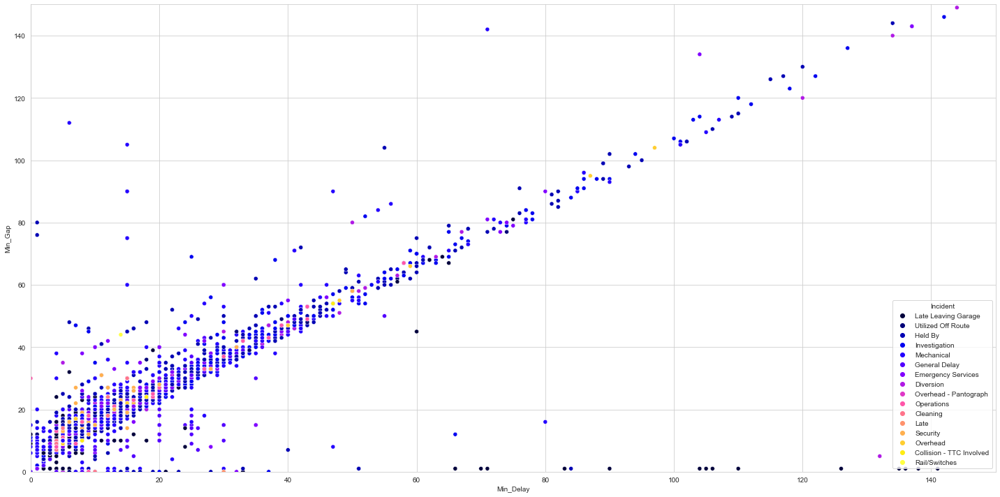

In [186]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='gnuplot2')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### gray

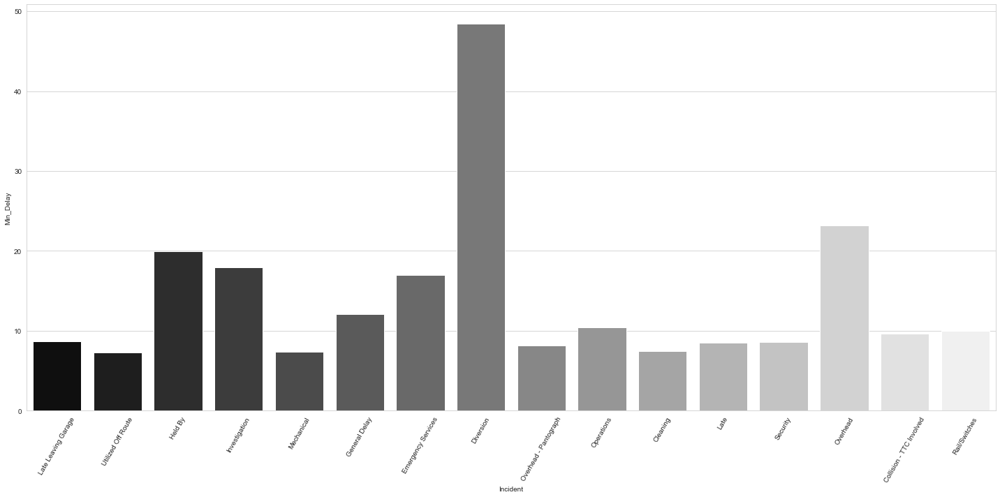

In [188]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='gray', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

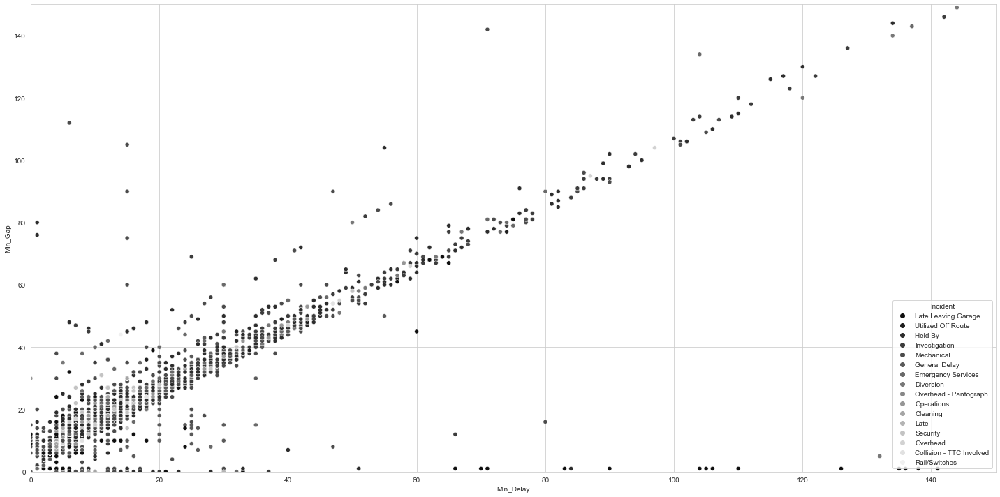

In [189]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='gray')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### hot

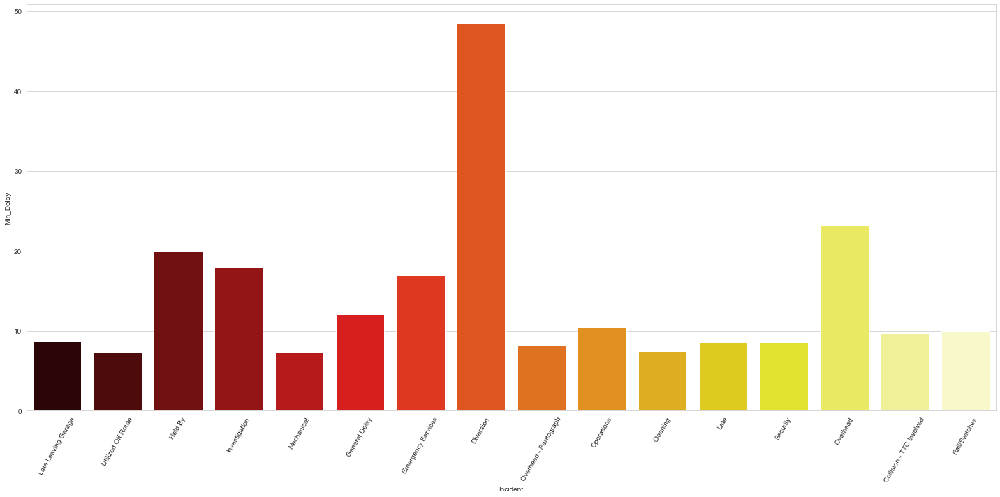

In [191]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='hot', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

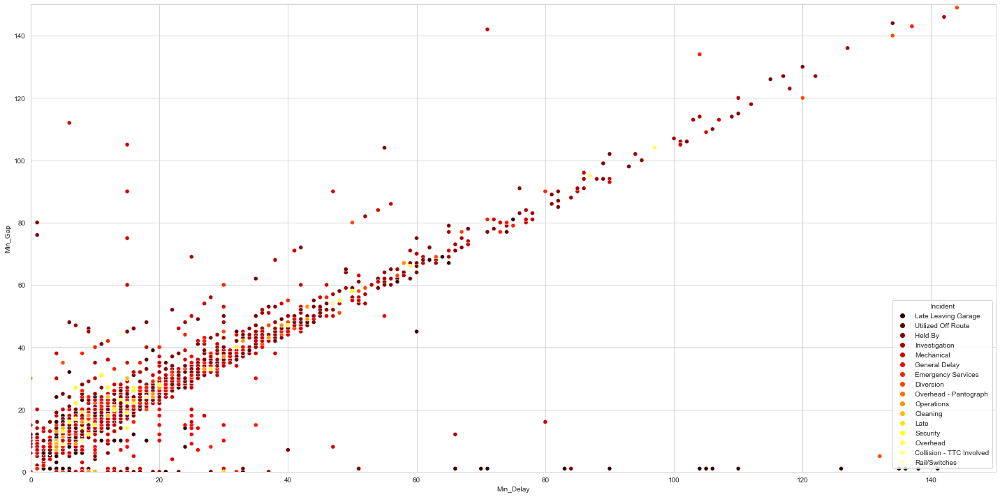

In [190]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='hot')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### hsv

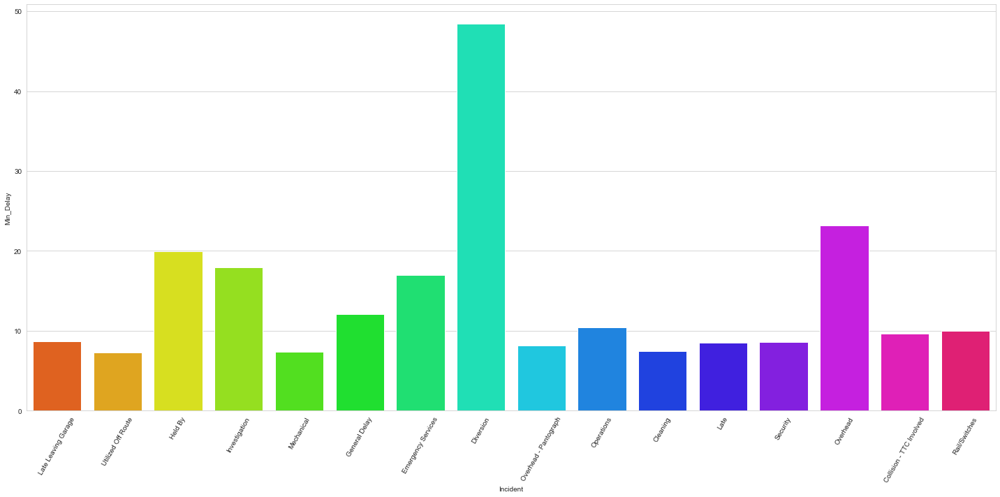

In [192]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='hsv', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

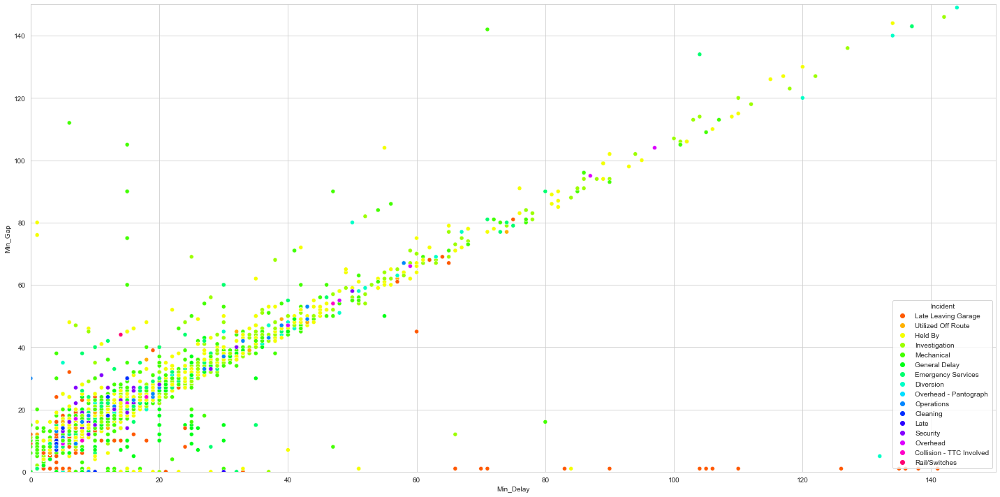

In [193]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='hsv')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### icefire

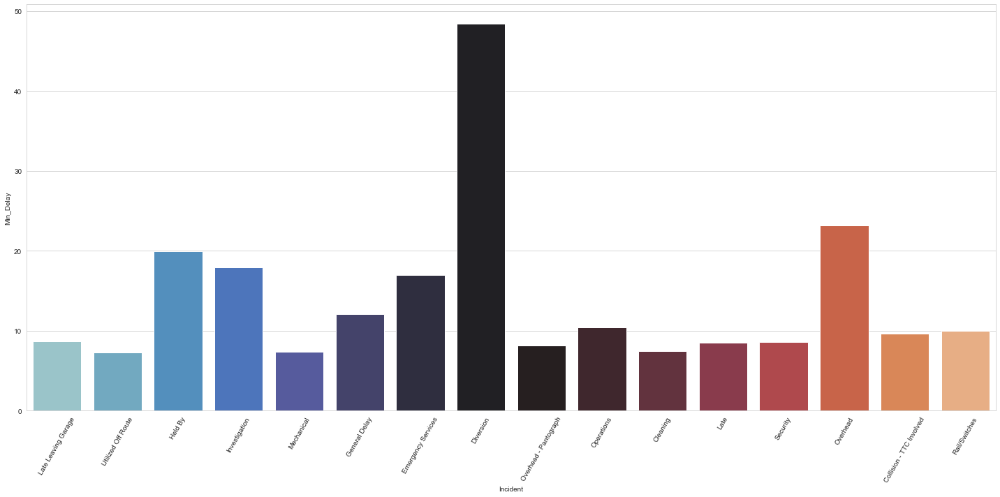

In [195]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='icefire', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

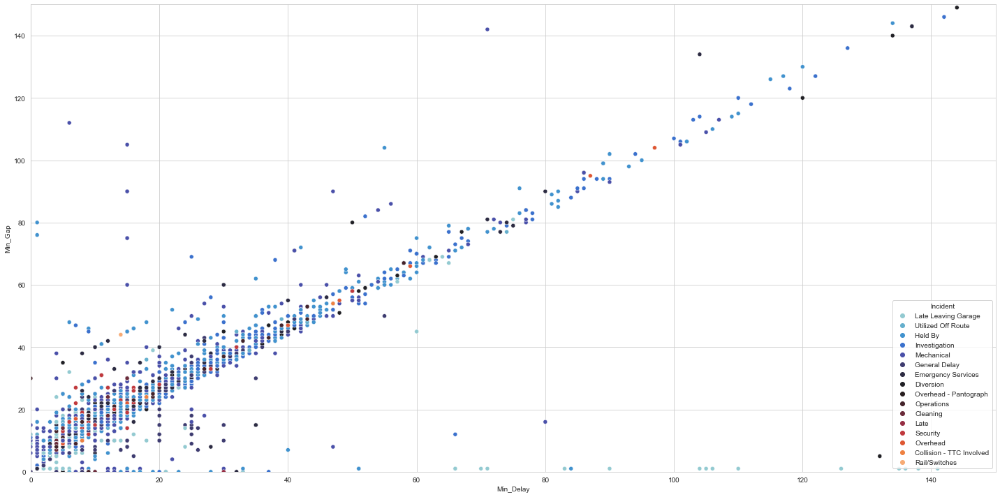

In [194]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='icefire')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### inferno

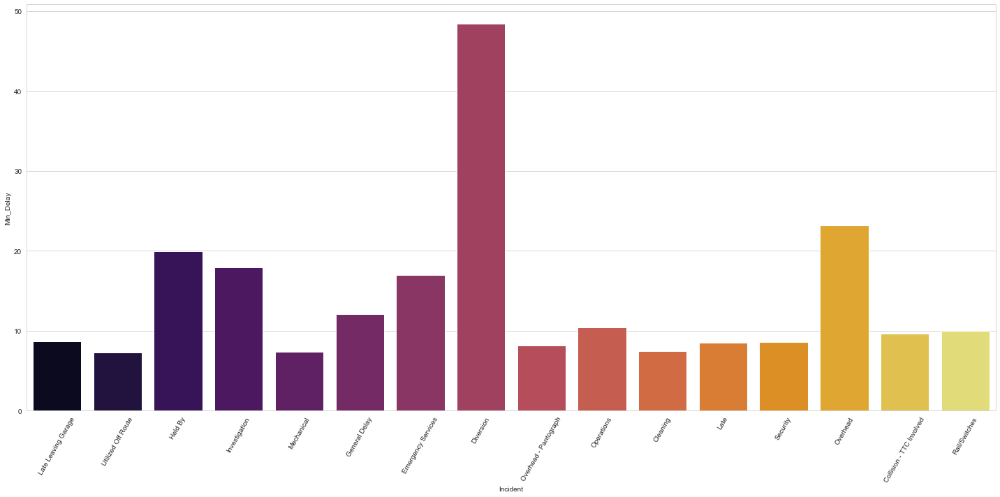

In [196]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='inferno', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

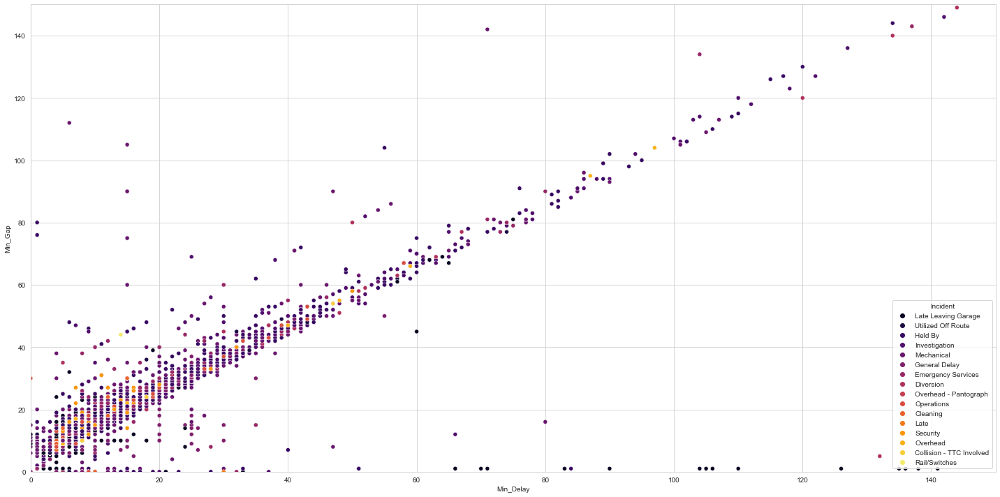

In [197]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='inferno')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### magma

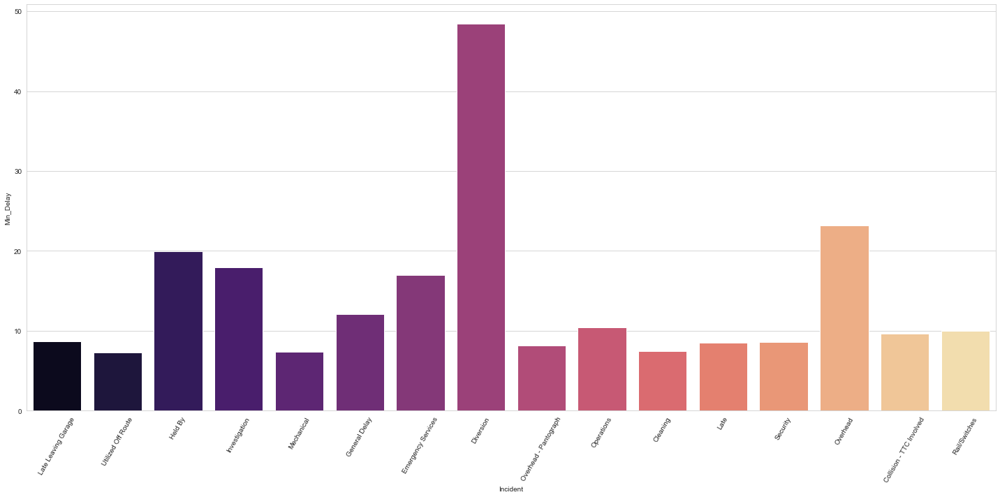

In [201]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='magma', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

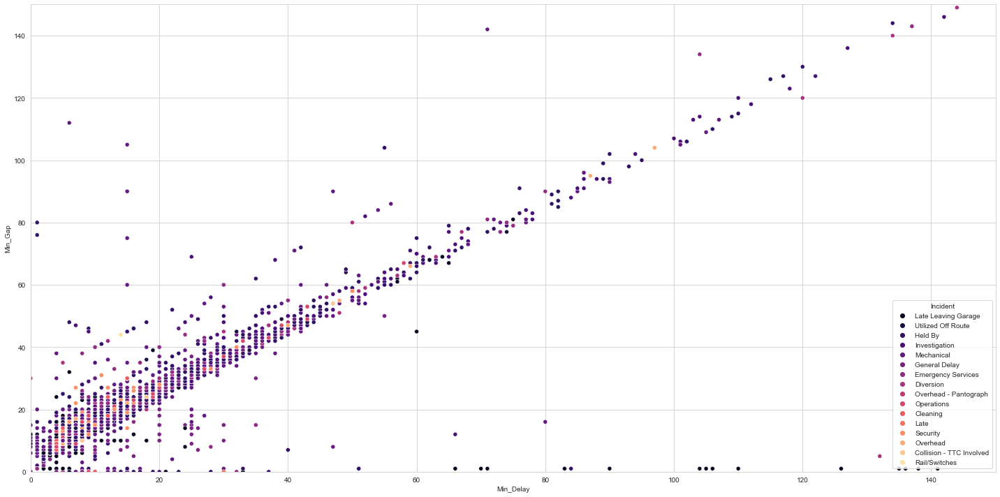

In [202]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='magma')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### mako

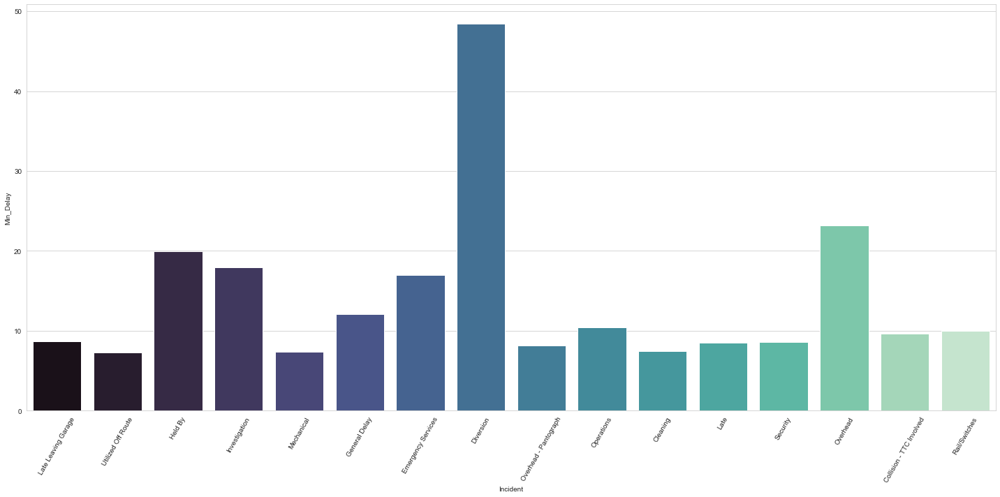

In [204]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='mako', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

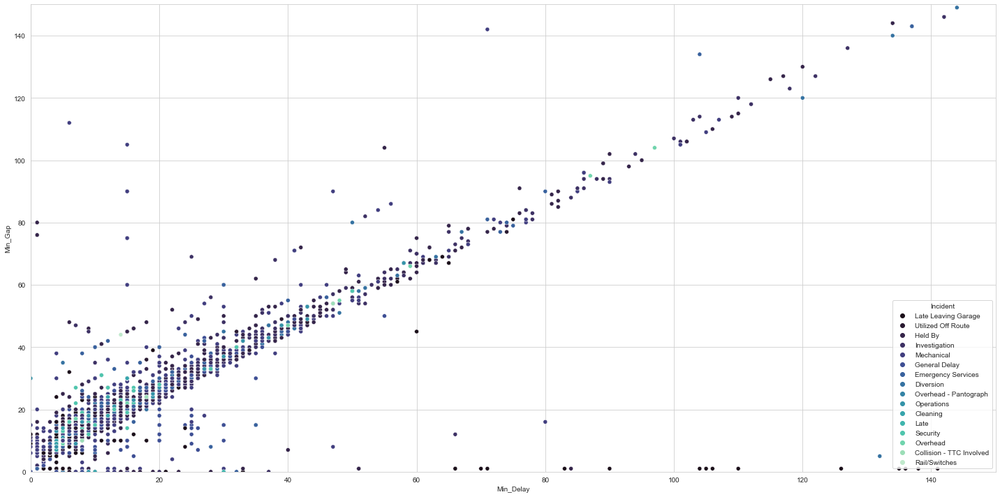

In [203]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='mako')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### nipy_spectral

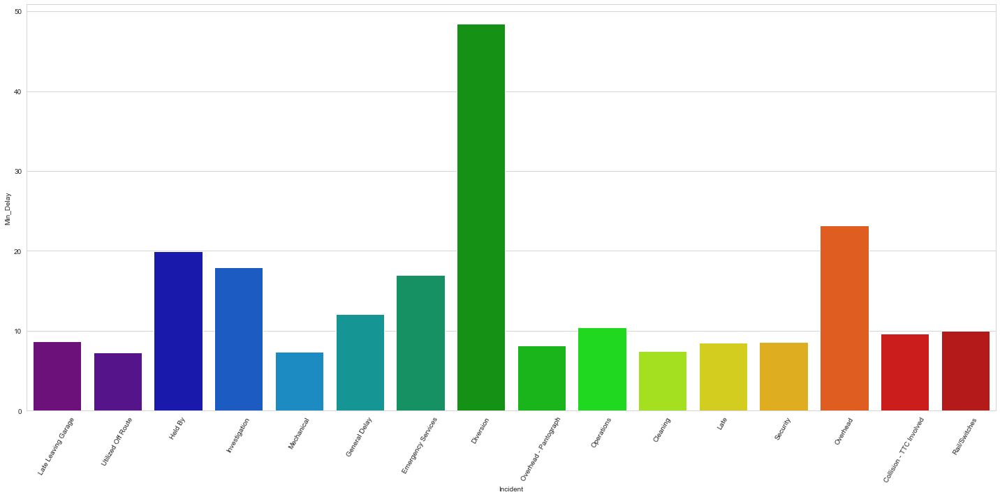

In [205]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='nipy_spectral', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

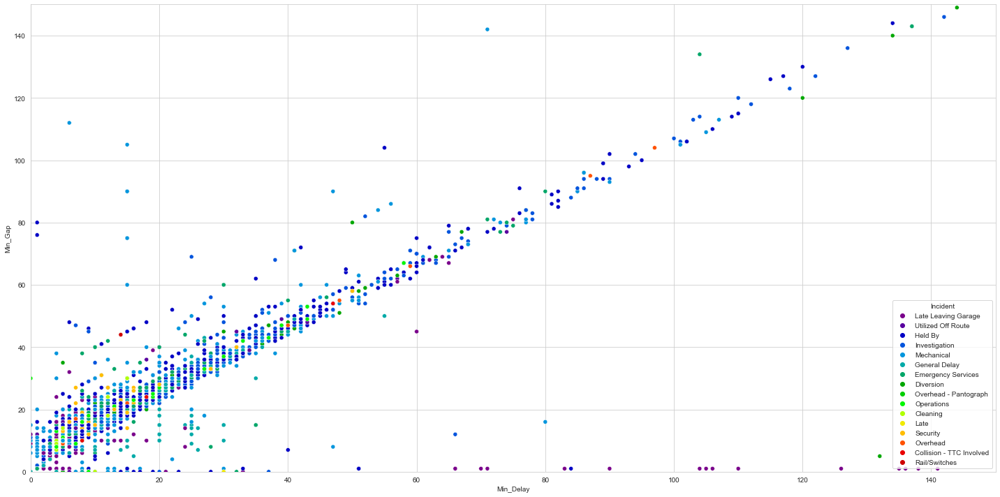

In [206]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='nipy_spectral')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### ocean

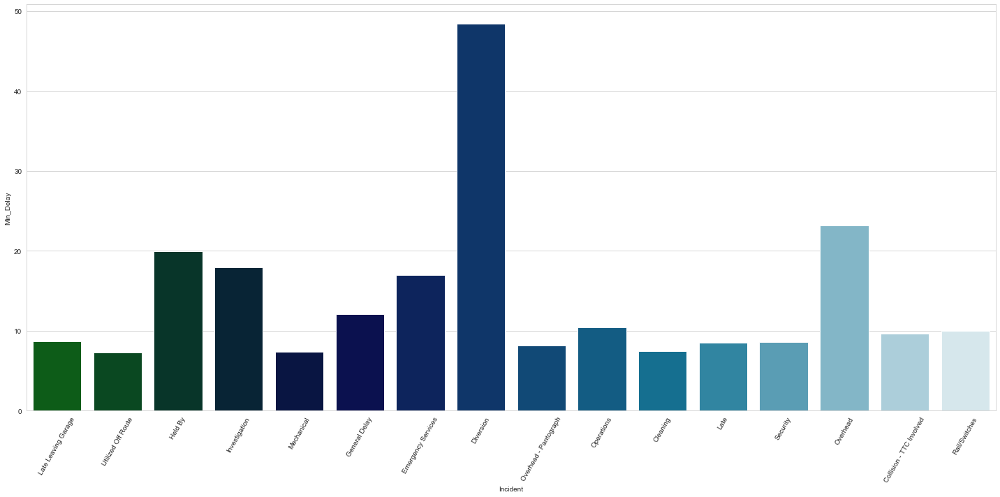

In [208]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='ocean', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

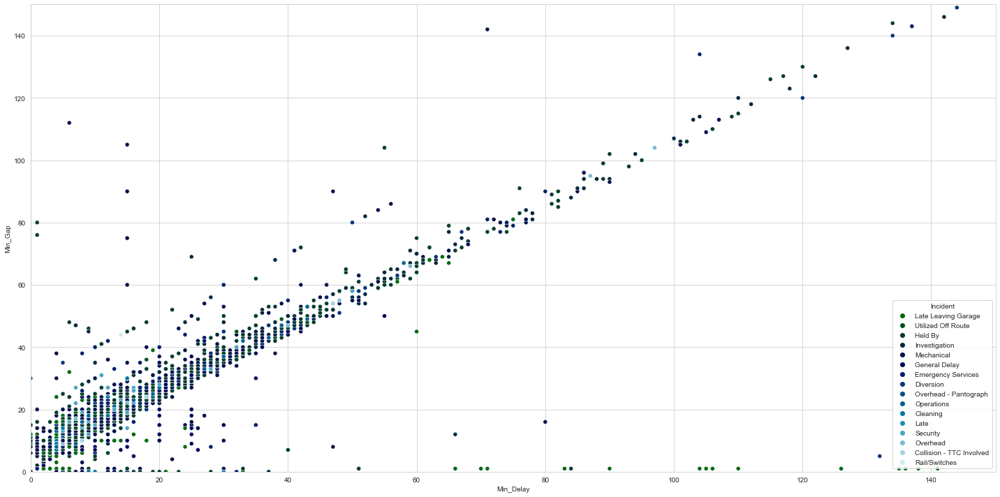

In [207]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='ocean')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### pink

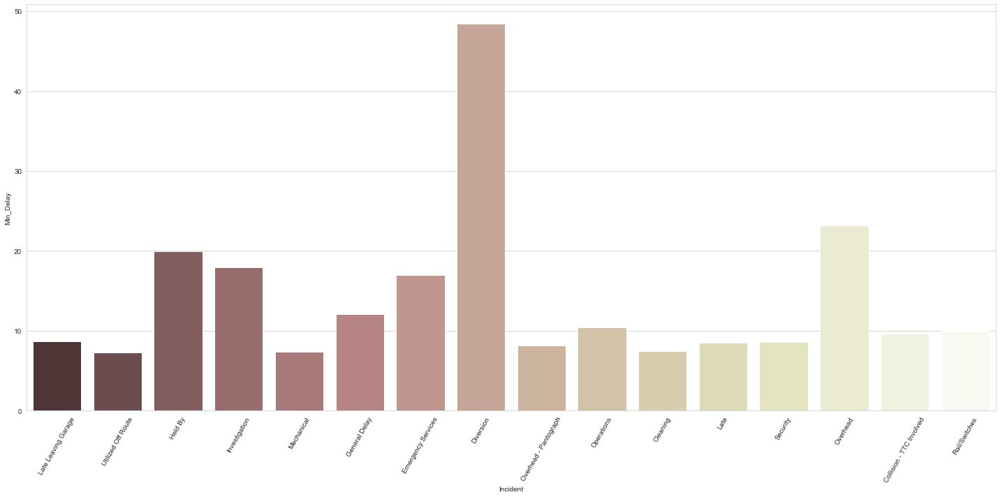

In [209]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='pink', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

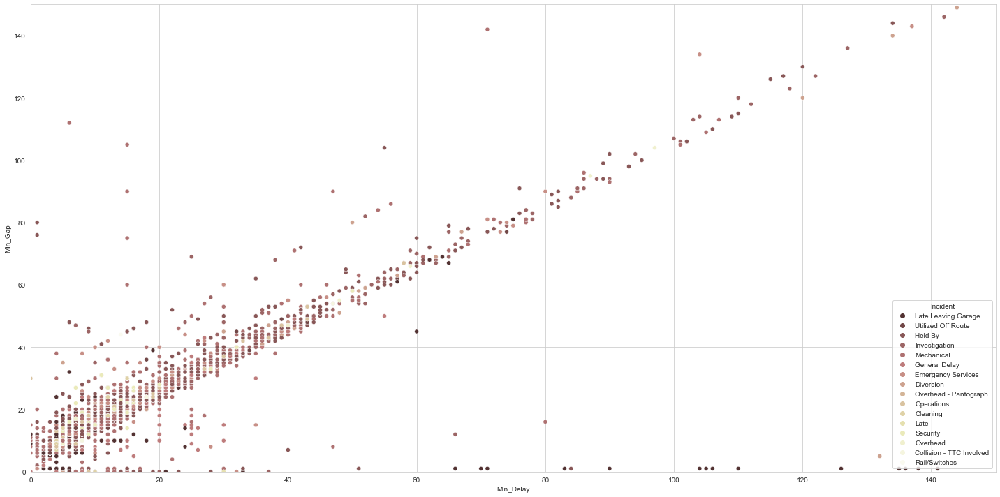

In [210]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='pink')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### plasma

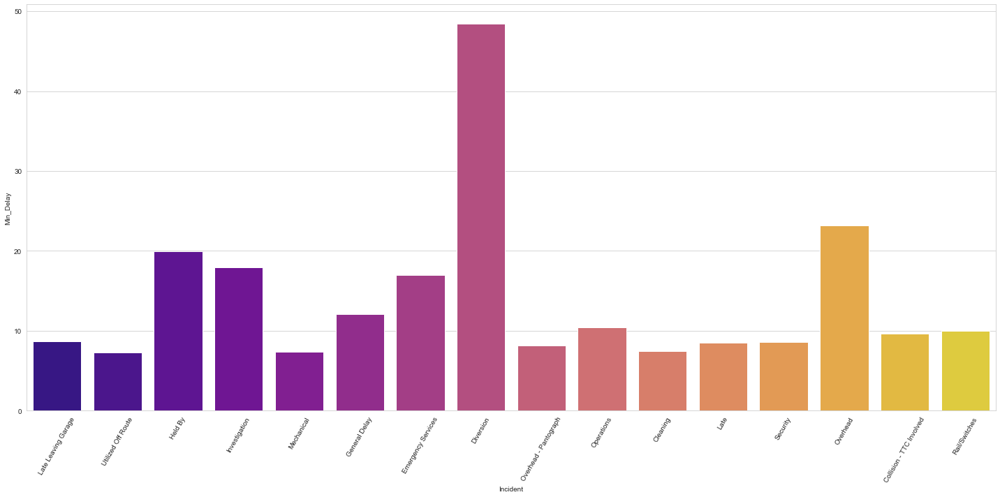

In [213]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='plasma', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

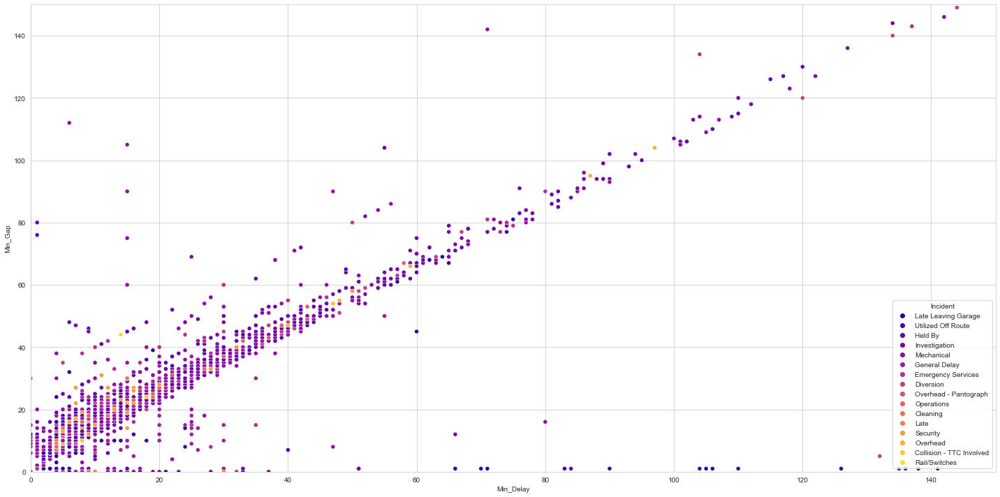

In [212]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='plasma')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### prism

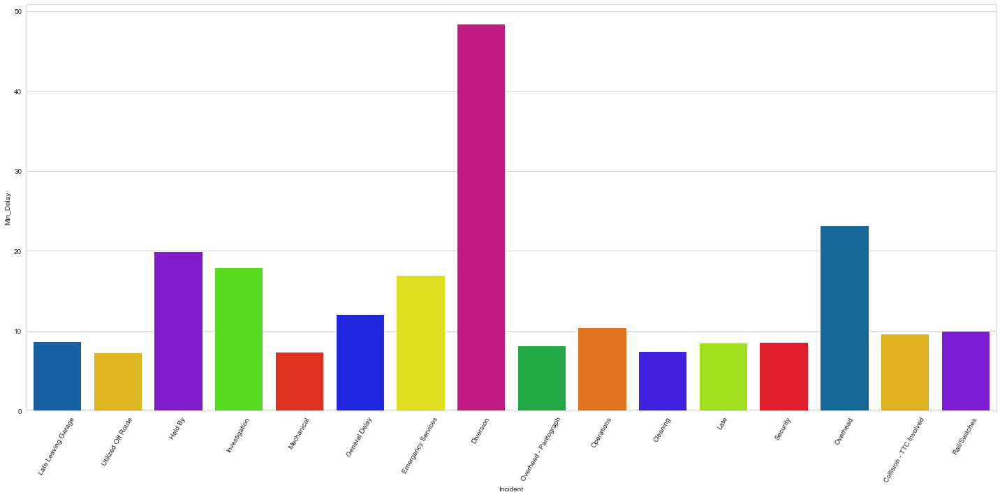

In [214]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='prism', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

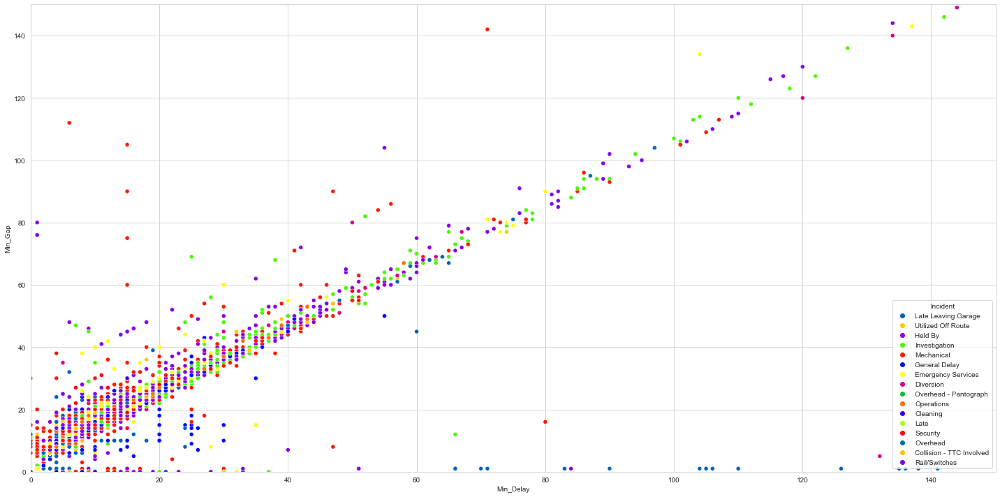

In [215]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='prism')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### rainbow

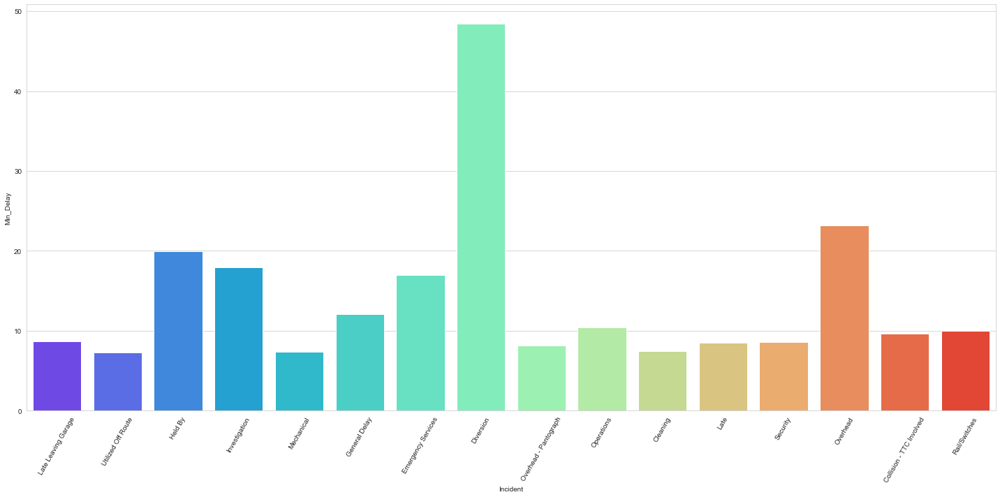

In [218]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='rainbow', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

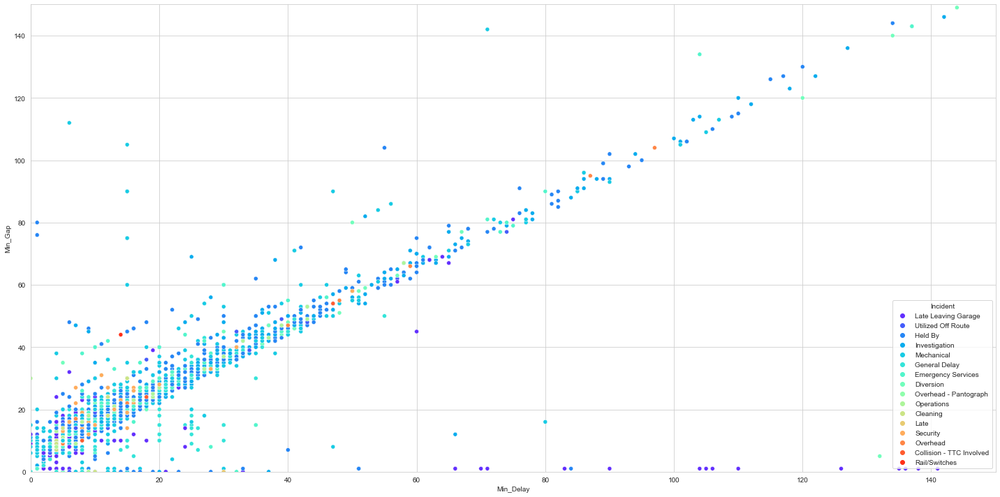

In [219]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='rainbow')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### rocket

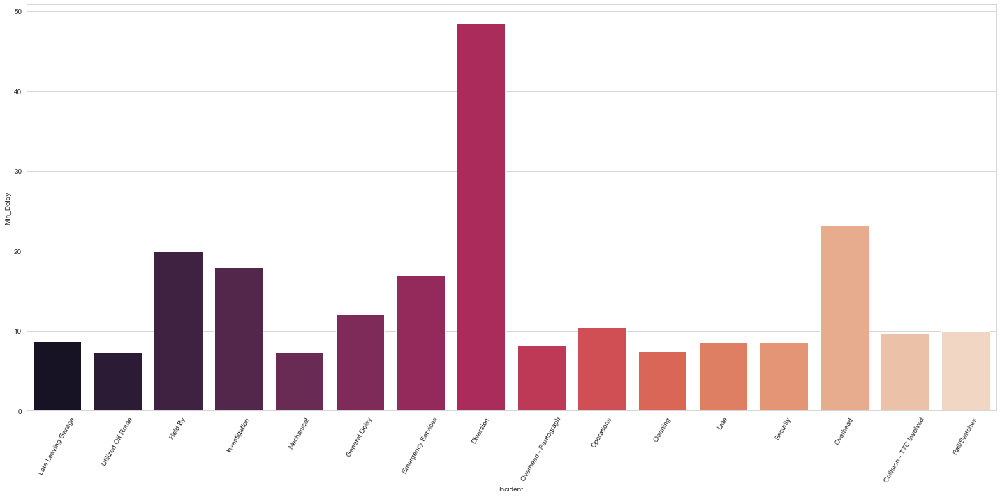

In [217]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='rocket', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

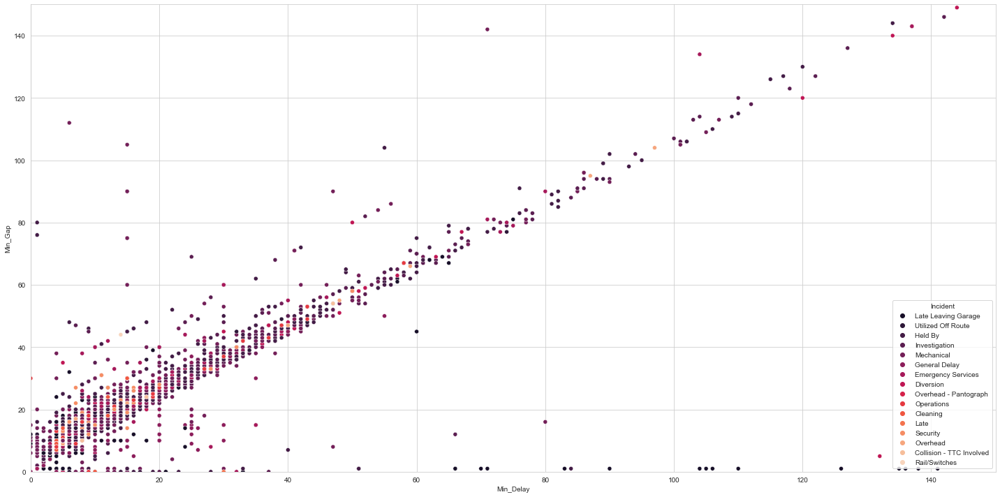

In [216]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='rocket')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### seismic

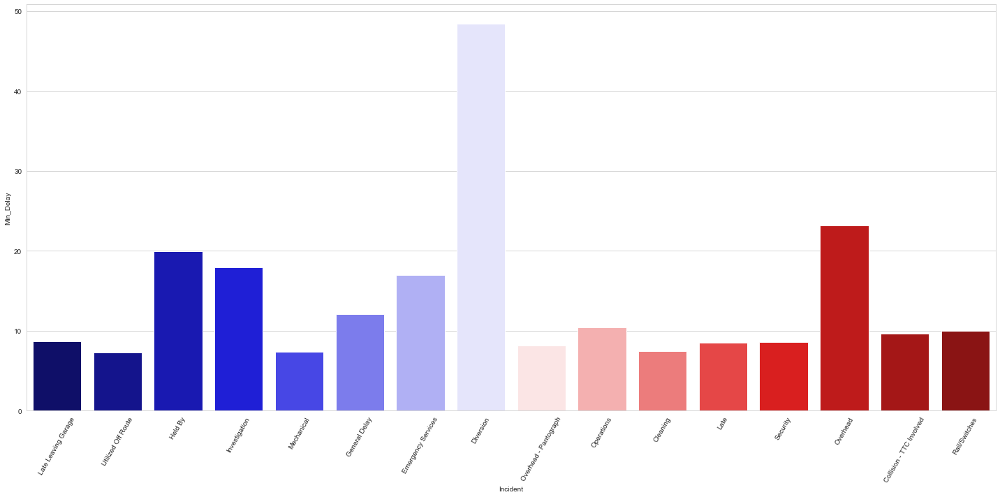

In [221]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='seismic', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

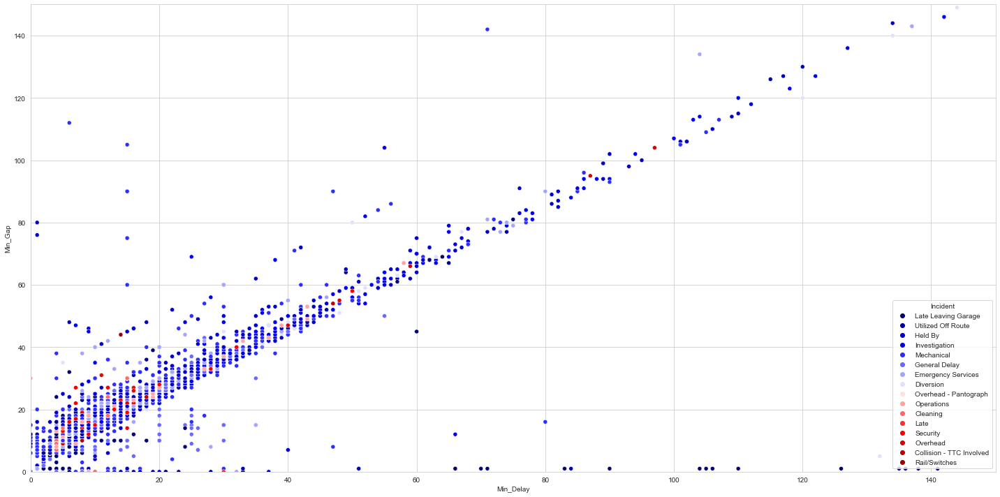

In [220]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='seismic')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### spring

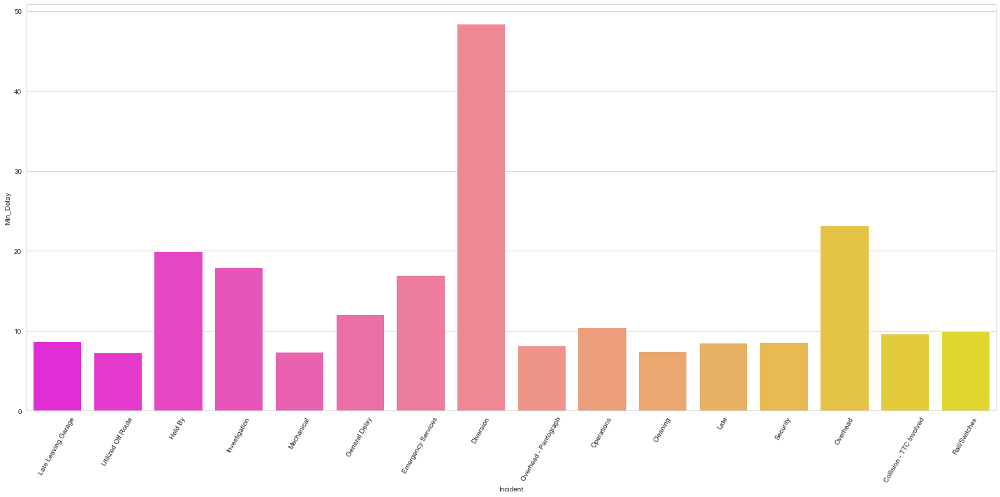

In [222]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='spring', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

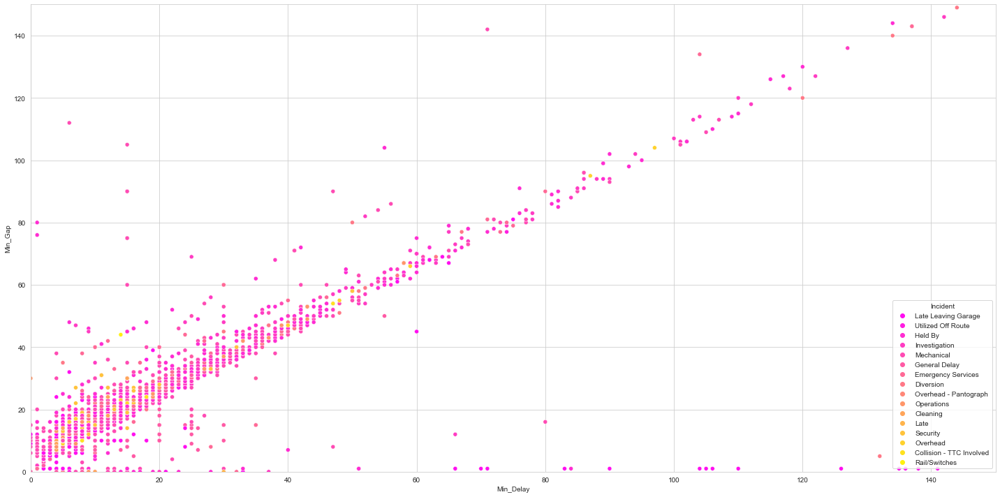

In [223]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='spring')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### summer

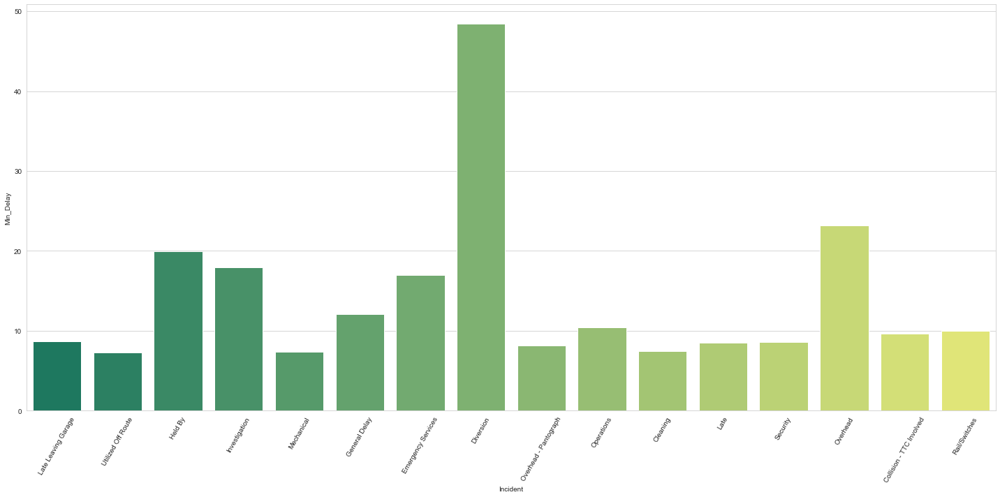

In [226]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='summer', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

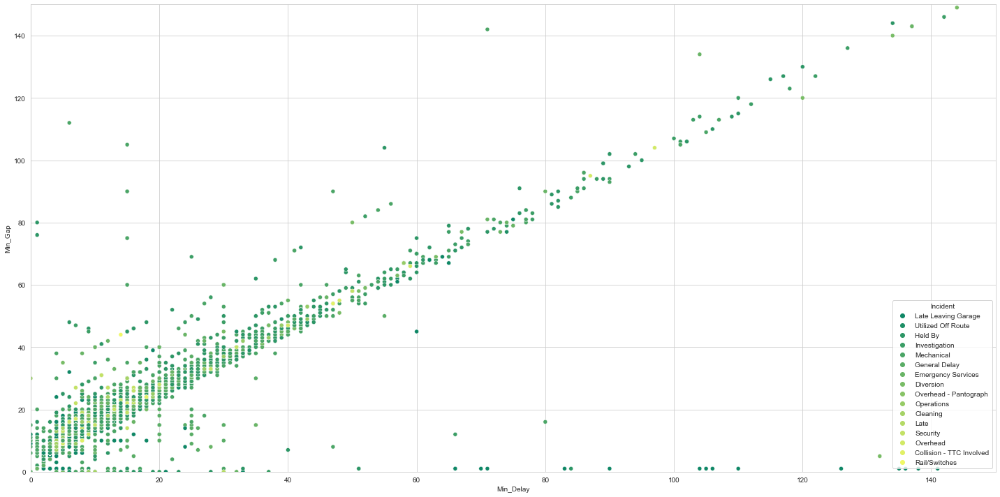

In [224]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='summer')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### tab10

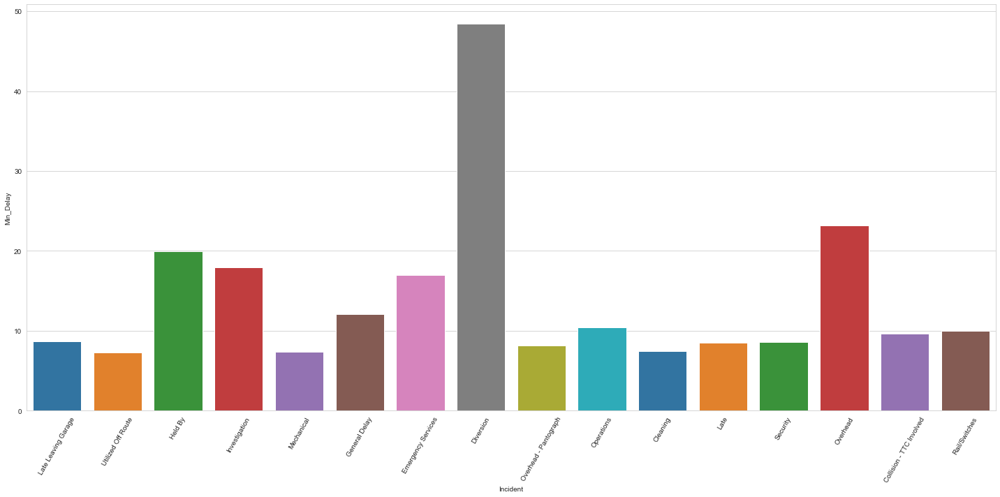

In [227]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='tab10', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

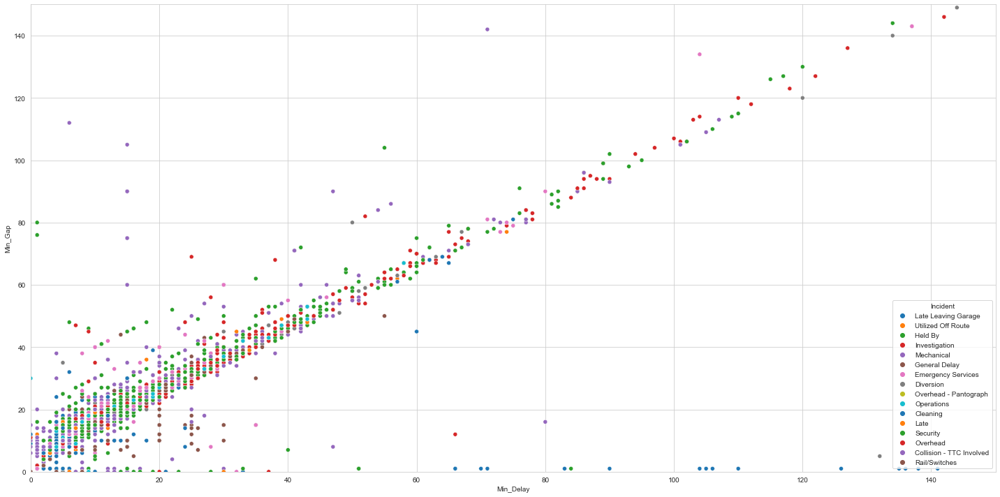

In [228]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='tab10')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### tab20

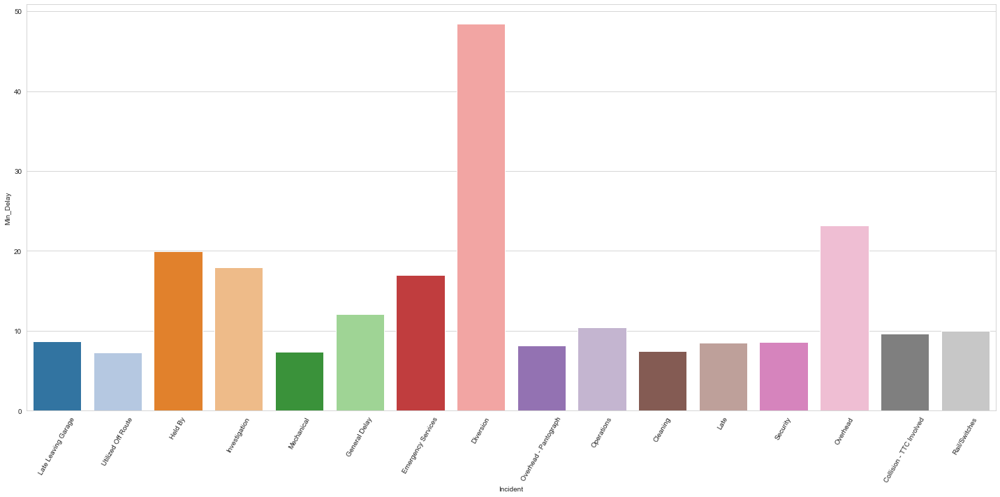

In [230]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='tab20', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

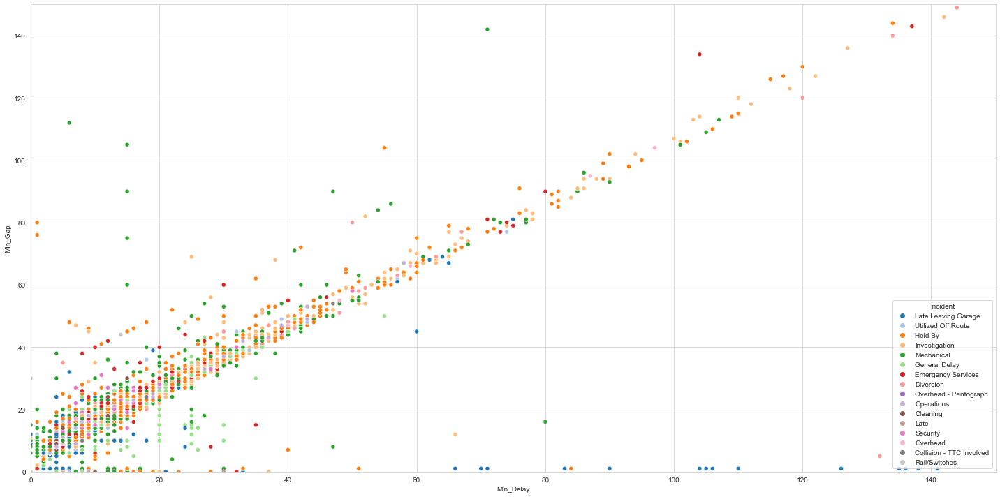

In [229]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='tab20')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### tab20b

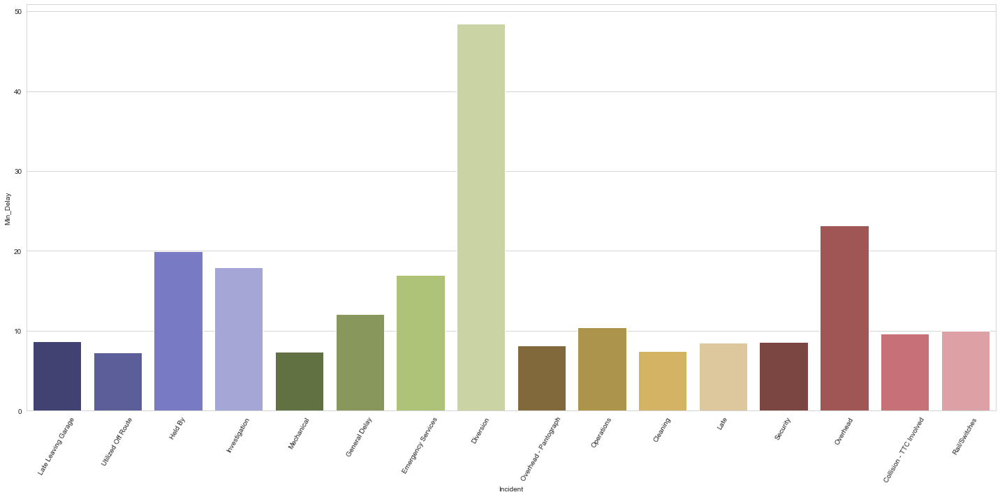

In [231]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='tab20b', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

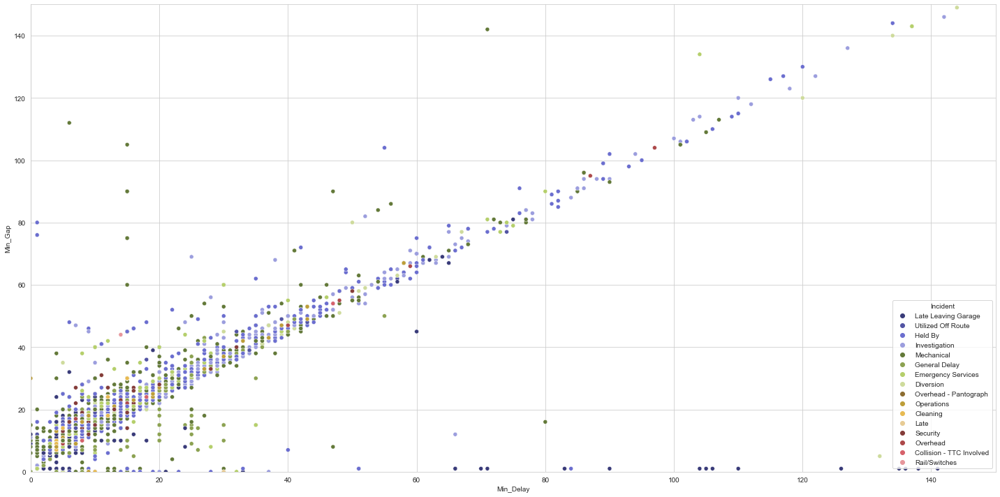

In [232]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='tab20b')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### tab20c

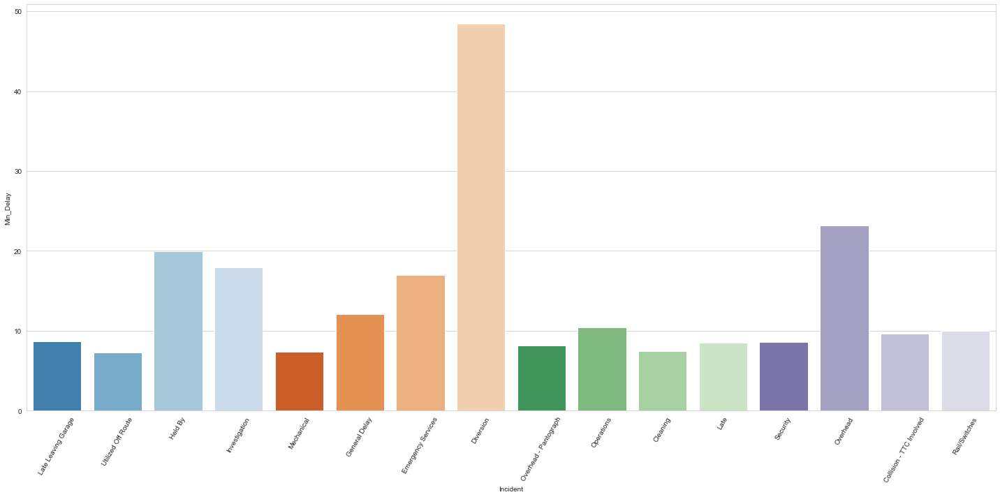

In [234]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='tab20c', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

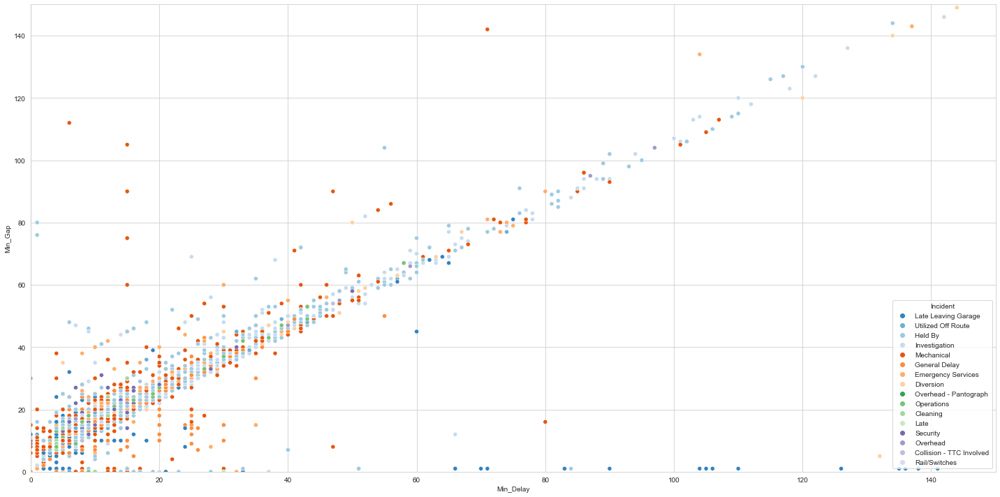

In [233]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='tab20c')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### terrain

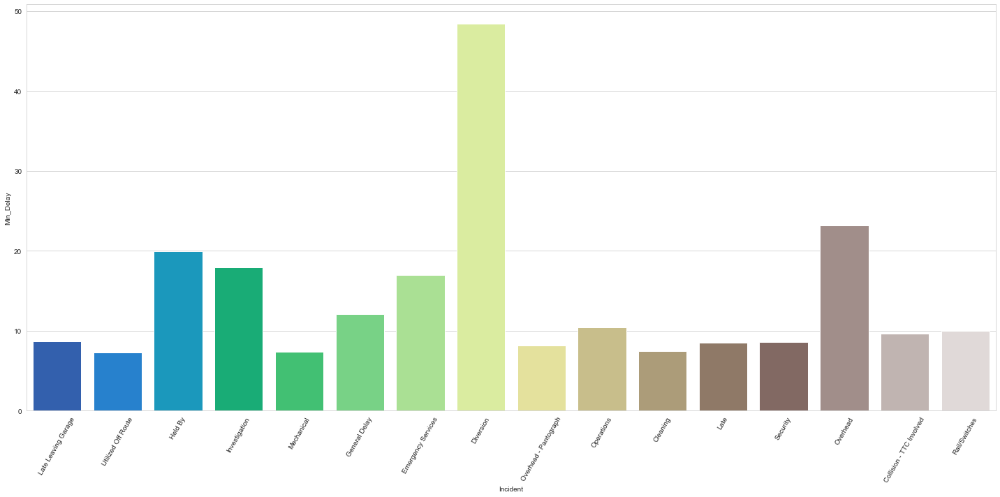

In [235]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='terrain', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

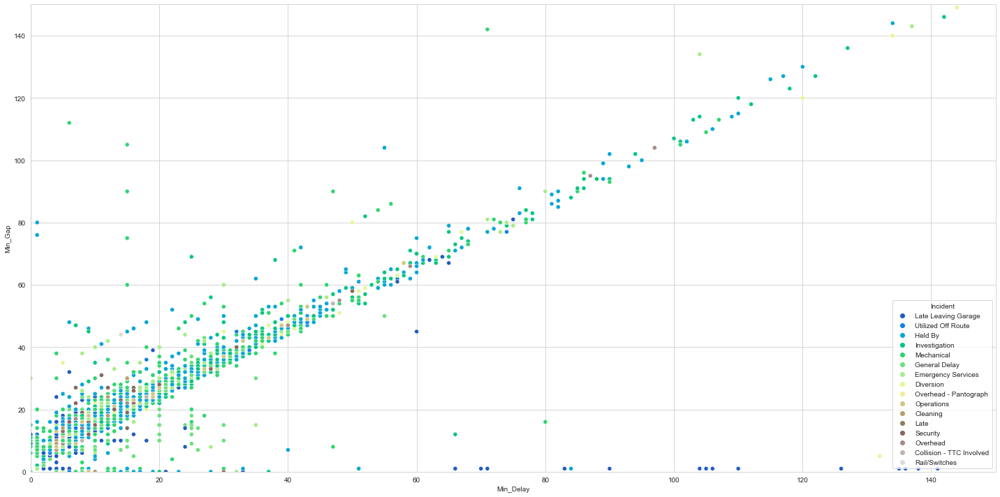

In [236]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='terrain')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### turbo

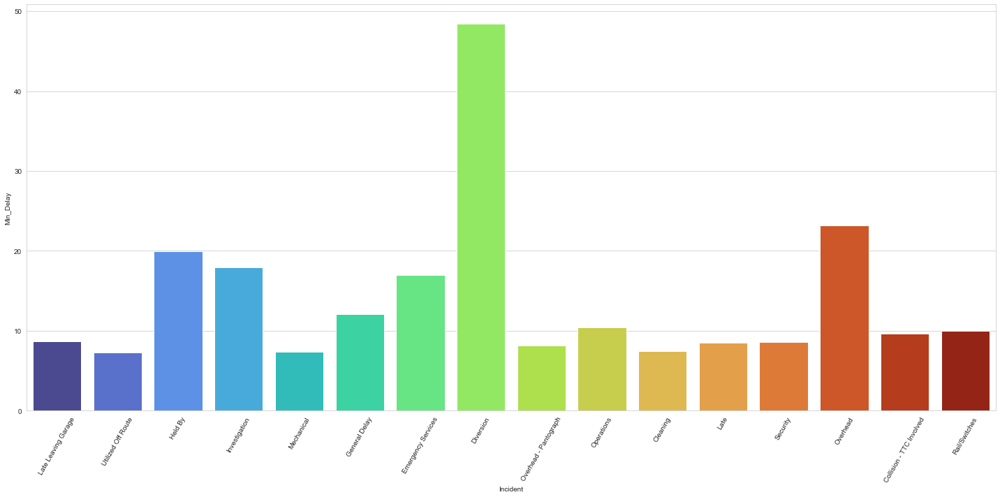

In [238]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='turbo', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

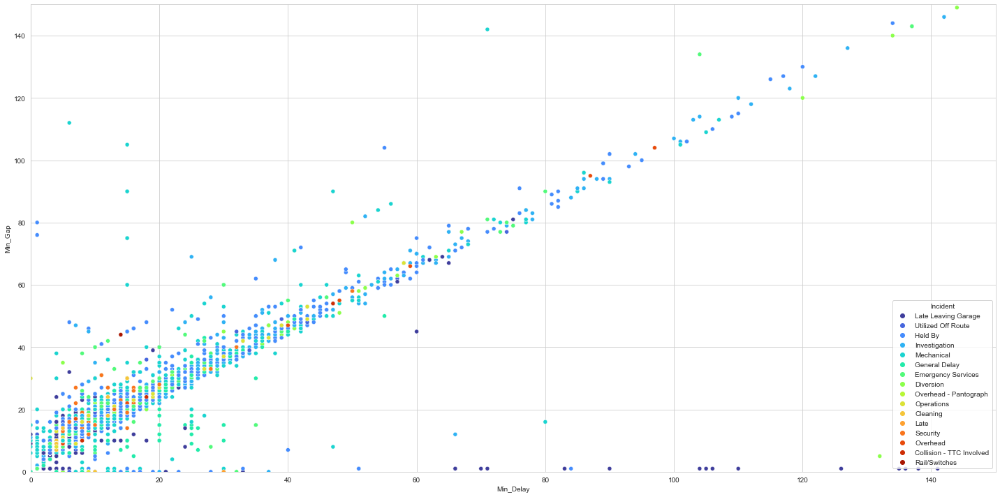

In [237]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='turbo')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### twilight

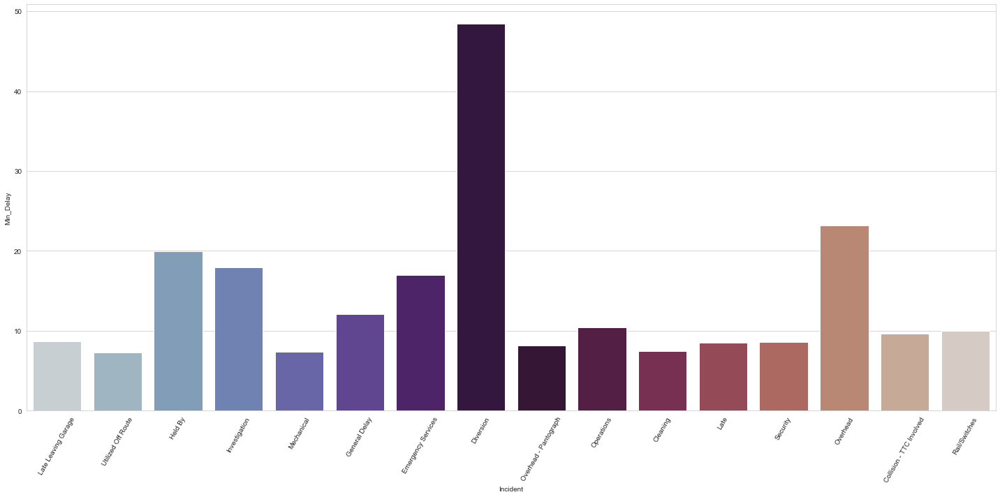

In [239]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='twilight', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

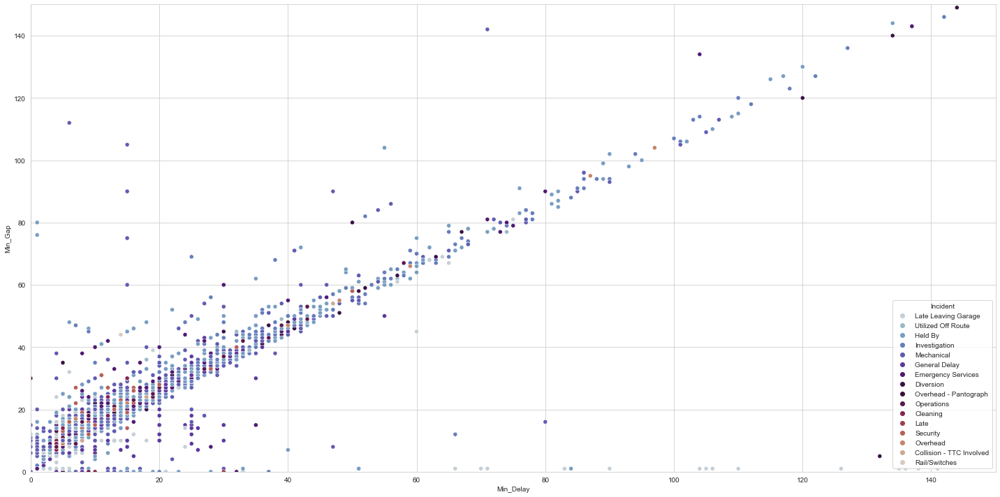

In [241]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='twilight')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### twilight_shifted

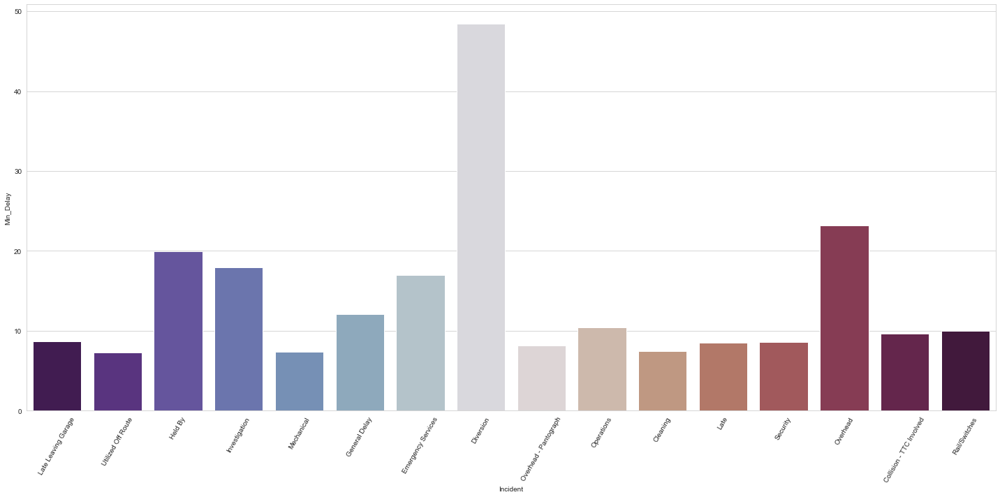

In [243]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='twilight_shifted', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

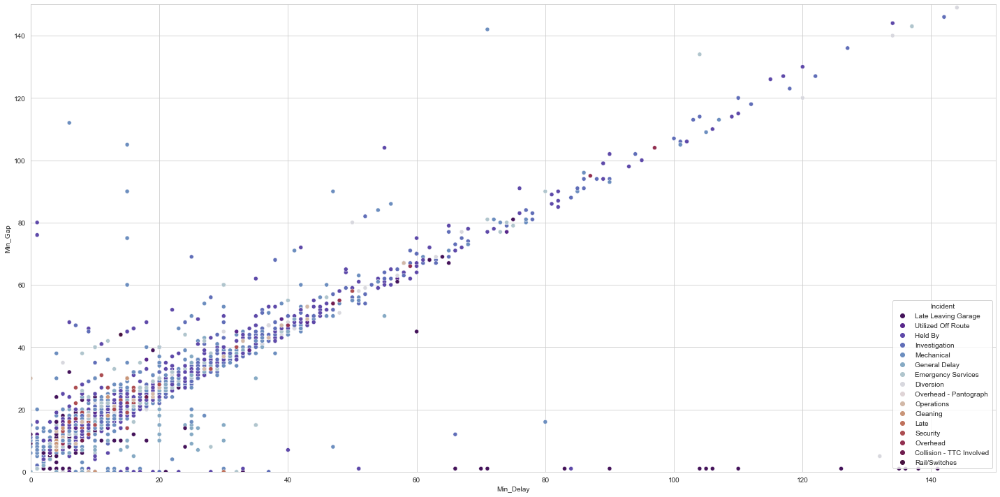

In [242]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='twilight_shifted')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### viridis

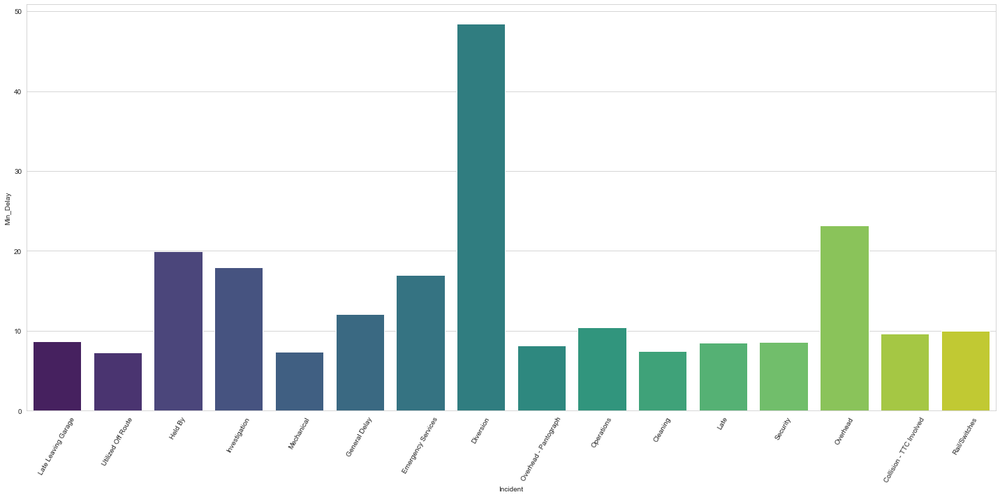

In [244]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='viridis', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

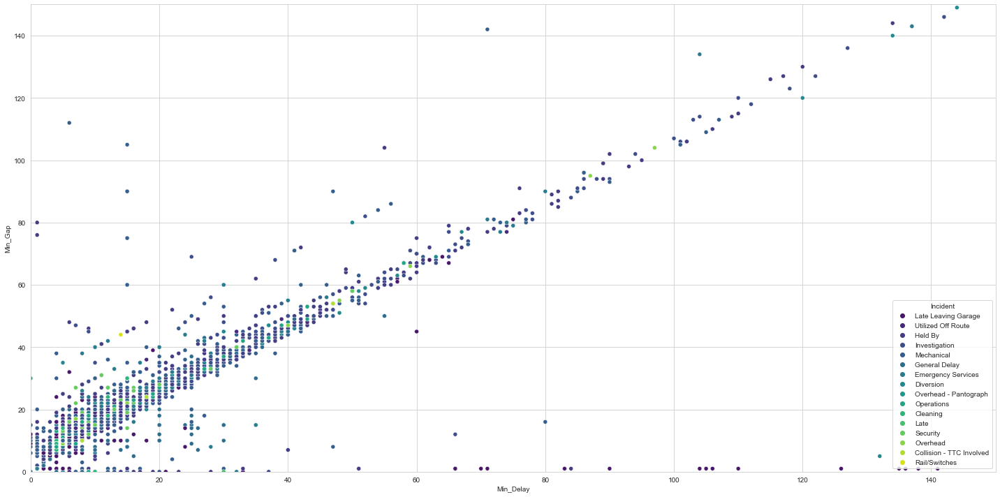

In [245]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='viridis')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### vlag

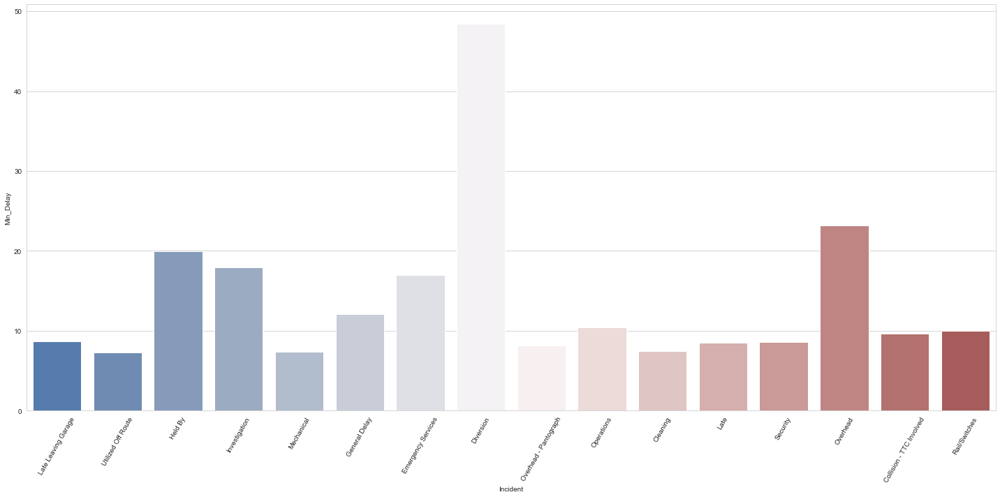

In [247]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='vlag', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

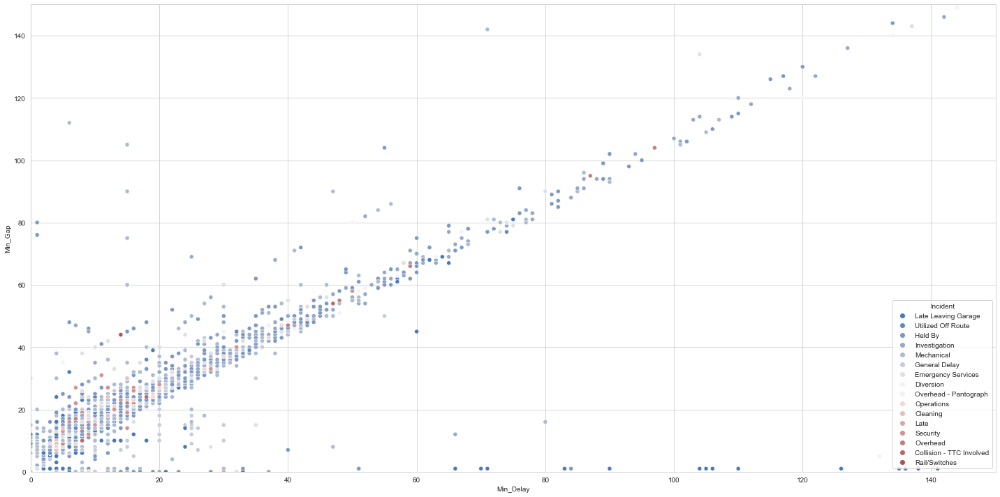

In [246]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='vlag')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))

### winter

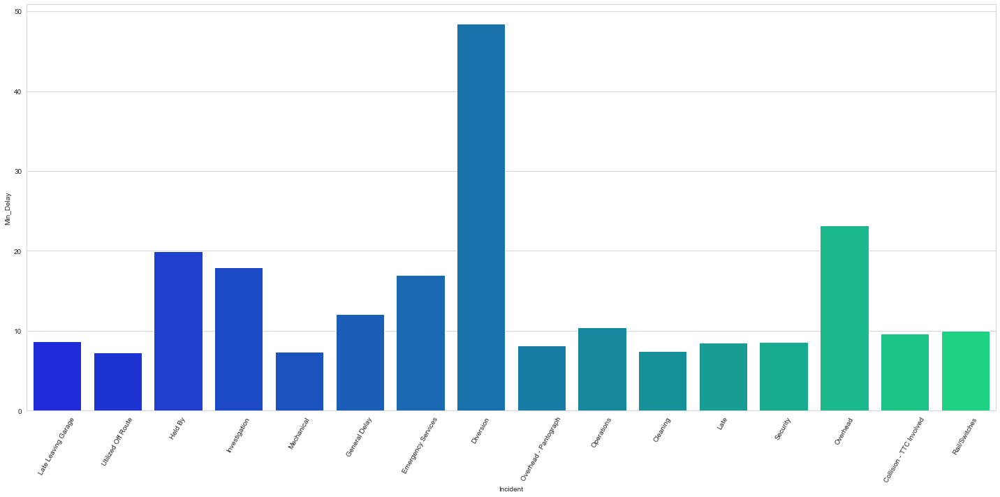

In [248]:
plt.figure(figsize=(20,10), tight_layout=True)
ax = sns.barplot(x=df['Incident'], y=df['Min_Delay'], palette='winter', ci=None)
plt.xticks(rotation=60)
plt.show()

[(0.0, 150.0)]

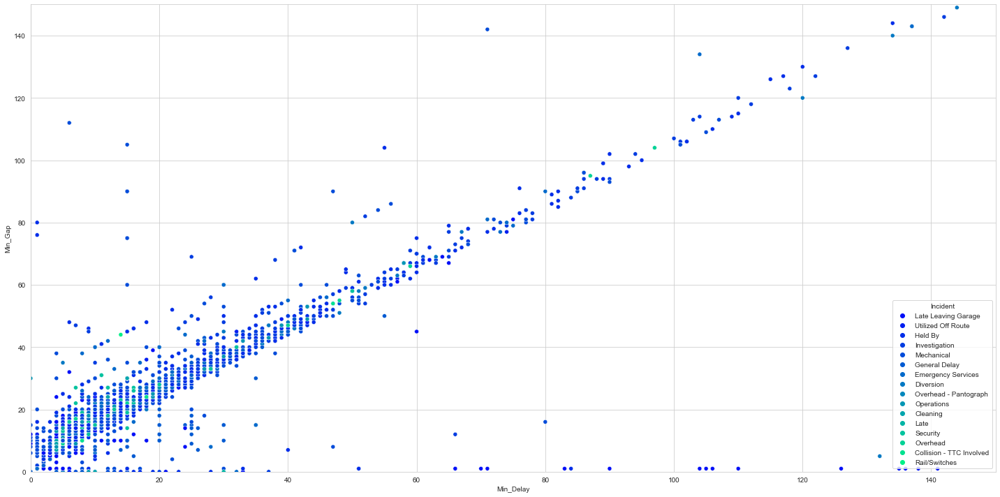

In [249]:
plt.figure(figsize=(20,10), tight_layout=True)
sns.set_style(style='whitegrid')
ax = sns.scatterplot(x=df['Min_Delay'], y=df['Min_Gap'], hue=df['Incident'], palette='winter')
ax.set(ylim=(0, 150))
ax.set(xlim=(0, 150))